## Importing Libraries


In [1]:
# Data analysis tools
import pandas as pd
import numpy as np
import itertools
from scipy import stats

# Evaluation Visualization Tools
from pandas_profiling import ProfileReport
import seaborn as sns
import scikitplot as skplt
from scikitplot.metrics import plot_cumulative_gain, plot_calibration_curve, plot_lift_curve,plot_ks_statistic
from scikitplot.metrics import plot_precision_recall, plot_roc
from mlxtend.plotting import plot_learning_curves
from mlxtend.evaluate import bias_variance_decomp, lift_score
import matplotlib.pyplot as plt
%matplotlib inline

# Data Pre-Processing Libraries
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler, minmax_scale

# For Train-Test Split
from sklearn.model_selection import train_test_split

# warning filter
import warnings
warnings.filterwarnings("ignore")


# context managers
import copy
pd.set_option('display.max_columns',500)
pd.set_option('display.max_rows', 500)

#pipeline maker
from imblearn.pipeline import Pipeline, make_pipeline

# Libraries for various Algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# Cross-validation
from sklearn.model_selection import StratifiedKFold, GridSearchCV, RandomizedSearchCV, cross_val_score

# Oversampling for treating class Imbalance
from imblearn.over_sampling import SMOTE
from collections import Counter

# Dimentionality Reduction
from sklearn.decomposition import PCA

# Metrics Tools
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score, recall_score, precision_score, roc_auc_score, f1_score
from sklearn.metrics import plot_precision_recall_curve, plot_roc_curve

# feature importances
from lightgbm import plot_importance

# Model dumping
import joblib

print("Done")

Done


## Loading  and combining data

In [2]:
%%time

folder_path = 'C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/'
train_identity = pd.read_csv(f'{folder_path}train_identity.csv')
train_transaction = pd.read_csv(f'{folder_path}train_transaction.csv')
test_identity = pd.read_csv(f'{folder_path}test_identity.csv')
test_transaction = pd.read_csv(f'{folder_path}test_transaction.csv')

# combine the transaction and identity dataset 

train = pd.merge(train_transaction, train_identity, on='TransactionID', how='left')
test = pd.merge(test_transaction, test_identity, on='TransactionID', how='left')
del train_identity, train_transaction, test_identity, test_transaction

Wall time: 49.8 s


In [9]:
!pip install ipywidgets

In [3]:
profile_train = ProfileReport(train, title='Train Profiling Report', explorative=True)

In [4]:
profile_test = ProfileReport(test, title='Test Profiling Report', explorative=True)

In [ ]:
profile_train

Summarize dataset:   0%|          | 0/447 [00:00<?, ?it/s]

In [ ]:
profile_test

## Preforming Basic  Checks 

In [123]:
#Checking weather test columns is same as train columns: 
def train_col_not_in_test_cols(traincols, testcols):
    
    for i in traincols:
        
        if i not in testcols:
            
            print(i)
            
train_col_not_in_test_cols(train.columns, test.columns)

isFraud
id_01
id_02
id_03
id_04
id_05
id_06
id_07
id_08
id_09
id_10
id_11
id_12
id_13
id_14
id_15
id_16
id_17
id_18
id_19
id_20
id_21
id_22
id_23
id_24
id_25
id_26
id_27
id_28
id_29
id_30
id_31
id_32
id_33
id_34
id_35
id_36
id_37
id_38


Checking train ID and test ID column

In [124]:
train

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.50,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,117.000000,0.000000,0.0,0.000000,0.0,0.0,117.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,117.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,117.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.00,W,2755,404.0,150.0

In [125]:
test

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,id-10,id-11,id-12,id-13,id-14,id-15,id-16,id-17,id-18,id-19,id-20,id-21,id-22,id-23,id-24,id-25,id-26,id-27,id-28,id-29,id-30,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,3663549,18403224,31.950,W,10409,111.0,150.0,visa,226.0,debit,170.0,87.0,1.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,3.0,4.0,0.0,0.0,6.0,0.0,5.0,1.0,115.0,6.0,419.0,419.0,27.0,398.0,27.0,NaN,NaN,NaN,NaN,418.0,203.0,NaN,NaN,NaN,409.0,T,T,F,NaN,NaN,F,T,T,T,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,47.950001,0.000000,0.000000,47.950001,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,47.950001,0.000000,0.000000,47.950001,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.000,W,4272,111.0,150.0,v

In [126]:
#renaming test id columns to match train data columns:
test = test.rename(columns = {"id-01": "id_01", "id-02": "id_02", "id-03": "id_03", 
                            "id-06": "id_06", "id-05": "id_05", "id-04": "id_04", 
                            "id-07": "id_07", "id-08": "id_08", "id-09": "id_09", 
                            "id-10": "id_10", "id-11": "id_11", "id-12": "id_12", 
                            "id-15": "id_15", "id-14": "id_14", "id-13": "id_13", 
                            "id-16": "id_16", "id-17": "id_17", "id-18": "id_18", 
                            "id-21": "id_21", "id-20": "id_20", "id-19": "id_19", 
                            "id-22": "id_22", "id-23": "id_23", "id-24": "id_24", 
                            "id-27": "id_27", "id-26": "id_26", "id-25": "id_25", 
                            "id-28": "id_28", "id-29": "id_29", "id-30": "id_30", 
                            "id-31": "id_31", "id-32": "id_32", "id-33": "id_33", 
                            "id-34": "id_34", "id-35": "id_35", "id-36": "id_36", 
                            "id-37": "id_37", "id-38": "id_38"})
test.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,170.0,87.0,1.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,3.0,4.0,0.0,0.0,6.0,0.0,5.0,1.0,115.0,6.0,419.0,419.0,27.0,398.0,27.0,NaN,NaN,NaN,NaN,418.0,203.0,NaN,NaN,NaN,409.0,T,T,F,NaN,NaN,F,T,T,T,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,47.950001,0.000000,0.000000,47.950001,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,47.950001,0.000000,0.000000,47.950001,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.00,W,4272,111.0,150.0,vis

In [127]:
sample_submission = pd.read_csv(f'{folder_path}sample_submission.csv')

In [128]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
train.sample(5)

The shape of train is: 590540, 434


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
117250,3104250,0,2291744,28.450,C,6585,406.0,117.0,mastercard,166.0,debit,NaN,NaN,NaN,NaN,gmail.com,gmail.com,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN,M2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-25.0,331619.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,NaN,Unknown,NaN,225.0,NaN,266.0,127.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,mobile safari 10.0,NaN,NaN,NaN,F,F,F,T,mobile,NaN
69195,3056195,0,1554901,25.361,C,16095,500.0,185.0,mastercard,224.0,cre

In [129]:
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))
test.sample(5)

The shape of test is: 506691, 433


,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
294892,3958441,28596456,80.00,W,16560,476.0,150.0,visa,126.0,debit,387.0,87.0,4.0,NaN,NaN,NaN,2.0,3.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0,9.0,1.0,95.0,95.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,94.0,55.0,NaN,NaN,NaN,95.0,T,T,F,M0,F,F,T,T,T,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,80.0,80.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0,80.0,80.0,80.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,2.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,157.0,157.0,157.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,157.0,157.0,157.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
137803,3801352,23147818,28.95,W,5291,442.0,150.0,visa,226.0,debit,204.0,87.0,0.0,NaN,gmail.com,NaN,91.0,84.0,0.0,0.0,180.0,81.0,

In [130]:
#collecting object columns

obj_cols = train.dtypes[train.dtypes == 'object'].index.to_list()
obj_cols

['ProductCD',
 'card4',
 'card6',
 'P_emaildomain',
 'R_emaildomain',
 'M1',
 'M2',
 'M3',
 'M4',
 'M5',
 'M6',
 'M7',
 'M8',
 'M9',
 'id_12',
 'id_15',
 'id_16',
 'id_23',
 'id_27',
 'id_28',
 'id_29',
 'id_30',
 'id_31',
 'id_33',
 'id_34',
 'id_35',
 'id_36',
 'id_37',
 'id_38',
 'DeviceType',
 'DeviceInfo']

In [131]:
# List of categorical features in feature engineering
cat_cols = ['id_12', 'id_13', 'id_14', 'id_15', 'id_16', 'id_17', 'id_18', 'id_19', 'id_20', 
            'id_21', 'id_22', 'id_23', 'id_24', 'id_25', 'id_26', 'id_27', 'id_28', 'id_29',
            'id_30', 'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 
            'DeviceType', 'DeviceInfo', 'ProductCD','card1', 'card2', 'card3', 'card4', 'card5', 
            'card6', 'addr1', 'addr2', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 
            'P_emaildomain', 'R_emaildomain']

###  Missing Value Detection
- The datasets have a big proportion of missing values, over 47.93% of features have more than 70% missing value.
- Train and test sets have similar percentage of features with missing values in different percentage.
- There are 2.76 percent of features have more than 90% of missing value and 2.07 percent of features have more than 99% of missing value. So we can consider to remove these features after column-wise analysis.
- There are 1 features, which is V107, in ***test set*** with only one unique value. We will take a closer look of V107 in both train and test datasets and decide whether to remove it as only one unique value might represent it doesn't contain any useful information.

In [132]:
def detectmissing(df):
    summary = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing(%)'] = df.isnull().sum().values / train.shape[0]*100  
    summary['Uniques'] = df.nunique().values
    
    return summary

In [133]:
train_missing = detectmissing(train)

In [134]:
test_missing = detectmissing(test)

In [135]:
print("Missing value in the train set:")    
for i in [0, 10, 20, 40, 70, 80, 90, 99]:
    print("%0.2f percent of features have more than " % ((len(train_missing[train_missing['Missing(%)'] > i])/ 
                                                          train.shape[1])*100) + str(i) + "% of missing value")

print('-'*70)

print("Missing value in the test set:")
for i in [0, 10, 20, 40, 70, 80, 90, 99]:
    print("%0.2f percent of features have more than " % ((len(test_missing[test_missing['Missing(%)'] > i])/
                                                          test.shape[1])*100) + str(i) + "% of missing value")

Missing value in the train set:
95.39 percent of features have more than 0% of missing value
74.19 percent of features have more than 10% of missing value
58.06 percent of features have more than 20% of missing value
53.46 percent of features have more than 40% of missing value
47.93 percent of features have more than 70% of missing value
17.05 percent of features have more than 80% of missing value
2.76 percent of features have more than 90% of missing value
2.07 percent of features have more than 99% of missing value
----------------------------------------------------------------------
Missing value in the test set:
88.91 percent of features have more than 0% of missing value
58.89 percent of features have more than 10% of missing value
53.81 percent of features have more than 20% of missing value
48.73 percent of features have more than 40% of missing value
16.40 percent of features have more than 70% of missing value
2.08 percent of features have more than 80% of missing value
0.0

In [136]:
def top_missing_cols(df,n=None,thresh=50):
    """
    returns missing columns in dataframe with missing values percent > thresh
    if n=None. It will give whole dataframe with missing values percent > thresh
    """
    
    dff = (df.isnull().sum()/df.shape[0])*100
    dff = dff.reset_index()
    dff.columns = ['col','missing_percent']
    dff = dff.sort_values(by=['missing_percent'],ascending=False).reset_index(drop=True)
    print(f'There are {df.isnull().any().sum()} columns in this dataset with missing values.')
    print(f'There are {dff[dff["missing_percent"] > thresh].shape[0]} columns with missing percent values than {thresh}%')
    print()
    if n:
        return dff.head(n)
    else:
        return dff
    
  

In [137]:
top_missing_cols(train,thresh =70)

There are 414 columns in this dataset with missing values.
There are 208 columns with missing percent values than 70%



,col,missing_percent
0,id_24,99.196159
1,id_25,99.130965
2,id_07,99.127070
3,id_08,99.127070
4,id_21,99.126393
5,id_26,99.125715
6,id_27,99.124699
7,id_23,99.124699
8,id_22,99.124699
9,dist2,93.628374


In [138]:
top_missing_cols(test, thresh = 70)

There are 385 columns in this dataset with missing values.
There are 208 columns with missing percent values than 70%



,col,missing_percent
0,id_24,99.064519
1,id_25,99.005508
2,id_26,99.003929
3,id_21,99.001561
4,id_08,99.001561
5,id_07,99.001561
6,id_27,99.000969
7,id_23,99.000969
8,id_22,99.000969
9,dist2,92.809030


The features with over 70% missing value in Train are concentrated in D, V, and id columns

Droping columns with >95 missing value 

In [139]:
#Drop list:
drop_list= ['id_24','id_25','id_07','id_08','id_21','id_26','id_27','id_23','id_22']

In [140]:
#Droping columns on train data 
train.drop(drop_list,axis=1,inplace=False)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.50,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,117.000000,0.000000,0.0,0.000000,0.0,0.0,117.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,117.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,117.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.00,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,

In [141]:
#Droping columns on test data 
test.drop(drop_list,axis=1,inplace=False)

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,3663549,18403224,31.950,W,10409,111.0,150.0,visa,226.0,debit,170.0,87.0,1.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,3.0,4.0,0.0,0.0,6.0,0.0,5.0,1.0,115.0,6.0,419.0,419.0,27.0,398.0,27.0,NaN,NaN,NaN,NaN,418.0,203.0,NaN,NaN,NaN,409.0,T,T,F,NaN,NaN,F,T,T,T,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,47.950001,0.000000,0.000000,47.950001,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,47.950001,0.000000,0.000000,47.950001,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.000,W,4272,111.0,150.0,visa,226.0,debit,299.0,87.0,4.0,NaN,aol.com,NaN,3.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0

### Single Value Variable Detection

In [142]:
one_unique_col_train = [i for i in train.columns if train[i].nunique() == 1]
one_unique_col_test = [i for i in test.columns if test[i].nunique() == 1]

print("There are %d features in train set with only one unique value" % len(one_unique_col_train))
print("There are %d features in test set with only one unique value" % len(one_unique_col_test))
print("The feature is %s" % one_unique_col_test[0])

There are 0 features in train set with only one unique value
There are 1 features in test set with only one unique value
The feature is V107


Let's drop V107

In [143]:
train.drop(columns='V107',inplace=True)
test.drop(columns='V107',inplace=True)

In [144]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 590540, 433
The shape of test is: 506691, 432


## Exploratory Data Analysis


## Description of Variables

**Continuous Variables**

``TransactionDT``: timedelta from a given reference datetime (not an actual timestamp)

``TransactionAMT``: transaction payment amount in USD

``dist``: May be the distance from addresses

``C1-C14``: counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.

``D1-D15``: timedelta, such as days between previous transaction, etc.

``V1`` - ``V339``: Pre-Engineered features, including ranking, counting, and other entity relations.

``id_01`` - ``id_11``(In identity table)

**Categorical Variables**

From **Transaction** Table:

``ProductCD``: product code, the product for each transaction

``card1`` - ``card6``: payment card information, such as card type, card category, issue bank, country, etc.

``addr1``, ``addr2``: 
both are for purchaser,
addr1 as billing region,
addr2 as billing country

``Pemaildomain``, ``Remaildomain``: purchaser and recipient email domain

``M1`` - ``M9``: match, such as names on card and address, etc.

From **Identity** Table:

Variables in this table are identity information – network connection information (IP, ISP, Proxy, etc) and digital signature (UA/browser/os/version, etc) associated with transactions.
They're collected by the companies fraud protection system and digital security partners.

``id12`` - ``id38``, ``DeviceType``, ``DeviceInfo``

### isFraud - Target Variable
The data is Extremely imbalanced, only 3.50% of Transactions that are fraudulent in the train dataset.

**We are predicting fraudulent customers using their identity, address,region and cards transaction details.Once a customer has been identified for commiting fraud, their entire account is flagged as 1(isFraud) in the label column**

In [145]:
train[['isFraud']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 590540 entries, 0 to 590539
Data columns (total 1 columns):
 #   Column   Non-Null Count   Dtype
---  ------   --------------   -----
 0   isFraud  590540 non-null  int64
dtypes: int64(1)
memory usage: 9.0 MB


Text(0, 0.5, 'Percentage')

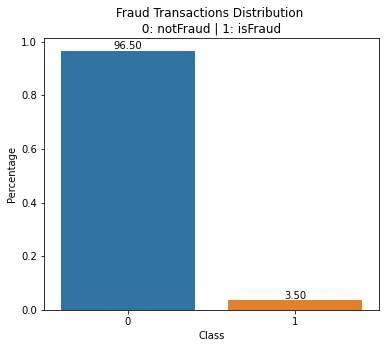

In [146]:
plt.figure(figsize=(6, 5))
yaxis = train['isFraud'].value_counts().values / train.shape[0]
barplot = sns.barplot(x=[0,1], y=yaxis )
plt.title("Fraud Transactions Distribution \n 0: notFraud | 1: isFraud ")
for p in barplot.patches:
    barplot.annotate(format(p.get_height()*100, '.2f'), (p.get_x() + p.get_width() / 2.,\
                                                         p.get_height()), ha = 'center', va = 'center',\
                                                         xytext = (0, 5), textcoords = 'offset points')
plt.xlabel('Class')
plt.ylabel('Percentage')

### TransactionDT - timedelta from a given reference datetime
- The TransactionDT is in seconds (i.e) timedelta foramt.
- Therefore,new columns such as hour, day, week, month can be created to take a closer look to the time and target 
- From the distribution of TransactionDT(bin in minute), train and test datasets are in different time periods, thus splitting data by the time order can be a reasonable practice.
- It seems that in the hours from 4am to 12pm the fraction of fraudulent transaction is significantly higher than other hours. And from hour 2pm to 4pm, the fractions of fraud is the lowest. While from 7am to 10am the fraction is the highest. So we can create another new feature, classifying time periods into different levels of warning sign in terms of their fraud fraction.
- Modelling using year or month cant be done as only one year of data has been provided, we won't be able to learn any trends. There is a chance for day of the week and hour being useful.

In [147]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 590540, 433
The shape of test is: 506691, 432


In [148]:
train[['TransactionDT']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 590540 entries, 0 to 590539
Data columns (total 1 columns):
 #   Column         Non-Null Count   Dtype
---  ------         --------------   -----
 0   TransactionDT  590540 non-null  int64
dtypes: int64(1)
memory usage: 9.0 MB


In [149]:
train_span = (train['TransactionDT'].max() - train['TransactionDT'].min())/(3600*24)
test_span = (test['TransactionDT'].max() - test['TransactionDT'].min())/(3600*24)
total_span = (test['TransactionDT'].max() - train['TransactionDT'].min())/(3600*24)
gap_span = (test['TransactionDT'].min() - train['TransactionDT'].max())/(3600*24)
print('Time span of Train dataset is {:.2f} days'.format(train_span))
print('Time span of Test dataset is {:.2f} days'.format(test_span))
print('Time span of Total dataset is {:.2f} days'.format(total_span))
print('Time gap between train and test is {:.2f} days'.format(gap_span))

Time span of Train dataset is 182.00 days
Time span of Test dataset is 183.00 days
Time span of Total dataset is 395.00 days
Time gap between train and test is 30.00 days


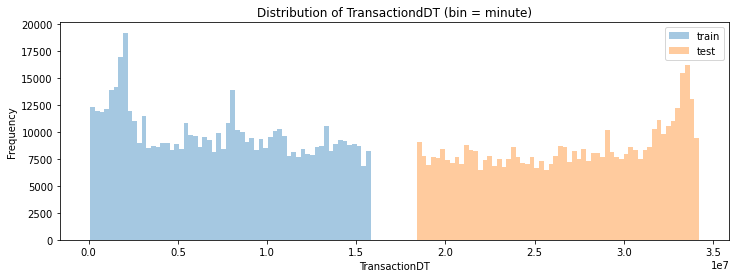

In [150]:
plt.figure(figsize=(12,4))
sns.distplot(train['TransactionDT'],kde=False,bins=60)
sns.distplot(test['TransactionDT'],kde=False,bins=60)
plt.legend(['train', 'test'])
plt.ylabel('Frequency')
plt.title('Distribution of TransactiondDT (bin = minute)');
plt.show()

It is clear from the distribution of TransactionDT(bin in minute) graph above, train and test datasets are in different time periods, thus splitting data by the time order can be a reasonable practice. And it seems that in the first month in train and last month in test, transaction frequency is higher than other months.

In [151]:
train['day'] = ((train['TransactionDT']//(3600*24)-1)%7)+1
test['day'] = ((test['TransactionDT']//(3600*24)-1)%7)+1

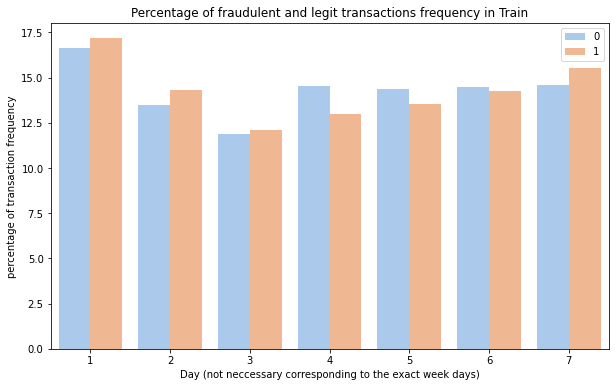

In [152]:
train_day = train.groupby('isFraud')['day'].value_counts(normalize=True).rename('percentage').\
             mul(100).reset_index().sort_values('day')
plt.figure(figsize=(10,6))
barplot = sns.barplot(x="day", y="percentage", hue="isFraud", data=train_day, palette = 'pastel')
plt.legend()
plt.ylabel('percentage of transaction frequency')
plt.xlabel('Day (not neccessary corresponding to the exact week days)')
plt.title('Percentage of fraudulent and legit transactions frequency in Train')
plt.show()

Not much finding. On average, day 1 has higher transaction frequency, both in fraud and legit transactions.

In [153]:
train['hour'] = ((train['TransactionDT']//3600)%24)+1
test['hour'] = ((test['TransactionDT']//3600)%24)+1

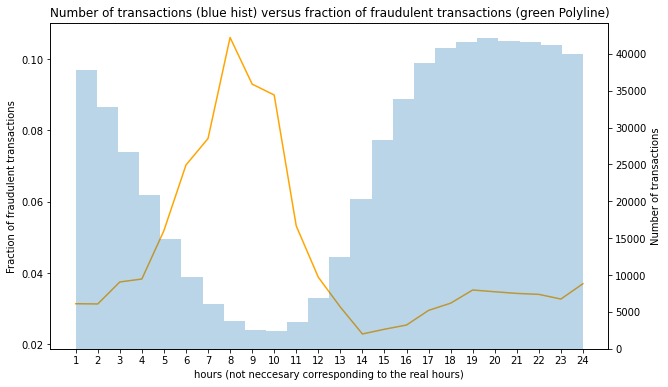

In [155]:
plt.figure(figsize=(10,6))
plt.plot(train.groupby('hour').mean()['isFraud'], color='orange')
ax = plt.gca()
ax2 = ax.twinx()
_ = ax2.hist(train['hour'], alpha=0.3, bins=24)
ax.set_xlabel('hours (not neccesary corresponding to the real hours)')
ax.set_ylabel('Fraction of fraudulent transactions')
ax2.set_ylabel('Number of transactions')
plt.title('Number of transactions (blue hist) versus fraction of fraudulent transactions (green Polyline)')
plt.xticks(np.arange(1, 25, 1))
plt.show()

From the graph above, it seems that from 4am to 12pm the fraction of fraud is significantly higher than other hours. From 2pm (14) to 4pm (16), the fractions of fraud is the lowest. While from 7am to 10am the fraction is the highest. So we can create a new feature in terms of this.

In [156]:
def new_hr_feature(hr):
    if hr >= 7 and hr < 10:
        return "highfraudwarning"
    if hr >= 14 and hr < 16:
        return "lowestfraudwarning"
    if (hr >= 4 and hr < 7) or (hr >= 10 and hr < 14):
        return "mediumfraudwarning"
    else:
        return "lowfraudwarning"
    
train['hour_warning'] = train['hour'].apply(new_hr_feature)
test['hour_warning'] = test['hour'].apply(new_hr_feature)

### TransactionAmt

In [157]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 590540, 436
The shape of test is: 506691, 435


In [158]:
train[['TransactionAmt']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 590540 entries, 0 to 590539
Data columns (total 1 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   TransactionAmt  590540 non-null  float64
dtypes: float64(1)
memory usage: 9.0 MB


In [159]:
def describe(datatrain,datatest,feature):
    d = pd.DataFrame(columns=[feature,'Train','TrainFraud','TrainLegit','Test'])
    d[feature] = ['count','mean','std','min','25%','50%','75%','max','unique','NaN','Nan %']
    for i in range(0,8):
        d['Train'].iloc[i] = datatrain[feature].describe().iloc[i]
        d['TrainFraud'].iloc[i]=datatrain[datatrain['isFraud']==1][feature].describe().iloc[i]
        d['TrainLegit'].iloc[i]=datatrain[datatrain['isFraud']==0][feature].describe().iloc[i]
        d['Test'].iloc[i]=datatest[feature].describe().iloc[i]
    d['Train'].iloc[8] = len(datatrain[feature].unique())
    d['TrainFraud'].iloc[8]=len(datatrain[datatrain['isFraud']==1][feature].unique())
    d['TrainLegit'].iloc[8]=len(datatrain[datatrain['isFraud']==0][feature].unique())
    d['Test'].iloc[8]=len(datatest[feature].unique())
    d['Train'].iloc[9] = datatrain[feature].isnull().sum()
    d['TrainFraud'].iloc[9] = datatrain[datatrain['isFraud']==1][feature].isnull().sum()
    d['TrainLegit'].iloc[9] = datatrain[datatrain['isFraud']==0][feature].isnull().sum()
    d['Test'].iloc[9]=datatest[feature].isnull().sum()
    d['Train'].iloc[10] = datatrain[feature].isnull().sum()/len(datatrain)
    d['TrainFraud'].iloc[10] = datatrain[datatrain['isFraud']==1][feature].isnull().sum()/len(datatrain[datatrain['isFraud']==1])
    d['TrainLegit'].iloc[10] = datatrain[datatrain['isFraud']==0][feature].isnull().sum()/len(datatrain[datatrain['isFraud']==0])
    d['Test'].iloc[10]=datatest[feature].isnull().sum()/len(datatest)
    return d

In [160]:
describe(train, test, 'TransactionAmt')

,TransactionAmt,Train,TrainFraud,TrainLegit,Test
0,count,590540.0,20663.0,569877.0,506691.0
1,mean,135.027176,149.244779,134.511665,134.725568
2,std,239.162522,232.212163,239.395078,245.779822
3,min,0.251,0.292,0.251,0.018
4,25%,43.321,35.044,43.97,40.0
5,50%,68.769,75.0,68.5,67.95
6,75%,125.0,161.0,120.0,125.0
7,max,31937.391,5191.0,31937.391,10270.0
8,unique,20902,2515,20560,14119
9,NaN,0,0,0,0


The max value of train is three times than test. It might be caused by an outlier. Let's check if there are outliers in train.

In [161]:
# checking values above 10000
train[train.TransactionAmt>10000]

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,day,hour,hour_warning
274336,3261336,0,6652360,31937.391,W,16075,514.0,150.0,mastercard,102.0,credit,205.0,87.0,27.0,NaN,yahoo.com,NaN,1.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,T,T,T,NaN,NaN,NaN,F,F,T,1.0,3.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1422.390015,1422.390015,1422.390015,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,1422.390015,1422.390015,1422.390015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,24,lowfraud

There are only two transactions with amount larger than $10,000 and they look like duplicated, thus we can remove them to avoid overfitting. For instance, when we are fitting the tree-based model, the leaf node might use them as samples which can't represent general pattern - overfitting. Notice that we can't remove the rows in test dataset as it will be used to predict Y.

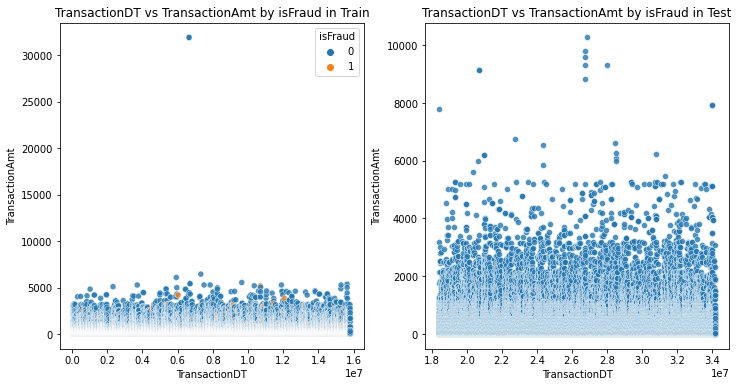

In [162]:
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
g1 = sns.scatterplot(x="TransactionDT",y="TransactionAmt",hue="isFraud", data=train, alpha=0.8, hue_order=[0,1])
plt.title('TransactionDT vs TransactionAmt by isFraud in Train')

plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="TransactionAmt", data=test, alpha=0.8, hue_order=[0,1])
plt.title('TransactionDT vs TransactionAmt by isFraud in Test')
plt.show()

In [163]:
Q1 = train.quantile(0.25)
Q3 = train.quantile(0.75)
IQR = Q3 - Q1
TransactionAmt_IQR = IQR[3]
TransactionAmt_Q1 = Q1[3]
TransactionAmt_Q3 = Q3[3]
print('There are %d observations are outliers lower than 25 percent of the bell curve'\
      %len(train['TransactionAmt'][train['TransactionAmt'] < (TransactionAmt_Q1 - 3 * TransactionAmt_IQR)]))
print('There are %d observations are outliers higher than 75 percent of the bell curve'\
      % len(train['TransactionAmt'][train['TransactionAmt'] > (TransactionAmt_Q3 + 3 * TransactionAmt_IQR)]))

There are 0 observations are outliers lower than 25 percent of the bell curve
There are 36422 observations are outliers higher than 75 percent of the bell curve


In [164]:
#dropping Outliers in TransactionAmt
train.drop(train[train.TransactionAmt>10000].index, axis=0, inplace=True)

In [165]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 590538, 436
The shape of test is: 506691, 435


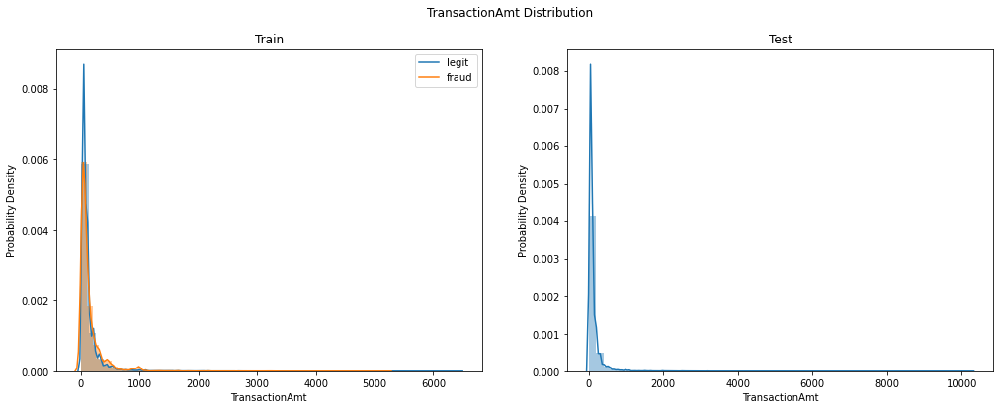

In [166]:
plt.figure(figsize=(17,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['TransactionAmt'])
sns.distplot(train[train['isFraud']==1]['TransactionAmt'])
# plt.xticks(np.arange(0, 6500, 500))
plt.ylabel('Probability Density')
plt.legend(['legit','fraud'])
plt.title('Train')
plt.suptitle('TransactionAmt Distribution' , fontsize=12)
plt.subplot(1,2,2)
sns.distplot(test['TransactionAmt'])
# plt.xticks(np.arange(0, 10000, 1000))
plt.ylabel('Probability Density')
plt.title('Test')
plt.show()

Due to extreme positive skew in TransactionAmt, we should take a log to transform in order to better visualize it.

In [167]:
#adding new column named LogTransactionAmt to both train and test
train['LogTransactionAmt'] = np.log(train['TransactionAmt'])
test['LogTransactionAmt'] = np.log(test['TransactionAmt'])

In [168]:
# rechecking skew 
print("Skew:")
print("Train: ",train['LogTransactionAmt'].skew())
print("Test: ",test['LogTransactionAmt'].skew())

#Checking the distribution of data after log transformation
print("IQR")
print("Train: ",stats.iqr(train['LogTransactionAmt']))
print("Test: ",stats.iqr(test['LogTransactionAmt']))

Skew:
Train:  0.4137546627452113
Test:  0.3092776989618382
IQR
Train:  1.0596762314100898
Test:  1.1394342831883653


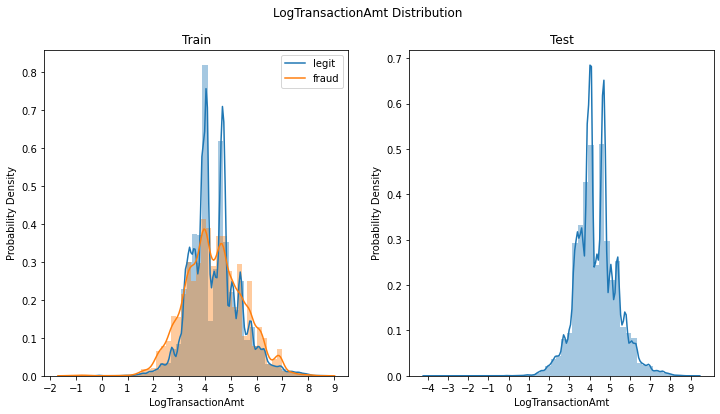

In [169]:
#visualizing LogTransactionAmt column
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['LogTransactionAmt'])
sns.distplot(train[train['isFraud']==1]['LogTransactionAmt'])
plt.xticks(np.arange(-2, 10, 1))
plt.ylabel('Probability Density')
plt.legend(['legit','fraud'])
plt.title('Train')
plt.suptitle('LogTransactionAmt Distribution' , fontsize=12)
plt.subplot(1,2,2)
sns.distplot(test['LogTransactionAmt'])
plt.xticks(np.arange(-4, 10, 1))
plt.ylabel('Probability Density')
plt.title('Test')
plt.show()

The transactions with LogTransactionAmt smaller than 5.5 (244 dollars) and larger than 3.3 (27 dollars) have higher frequency and probability density being fraudulent. On the other hand, LogTransactionAmt from 3.3 to 5.5 have higher chance being legit.

In [170]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 590538, 437
The shape of test is: 506691, 436


### ProductCD

In [171]:
train[['ProductCD']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 590538 entries, 0 to 590539
Data columns (total 1 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   ProductCD  590538 non-null  object
dtypes: object(1)
memory usage: 9.0+ MB


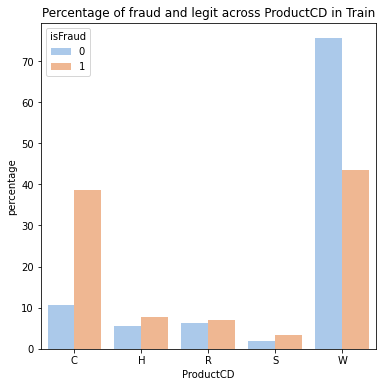

In [172]:
plt.figure(figsize=(6,6))
train_ProductCD = (train.groupby(['isFraud'])['ProductCD'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('ProductCD'))
sns.barplot(x="ProductCD", y="percentage", hue="isFraud", data=train_ProductCD,palette = 'pastel')
plt.title('Percentage of fraud and legit across ProductCD in Train')
plt.show()

From the graph above we can see that if the transaction is fraudulent, there is 40% chance it's Product C. Considering that only 10% of Legit transaction is C, I think there is higher chance that it's a fraud if it's product is C.

### Card 1 - Card 6

In [173]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 590538, 437
The shape of test is: 506691, 436


In [174]:
train.iloc[:,5:11].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 590538 entries, 0 to 590539
Data columns (total 6 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   card1   590538 non-null  int64  
 1   card2   581605 non-null  float64
 2   card3   588973 non-null  float64
 3   card4   588961 non-null  object 
 4   card5   586279 non-null  float64
 5   card6   588967 non-null  object 
dtypes: float64(3), int64(1), object(2)
memory usage: 31.5+ MB


### card1

In [175]:
describe(train,test,'card1')

,card1,Train,TrainFraud,TrainLegit,Test
0,count,590538.0,20663.0,569875.0,506691.0
1,mean,9898.713741,9547.654164,9911.44275,9957.222175
2,std,4901.165273,4762.05138,4905.667389,4884.960969
3,min,1000.0,1015.0,1000.0,1001.0
4,25%,6019.0,5732.5,6019.0,6019.0
5,50%,9678.0,9633.0,9711.0,9803.0
6,75%,14182.75,13623.0,14229.0,14276.0
7,max,18396.0,18375.0,18396.0,18397.0
8,unique,13553,1740,13350,13244
9,NaN,0,0,0,0


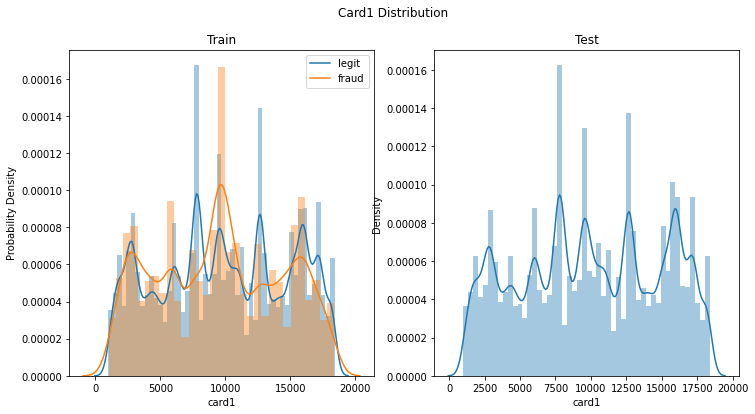

In [176]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['card1'])
sns.distplot(train[train['isFraud']==1]['card1'])
plt.ylabel('Probability Density')
plt.legend(['legit','fraud'])
plt.suptitle('Card1 Distribution' , fontsize=12)
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test['card1'])
plt.title('Test')
plt.show()

### card2

In [177]:
describe(train,test,'card2')

,card2,Train,TrainFraud,TrainLegit,Test
0,count,581605.0,20240.0,561365.0,498037.0
1,mean,362.554968,365.37085,362.453441,363.735379
2,std,157.793268,159.623511,157.726086,158.688653
3,min,100.0,100.0,100.0,100.0
4,25%,214.0,204.0,215.0,207.0
5,50%,361.0,375.0,361.0,369.0
6,75%,512.0,514.0,512.0,512.0
7,max,600.0,600.0,600.0,600.0
8,unique,501,328,501,498
9,NaN,8933,423,8510,8654


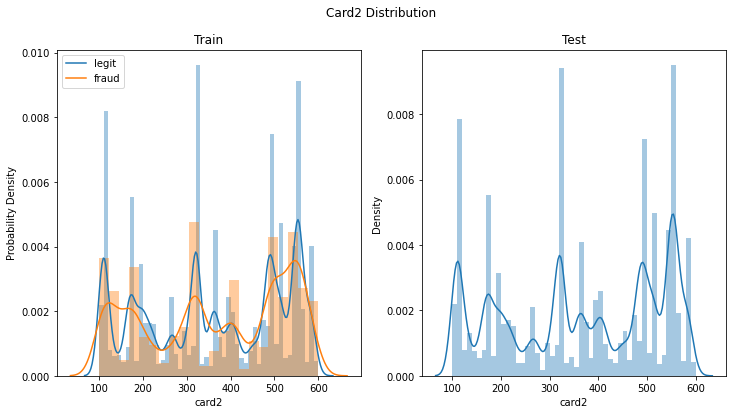

In [178]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0) & (~train['card2'].isnull())]['card2'])
sns.distplot(train[(train['isFraud']==1) & (~train['card2'].isnull())]['card2'])
plt.ylabel('Probability Density')
plt.legend(['legit','fraud'])
plt.title('Train')
plt.suptitle('Card2 Distribution' , fontsize=12)
plt.subplot(1,2,2)
sns.distplot(test[~test['card2'].isnull()]['card2'])
plt.title('Test')
plt.show()

### card3

In [179]:
describe(train,test,'card3')

,card3,Train,TrainFraud,TrainLegit,Test
0,count,588973.0,20624.0,568349.0,503689.0
1,mean,153.194936,162.368648,152.862044,153.543409
2,std,11.336462,17.495775,10.90445,12.443013
3,min,100.0,100.0,100.0,100.0
4,25%,150.0,150.0,150.0,150.0
5,50%,150.0,150.0,150.0,150.0
6,75%,150.0,185.0,150.0,150.0
7,max,231.0,231.0,231.0,232.0
8,unique,115,63,107,116
9,NaN,1565,39,1526,3002


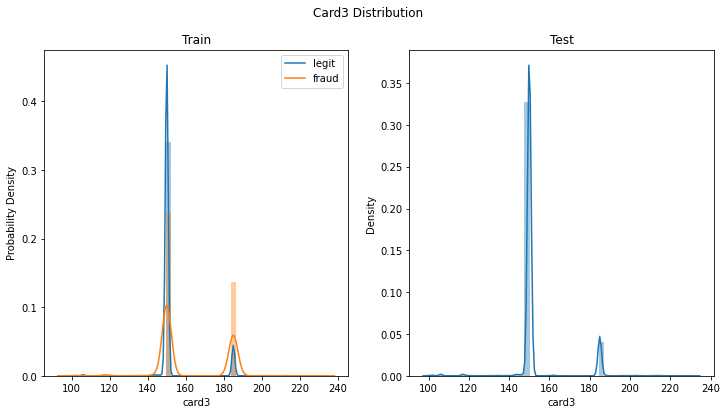

In [180]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0) & (~train['card3'].isnull())]['card3'])
sns.distplot(train[(train['isFraud']==1) & (~train['card3'].isnull())]['card3'])
plt.ylabel('Probability Density')
plt.legend(['legit','fraud'])
plt.title('Train')
plt.suptitle('Card3 Distribution', fontsize=12)
plt.subplot(1,2,2)
sns.distplot(test[~test['card3'].isnull()]['card3'])
plt.title('Test')
plt.show()

Apparently card3 is a categorical variable. As the values around 150 have higher chances being legit we can create a new feature that categorize card3

In [181]:
#converting card3 to catagory
def new_card3(row):
    if row==np.nan:
        return row
    else:
        if row > 160:
            return 'Positive'
        else:
            return 'Negative'
        
train['new_card3'] = train['card3'].apply(new_card3)
test['new_card3'] = train['card3'].apply(new_card3)

### card4

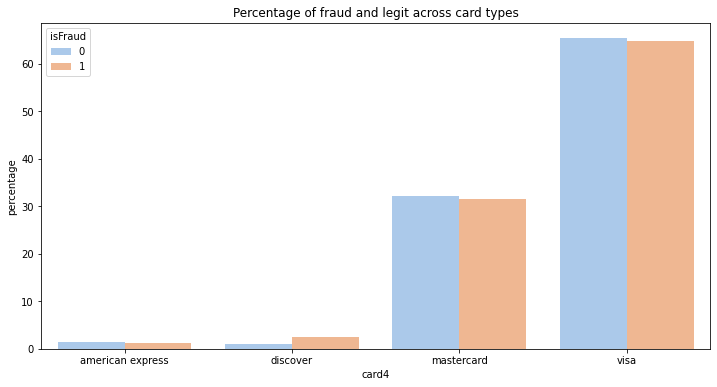

In [182]:
plt.figure(figsize=(12,6))
train_card4 = (train[~train['card4'].isnull()].groupby(['isFraud'])['card4'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('card4'))
sns.barplot(x="card4", y="percentage", hue="isFraud", data=train_card4, palette = 'pastel')
plt.title('Percentage of fraud and legit across card types')
plt.show()

Most of the transactions done by visa and mastercard card types.And although discover transactions have less number of samples, it has a almost 50% of the trasactions are identified as fraud transaction.

### card5

In [183]:
describe(train,test,'card5')

,card5,Train,TrainFraud,TrainLegit,Test
0,count,586279.0,20453.0,565826.0,502144.0
1,mean,199.279229,191.994328,199.542557,200.162975
2,std,41.244132,45.779886,41.046637,40.562461
3,min,100.0,100.0,100.0,100.0
4,25%,166.0,138.0,166.0,166.0
5,50%,226.0,224.0,226.0,226.0
6,75%,226.0,226.0,226.0,226.0
7,max,237.0,237.0,237.0,237.0
8,unique,120,50,119,103
9,NaN,4259,210,4049,4547


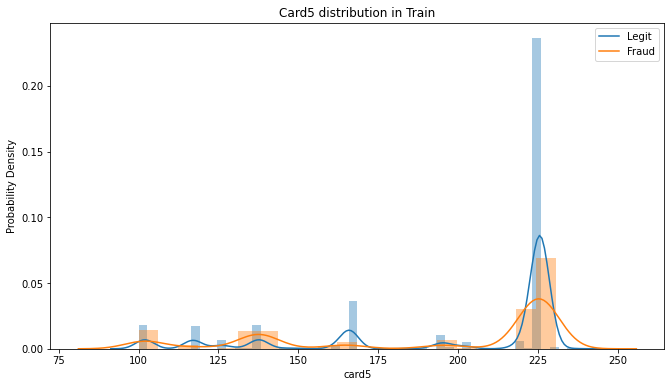

In [184]:
plt.figure(figsize=(11,6))
sns.distplot(train[(train['isFraud']==0) & (~train['card5'].isnull())]['card5'])
sns.distplot(train[(train['isFraud']==1) & (~train['card5'].isnull())]['card5'])
plt.legend(['Legit','Fraud'])
plt.ylabel('Probability Density')
plt.title('Card5 distribution in Train')
plt.show()

### card6

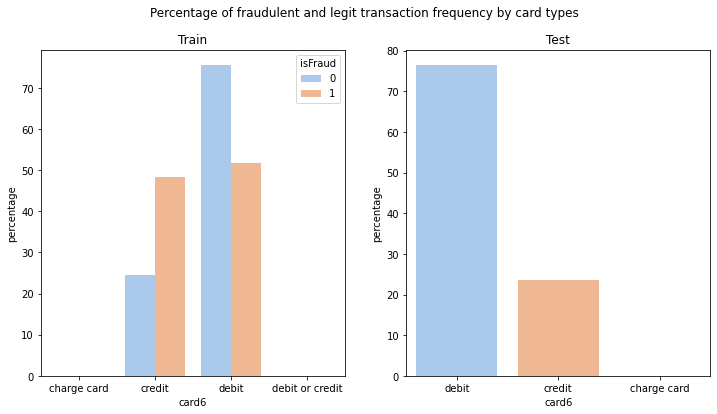

In [185]:

plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
train_card6 = (train[~train['card6'].isnull()].groupby(['isFraud'])['card6'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('card6'))
sns.barplot(x="card6", y="percentage", hue="isFraud", data=train_card6, palette = 'pastel')
plt.title('Train')

plt.subplot(1,2,2)
test_card6 =test[~test['card6'].isnull()]['card6'].value_counts(normalize=True).mul(100).rename('percentage').reset_index()
sns.barplot(x="index", y="percentage", data=test_card6, palette = 'pastel')
plt.xlabel('card6')
plt.title('Test')

plt.suptitle('Percentage of fraudulent and legit transaction frequency by card types', fontsize=12)
plt.show()

In [186]:
print('%d observations are charge card' % train[train['card6']=='charge card'].shape[0])
print('%d observations are debit or credit card' % train[train['card6']=='debit or credit'].shape[0])

15 observations are charge card
30 observations are debit or credit card


There are nearly no observations in 'charge card' and 'debit or credit' and there is no 'debit or credit' in Test dataset. As there arn't much transactions done on'charge card, it is not enough for finding general pattern.Also, the majority card6 type is debit, we can replace these observations to 'debit' type.

In [187]:
#replacing 'charge card' and 'debit or credit' classes to 'debit':
def replacetodebit(column):
    if column==np.nan:
        return column
    if column=='debit or credit' or column=='charge card':
        return 'debit'
    else:
        return column
    
train['card6'] = train['card6'].apply(replacetodebit)
test['card6'] = test['card6'].apply(replacetodebit)

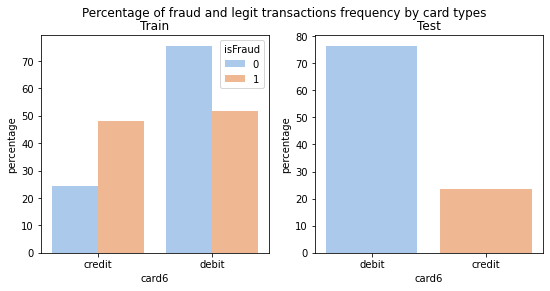

In [188]:
plt.figure(figsize=(9,4))
plt.subplot(1,2,1)

train_card6 = (train[~train['card6'].isnull()].groupby(['isFraud'])['card6'].\
               value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('card6'))

sns.barplot(x="card6", y="percentage", hue="isFraud", data=train_card6, palette = 'pastel')
plt.title('Train')

plt.subplot(1,2,2)
test_card6 =test[~test['card6'].isnull()]['card6'].value_counts(normalize=True).\
             mul(100).rename('percentage').reset_index()

sns.barplot(x="index", y="percentage", data=test_card6, palette = 'pastel')
plt.xlabel('card6')
plt.title('Test')

plt.suptitle('Percentage of fraud and legit transactions frequency by card types', fontsize=12)
plt.show()

### addr1 and addr2
addr1 - Purchaser Region, addr2 - Purchaser Billing Country

In [189]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 590538, 438
The shape of test is: 506691, 437


In [190]:
train.iloc[:,11:13].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 590538 entries, 0 to 590539
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   addr1   524832 non-null  float64
 1   addr2   524832 non-null  float64
dtypes: float64(2)
memory usage: 29.6 MB


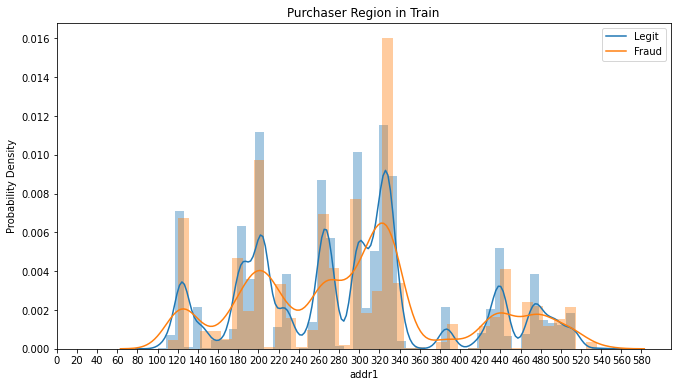

In [191]:
plt.figure(figsize=(11,6))
sns.distplot(train[(train['isFraud']==0) & (~train['addr1'].isnull())]['addr1'])
sns.distplot(train[(train['isFraud']==1) & (~train['addr1'].isnull())]['addr1'])
plt.legend(['Legit','Fraud'])
plt.xticks(np.arange(0, 600, 20))
plt.ylabel('Probability Density')
plt.title('Purchaser Region in Train')
plt.show()

330-340 seems have higher frequency of fraud

In [192]:
print('There are %d regions in addr1 of Train' % len(train['addr1'].value_counts()))
print(train['addr1'].value_counts().head(5))
print('There are %d regions in addr1 of Test' % len(test['addr1'].value_counts()))
print(test['addr1'].value_counts().head(5))

There are 332 regions in addr1 of Train
299.0    46335
325.0    42751
204.0    42020
264.0    39870
330.0    26287
Name: addr1, dtype: int64
There are 292 regions in addr1 of Test
299.0    38710
204.0    35049
325.0    34151
264.0    32710
330.0    22100
Name: addr1, dtype: int64


There are 332 and 292 regions in addr1 of Train and Test

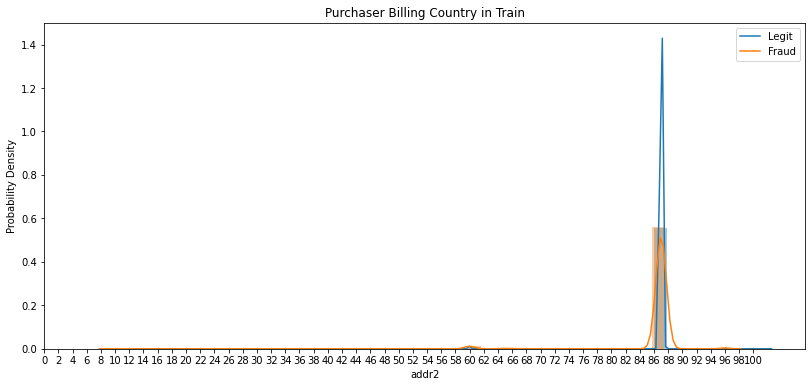

In [193]:
plt.figure(figsize=(30,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0) & (~train['addr2'].isnull())]['addr2'])
sns.distplot(train[(train['isFraud']==1) & (~train['addr2'].isnull())]['addr2'])
plt.legend(['Legit','Fraud'])
plt.ylabel('Probability Density')
plt.xticks(np.arange(0, 102, 2))
plt.title('Purchaser Billing Country in Train')
plt.show()

Except 87, 60, 96, the sample size of each address is not enough 

In [194]:
print('There are %d billing countries in addr2 of Train. And the country 87 accounts for %.2f%%' % 
      (len(train['addr2'].value_counts()), train['addr2'].value_counts().values[0] / len(train['addr2'])*100))
print(train['addr2'].value_counts().head(5))

print('There are %d billing countries in addr2 of Test. And the country 87 accounts for  %.2f%%' % 
      (len(test['addr2'].value_counts()), test['addr2'].value_counts().values[0] / len(test['addr2'])*100))
print(test['addr2'].value_counts().head(5))

There are 74 billing countries in addr2 of Train. And the country 87 accounts for 88.14%
87.0    520479
60.0      3084
96.0       638
32.0        91
65.0        82
Name: addr2, dtype: int64
There are 72 billing countries in addr2 of Test. And the country 87 accounts for  86.04%
87.0    435934
60.0      4041
96.0       608
32.0        61
65.0        49
Name: addr2, dtype: int64


There are 74 billing countries in Train and 72 in test in total. The country 87 accounts for around 87% of transactions. The majority of purchaser billing country is from 87.0.

### dist1 and dist2

Distance between the addresses where the transaction has happened

In [195]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 590538, 438
The shape of test is: 506691, 437


In [196]:
train.iloc[:,13:15].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 590538 entries, 0 to 590539
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   dist1   238267 non-null  float64
 1   dist2   37627 non-null   float64
dtypes: float64(2)
memory usage: 29.6 MB


#### dist1

In [197]:
describe(train,test,'dist1')

,dist1,Train,TrainFraud,TrainLegit,Test
0,count,238267.0,4755.0,233512.0,215474.0
1,mean,118.502948,174.588854,117.360872,87.06527
2,std,371.873493,424.232313,370.643372,314.131694
3,min,0.0,0.0,0.0,0.0
4,25%,3.0,3.0,3.0,3.0
5,50%,8.0,10.0,8.0,8.0
6,75%,24.0,85.5,24.0,20.0
7,max,10286.0,4942.0,10286.0,8081.0
8,unique,2652,471,2636,1989
9,NaN,352271,15908,336363,291217


TrainFraud has higher average dist1 than TrainLegit. This shows that fraud transaction are happening from a longer distance from cardholder's address.

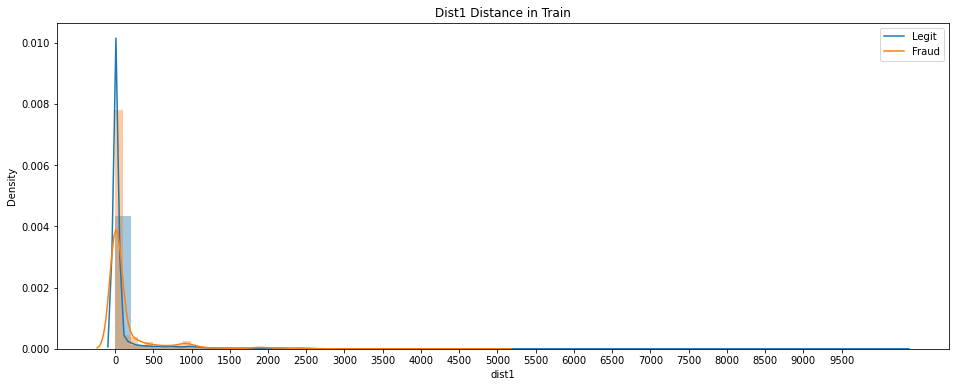

In [198]:
plt.figure(figsize=(16,6))
sns.distplot(train[(train['isFraud']==0) & (~train['dist1'].isnull())]['dist1'])
sns.distplot(train[(train['isFraud']==1) & (~train['dist1'].isnull())]['dist1'])
plt.legend(['Legit','Fraud'])
plt.xticks(np.arange(0, 10000, 500))
plt.title('Dist1 Distance in Train')
plt.show()

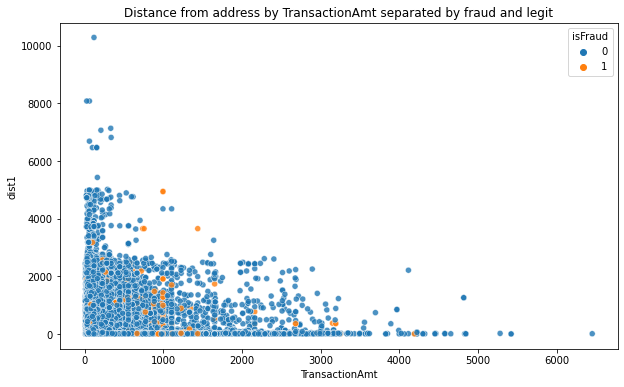

In [199]:
plt.figure(figsize=(10,6))
sns.scatterplot(x="TransactionAmt",y="dist1",hue="isFraud",data=train[~train['dist1'].isnull()],
                alpha=0.8, hue_order=[0,1])
plt.title('Distance from address by TransactionAmt separated by fraud and legit')
plt.show()

It's clear that observations dist1 > 6000 are outliers in Train so let's remove them

In [200]:
#droping outliers in dist1
train.drop(train[train.dist1>6000].index, axis=0, inplace=True)

In [201]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 590527, 438
The shape of test is: 506691, 437


#### dist2

In [202]:
describe(train,test,'dist2')

,dist2,Train,TrainFraud,TrainLegit,Test
0,count,37627.0,3731.0,33896.0,36436.0
1,mean,231.855423,201.472259,235.199758,237.175047
2,std,529.053494,451.589576,536.798492,556.450834
3,min,0.0,0.0,0.0,0.0
4,25%,7.0,7.0,7.0,7.0
5,50%,37.0,49.0,36.0,44.0
6,75%,206.0,233.0,206.0,196.0
7,max,11623.0,9337.0,11623.0,9213.0
8,unique,1752,345,1724,1815
9,NaN,552900,16932,535968,470255


large percentages of missing values (93%)

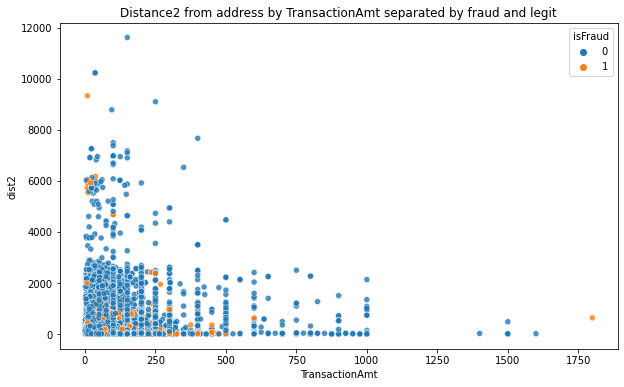

In [203]:

plt.figure(figsize=(10,6))
sns.scatterplot(x="TransactionAmt",y="dist2",hue="isFraud",data=train[~train['dist2'].isnull()],
                alpha=0.8,hue_order=[0,1])
plt.title('Distance2 from address by TransactionAmt separated by fraud and legit')
plt.show()

It's clear that observations dist2 > 8000 are outliers in Train so let's remove them

In [204]:
#droping outliers in dist2
train.drop(train[train.dist2>8000].index, axis=0, inplace=True)

In [205]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 590521, 438
The shape of test is: 506691, 437


### P_emaildomain and R_emaildomain
purchaser and recipient email domain

In [206]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 590521, 438
The shape of test is: 506691, 437


In [207]:
train.iloc[:,15:17].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 590521 entries, 0 to 590539
Data columns (total 2 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   P_emaildomain  496065 non-null  object
 1   R_emaildomain  137285 non-null  object
dtypes: object(2)
memory usage: 13.5+ MB


In [208]:
train['R_emaildomain'].value_counts().sample(10)

gmail.com         57144
hotmail.de           42
roadrunner.com       53
icloud.com         1398
juno.com             53
protonmail.com       41
cfl.rr.com           37
netzero.com          14
comcast.net        1812
aim.com              36
Name: R_emaildomain, dtype: int64

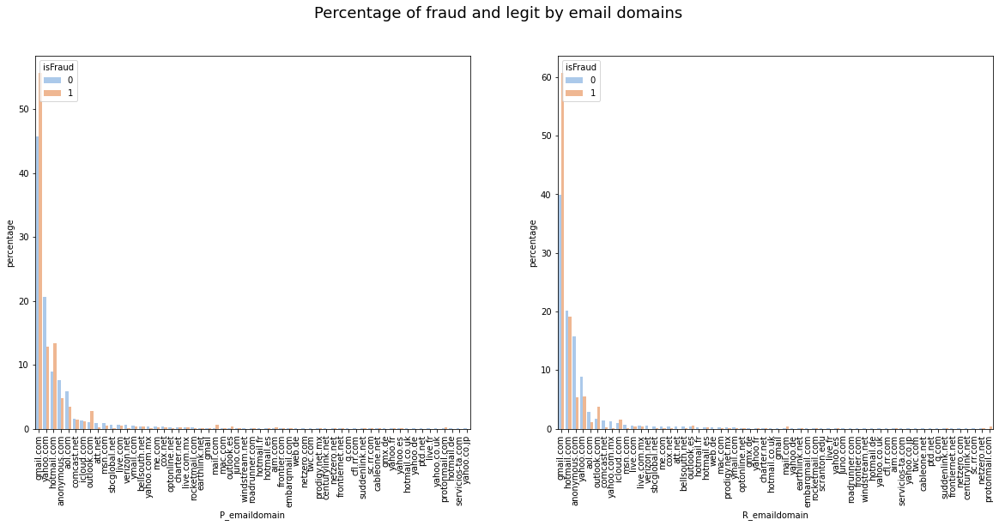

In [209]:
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
train_P_email = train[~train['P_emaildomain'].isnull()].groupby(['isFraud'])['P_emaildomain'].\
                 value_counts(normalize=True).rename('percentage').mul(100).reset_index()
sns.barplot(x="P_emaildomain", y="percentage", hue="isFraud", data=train_P_email, palette = 'pastel')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
train_R_email = train[~train['R_emaildomain'].isnull()].groupby(['isFraud'])['R_emaildomain'].\
                 value_counts(normalize=True).mul(100).rename('percentage').reset_index()
sns.barplot(x="R_emaildomain", y="percentage", hue="isFraud", data=train_R_email, palette = 'pastel')
plt.xticks(rotation=90)
plt.suptitle('Percentage of fraud and legit by email domains', fontsize=18)
plt.show()

Let's combine group all e-mail domains by the respective enterprises and set all values with less than 500 entries as "Others". Also fill NaN by 'NoInf'.

In [210]:
# Performing data wrangling in P_emaildomian column:
train.loc[train['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'
train.loc[train['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo'
train.loc[train['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
train.loc[train.P_emaildomain.isin(train.P_emaildomain.value_counts()[train.P_emaildomain.value_counts() <= 500 ].index),\
          'P_emaildomain'] = "Others"
train.P_emaildomain.fillna("NoInf", inplace=True)

train.loc[train['R_emaildomain'].isin(['gmail.com', 'gmail']),'R_emaildomain'] = 'Google'

train.loc[train['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                             'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                             'yahoo.es']), 'R_emaildomain'] = 'Yahoo'
train.loc[train['R_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                             'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                             'outlook.es', 'live.com', 'live.fr',
                                             'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'
train.loc[train.R_emaildomain.isin(train.R_emaildomain.value_counts()[train.R_emaildomain.value_counts() <= 300 ].index),\
          'R_emaildomain'] = "Others"
train.R_emaildomain.fillna("NoInf", inplace=True)

In [211]:
# Performing data wrangling in R_emaildomian column:
test.loc[test['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'
test.loc[test['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo'
test.loc[test['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
test.loc[test.P_emaildomain.isin(test.P_emaildomain.value_counts()[test.P_emaildomain.value_counts() <= 500 ].index), \
         'P_emaildomain'] = "Others"
test.P_emaildomain.fillna("NoInf", inplace=True)

test.loc[test['R_emaildomain'].isin(['gmail.com', 'gmail']),'R_emaildomain'] = 'Google'

test.loc[test['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                             'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                             'yahoo.es']), 'R_emaildomain'] = 'Yahoo'
test.loc[test['R_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                             'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                             'outlook.es', 'live.com', 'live.fr',
                                             'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'
test.loc[test.R_emaildomain.isin(test.R_emaildomain.value_counts()[test.R_emaildomain.value_counts() <= 300 ].index), \
         'R_emaildomain'] = "Others"
test.R_emaildomain.fillna("NoInf", inplace=True)

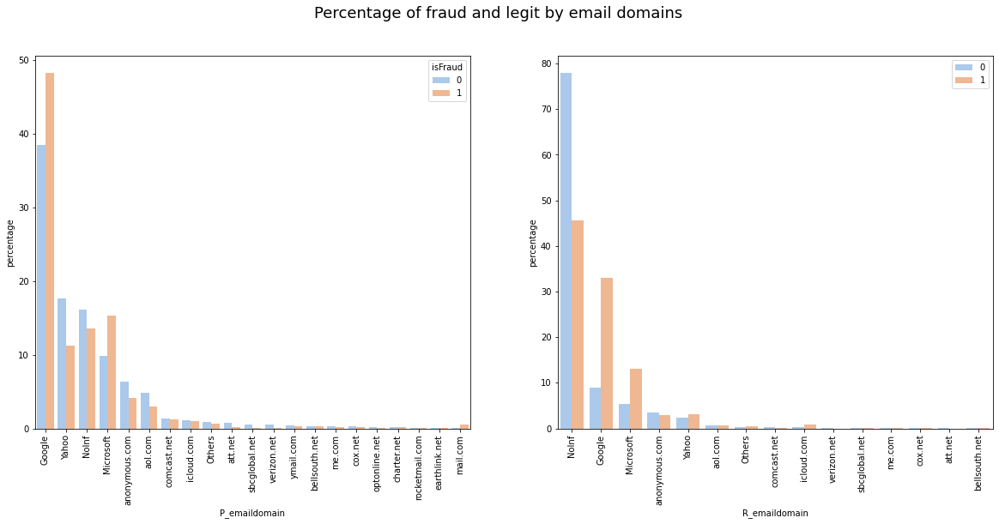

In [212]:
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)

train_P_email = (train[~train['P_emaildomain'].isnull()].groupby(['isFraud'])['P_emaildomain'].\
                 value_counts(normalize=True).rename('percentage').mul(100).reset_index())

sns.barplot(x="P_emaildomain", y="percentage", hue="isFraud", data=train_P_email, palette = 'pastel')
plt.xticks(rotation=90)
plt.subplot(1,2,2)

train_R_email = train[~train['R_emaildomain'].isnull()].groupby(['isFraud'])['R_emaildomain'].\
value_counts(normalize=True).mul(100).rename('percentage').reset_index()

sns.barplot(x="R_emaildomain", y="percentage", hue="isFraud", data=train_R_email, palette = 'pastel')
plt.xticks(rotation=90)
plt.legend(loc='upper right')
plt.suptitle('Percentage of fraud and legit by email domains', fontsize=18)
plt.show()

In [213]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 590521, 438
The shape of test is: 506691, 437


### C1-C14

Counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked. 

Let's take a look of their distribution, description and scatterplot for outliers.

C1-C14 don't have any missing value in Train but only 3 in Test, which is good. 

In [214]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 590521, 438
The shape of test is: 506691, 437


In [215]:
train.iloc[:,17:31].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 590521 entries, 0 to 590539
Data columns (total 14 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   C1      590521 non-null  float64
 1   C2      590521 non-null  float64
 2   C3      590521 non-null  float64
 3   C4      590521 non-null  float64
 4   C5      590521 non-null  float64
 5   C6      590521 non-null  float64
 6   C7      590521 non-null  float64
 7   C8      590521 non-null  float64
 8   C9      590521 non-null  float64
 9   C10     590521 non-null  float64
 10  C11     590521 non-null  float64
 11  C12     590521 non-null  float64
 12  C13     590521 non-null  float64
 13  C14     590521 non-null  float64
dtypes: float64(14)
memory usage: 67.6 MB


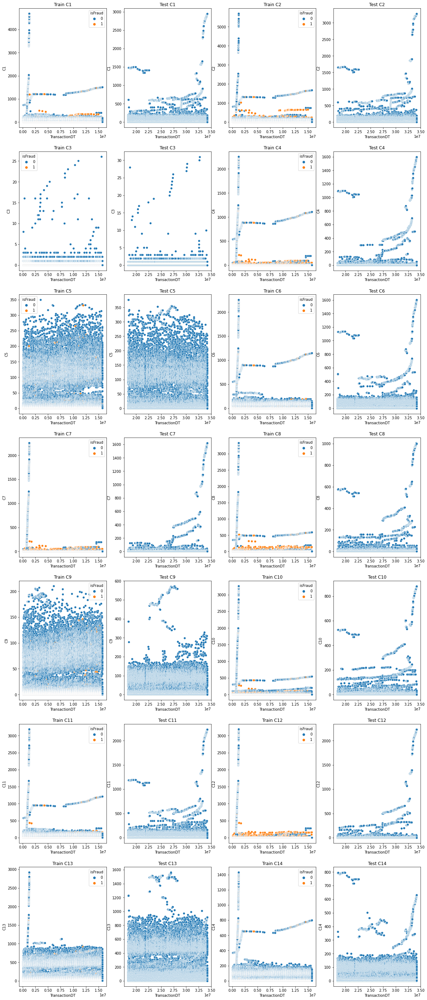

In [85]:

plt.figure(figsize=(20,50))
var = ['C' + str(i) for i in range(1,15)]
i = 1
for col in var:
    plt.subplot(7,4,i)
    sns.scatterplot(x="TransactionDT",y=col,hue="isFraud",data=train[~train[col].isnull()])
    plt.title('Train '+ col)
    i += 1
    plt.subplot(7,4,i)
    sns.scatterplot(x="TransactionDT",y=col,data=test[~test[col].isnull()])
    plt.title('Test '+ col)
    i += 1
plt.show()

- C5 and C9 don't have outliers
- Other C features have extreme outliers where TransactionDT in range of around 1028000 - 1199904DT, day 4-6. A large amount of addresses are found to be associated with the payment card in this time range.

We see similar outliers in the end of TransactionDT Test

Let's remove some outliers

In [216]:
# Droping outliers in C1-C15:
train.drop(train[train.C1>3000].index, axis=0, inplace=True)
train.drop(train[train.C2>3000].index, axis=0, inplace=True)
train.drop(train[train.C7>1400].index, axis=0, inplace=True)
train.drop(train[train.C4>1400].index, axis=0, inplace=True)
train.drop(train[train.C6>1400].index, axis=0, inplace=True)
train.drop(train[train.C7>1400].index, axis=0, inplace=True)
train.drop(train[train.C8>1000].index, axis=0, inplace=True)
train.drop(train[train.C10>1000].index, axis=0, inplace=True)
train.drop(train[train.C11>2000].index, axis=0, inplace=True)
train.drop(train[train.C12>2000].index, axis=0, inplace=True)
train.drop(train[train.C13>1200].index, axis=0, inplace=True)
train.drop(train[train.C14>800].index, axis=0, inplace=True)

In [217]:
var = ['C' + str(i) + '_desc' for i in range(1,15)]
col = ['C' + str(i) for i in range(1,15)]
frame = []
def des(var,col):
    for i, j in zip(var,col):
        i = describe(train,test,j)
        frame.append(i)

    return pd.concat(frame, axis=1)

des(var,col)

,C1,Train,TrainFraud,TrainLegit,Test,C2,Train,TrainFraud,TrainLegit,Test,C3,Train,TrainFraud,TrainLegit,Test,C4,Train,TrainFraud,TrainLegit,Test,C5,Train,TrainFraud,TrainLegit,Test,C6,Train,TrainFraud,TrainLegit,Test,C7,Train,TrainFraud,TrainLegit,Test,C8,Train,TrainFraud,TrainLegit,Test,C9,Train,TrainFraud,TrainLegit,Test,C10,Train,TrainFraud,TrainLegit,Test,C11,Train,TrainFraud,TrainLegit,Test,C12,Train,TrainFraud,TrainLegit,Test,C13,Train,TrainFraud,TrainLegit,Test,C14,Train,TrainFraud,TrainLegit,Test
0,count,589527.0,20548.0,568979.0,506688.0,count,589527.0,20548.0,568979.0,506688.0,count,589527.0,20548.0,568979.0,506688.0,count,589527.0,20548.0,568979.0,506688.0,count,589527.0,20548.0,568979.0,506688.0,count,589527.0,20548.0,568979.0,506688.0,count,589527.0,20548.0,568979.0,506688.0,count,589527.0,20548.0,568979.0,506688.0,count,589527.0,20548.0,568979.0,506688.0,count,589527.0,20548.0,568979.0,506688.0,count,589527.0,20548.0,568979.0,506688.0,count,589527.0,20548.0,568979.0,506688.0,count,589527.0,20548.0,568979.0,501943.0,count,589527.0,20548.0,568979.0,506688.0
1,mean,9.476122,20.071199,9.093494,10.093211,mean,9.811741,27.187755,9.184226,10.714635,mean,0.005654,0.000243,0.005849,0.027403,mean,1.736709,7.096506,1.543147,2.385875,mean,5.581091,1.41459,5.73156,4.962701,mean,6.724116,8.952647,6.643635,6.854992,mean,0.489124,3.973136,0.363303,1.678173,mean,1.560005,9.147508,1.285991,1.893994,mean,4.487901,1.7135,4.588096,4.611943,mean,1.593696,7.146924,1.393148,1.810149,mean,6.960814,12.753942,6.751602,7.484594,mean,0.78496,7.464571,0.543734,2.649486,mean,29.370273,14.102881,29.921637,27.816035,mean,6.782018,5.189897,6.839516,6.08389
2,std,52.932364,89.351733,51.093155,79.334782,std,60.107096,116.023443,56.972967,88.896921,std,0.150665,0.015598,0.153329,0.227753,std,32.267374,54.853669,31.129584,41.942977,std,25.808088,12.981842,26.141458,25.462195,std,37.929264,56.541168,37.080329,46.783565,std,9.943488,19.788404,9.37276,37.874827,std,22.478473,42.234948,21.376594,26.766115,std,16.688188,8.47594,16.901799,21.28264,std,22.933016,39.802976,22.057898,23.692393,std,40.504098,64.627253,39.341392,61.322505,std,14.4674,32.92066,13.268677,53.97306,std,101.03777,67.126571,102.009127,101.114033,std,30.599243,39.522544,30.226221,28.315616
3,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0
4,25%,1.0,1.0,1.0,1.0,25%,1.0,1.0,1.0,1.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,1.0,1.0,1.0,1.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,1.0,1.0,1.0,1.0,25%,0.0,0.0,0.0,0.0,25%,1.0,1.0,1.0,1.0,25%,1.0,0.0,1.0,1.0
5,50%,1.0,2.0,1.0,1.0,50%,1.0,2.0,1.0,1.0,50%,0.0,0.0,0.0,0.0,50%,0.0,1.0,0.0,0.0,50%,0.0,0.0,0.0,0.0,50%,1.0,1.0,1.0,1.0,50%,0.0,0.0,0.0,0.0,50%,0.0,1.0,0.0,0.0,50%,1.0,0.0,1.0,1.0,50%,0.0,1.0,0.0,0.0,50%,1.0,2.0,1.0,1.0,50%,0.0,0.0,0.0,0.0,50%,3.0,1.0,3.0,3.0,50%,1.0,1.0,1.0,1.0
6,75%,3.0,6.0,3.0,3.0,75%,3.0,7.0,3.0,3.0,75%,0.0,0.0,0.0,0.0,75%,0.0,2.0,0.0,1.0,75%,1.0,0.0,1.0,1.0,75%,2.0,3.0,2.0,2.0,75%,0.0,1.0,0.0,0.0,75%,0.0,2.0,0.0,1.0,75%,2.0,1.0,2.0,2.0,75%,0.0,2.0,0.0,1.0,75%,2.0,4.0,2.0,2.0,75%,0.0,2.0,0.0,1.0,75%,12.0,5.0,13.0,13.0,75%,2.0,2.0,2.0,2.0
7,max,1505.0,1494.0,1505.0,2950.0,max,1670.0,1657.0,1670.0,3275.0,max,26.0,1.0,26.0,31.0,max,1107.0,1098.0,1107.0,1601.0,max,349.0,331.0,349.0,376.0,max,1147.0,1138.0,1147.0,1601.0,max,611.0,520.0,611.0,1621.0,max,886.0,758.0,886.0,1005.0,max,210.0,192.0,210.0,572.0,max,1000.0,882.0,1000.0,881.0,max,1210.0,1203.0,1210.0,2234.0,max,839.0,726.0,839.0,2234.0,max,1126.0,917.0,1126.0,1562.0,max,798.0,792.0,798.0,797.0
8,unique,988,395,918,1175,unique,958,474,824,1124,unique,27,2,27,32,unique,699,137,659,729,unique,319,124,319,354,unique,795,192,766,835,unique,365,105,337,519,unique,533,223,448,4

C features don't have any missing values in Train, and there are 3 NaN consistently in Test except C13

The means and standard deviation of TrainFraud of C features are significantly different than TrainLegit, mostly larger in TrainFraud, as what we can see from scatterplot above like C7,C8,C12.

In [218]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 589527, 438
The shape of test is: 506691, 437


### D1-D15
data format is in timedelta, such as days between previous transaction.

The hour of the day is D9: train['D9'] = (train['TransactionDT']%(3600*24)/3600//1)/24.0, 

In [219]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 589527, 438
The shape of test is: 506691, 437


In [220]:
train.iloc[:, 31:46].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 589527 entries, 0 to 590539
Data columns (total 15 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   D1      588258 non-null  float64
 1   D2      309448 non-null  float64
 2   D3      327259 non-null  float64
 3   D4      420618 non-null  float64
 4   D5      280198 non-null  float64
 5   D6      72200 non-null   float64
 6   D7      38424 non-null   float64
 7   D8      74520 non-null   float64
 8   D9      74520 non-null   float64
 9   D10     514458 non-null  float64
 10  D11     311240 non-null  float64
 11  D12     63720 non-null   float64
 12  D13     61067 non-null   float64
 13  D14     61452 non-null   float64
 14  D15     500418 non-null  float64
dtypes: float64(15)
memory usage: 88.1 MB


In [73]:
var = ['D' + str(i) + '_desc' for i in range(1,16)]
col = ['D' + str(i) for i in range(1,16)]
frame = []
def describeD(var,col):
    for i, j in zip(var,col):
        i = describe(train,test,j)
        frame.append(i)

    return pd.concat(frame, axis=1)

describeD(var,col)

,D1,Train,TrainFraud,TrainLegit,Test,D2,Train,TrainFraud,TrainLegit,Test,D3,Train,TrainFraud,TrainLegit,Test,D4,Train,TrainFraud,TrainLegit,Test,D5,Train,TrainFraud,TrainLegit,Test,D6,Train,TrainFraud,TrainLegit,Test,D7,Train,TrainFraud,TrainLegit,Test,D8,Train,TrainFraud,TrainLegit,Test,D9,Train,TrainFraud,TrainLegit,Test,D10,Train,TrainFraud,TrainLegit,Test,D11,Train,TrainFraud,TrainLegit,Test,D12,Train,TrainFraud,TrainLegit,Test,D13,Train,TrainFraud,TrainLegit,Test,D14,Train,TrainFraud,TrainLegit,Test,D15,Train,TrainFraud,TrainLegit,Test
0,count,588258.0,20502.0,567756.0,500660.0,count,309448.0,7854.0,301594.0,271922.0,count,327259.0,9570.0,317689.0,303549.0,count,420618.0,14456.0,406162.0,429840.0,count,280198.0,10797.0,269401.0,282316.0,count,72200.0,7607.0,64593.0,124783.0,count,38424.0,5707.0,32717.0,60133.0,count,74520.0,7755.0,66765.0,74338.0,count,74520.0,7755.0,66765.0,74338.0,count,514458.0,16762.0,497696.0,494146.0,count,311240.0,6106.0,305134.0,330173.0,count,63720.0,7483.0,56237.0,69254.0,count,61067.0,6734.0,54333.0,123384.0,count,61452.0,7121.0,54331.0,115194.0,count,500418.0,16272.0,484146.0,494622.0
1,mean,94.445854,38.720222,96.458139,108.207504,mean,169.639271,77.887191,172.028644,188.666621,mean,28.336663,11.732184,28.836853,33.394727,mean,140.199884,72.040883,142.62578,175.060799,mean,42.345491,13.68695,43.494063,50.977752,mean,69.989155,45.419482,72.882681,82.443145,mean,41.701463,11.255826,47.012257,61.815642,mean,146.447791,49.516994,157.706659,160.834483,mean,0.561237,0.518799,0.566166,0.553981,mean,123.995457,52.407648,126.406477,159.810552,mean,146.62419,87.314445,147.811031,218.414895,mean,53.989972,43.692503,55.360172,77.404179,mean,17.977566,6.528661,19.396536,18.225961,mean,57.941792,54.289285,58.420515,58.163186,mean,163.987253,78.378503,166.864537,206.854137
2,std,157.723319,100.838351,159.03334,176.964526,std,177.337688,128.797478,177.794114,197.099611,std,62.352942,42.00428,62.795767,82.55821,std,191.19439,140.742505,192.302266,250.41747,std,89.002293,51.930068,89.98098,116.829786,std,144.000217,101.143827,147.966363,192.867671,std,99.889685,46.743808,105.581841,150.299612,std,232.063391,133.781471,238.352786,257.003738,std,0.316676,0.333236,0.314327,0.317327,std,182.621127,127.099367,183.715137,240.566557,std,186.044947,146.561013,186.557735,253.091693,std,124.368736,98.772204,127.3255,176.218548,std,67.811679,31.480608,70.903379,78.07989,std,136.646471,126.507727,137.914013,164.015525,std,202.804806,152.163788,203.664934,269.419196
3,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,-122.0,0.0,-122.0,0.0,min,0.0,0.0,0.0,0.0,min,-83.0,0.0,-83.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,-53.0,0.0,-53.0,0.0,min,-83.0,0.0,-83.0,0.0,min,0.0,0.0,0.0,0.0,min,-193.0,0.0,-193.0,0.0,min,-83.0,0.0,-83.0,0.0
4,25%,0.0,0.0,0.0,0.0,25%,26.0,2.0,27.0,26.0,25%,1.0,0.0,1.0,1.0,25%,0.0,0.0,0.0,0.0,25%,1.0,0.0,1.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.958333,0.75,1.791666,1.083333,25%,0.208333,0.166666,0.208333,0.208333,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0
5,50%,3.0,0.0,4.0,5.0,50%,97.0,16.0,100.0,112.0,50%,8.0,1.0,8.0,7.0,50%,26.0,1.0,28.0,21.0,50%,10.0,0.0,10.0,8.0,50%,0.0,0.0,0.0,0.0,50%,0.0,0.0,0.0,0.0,50%,38.041664,2.666666,50.666664,37.708332,50%,0.666666,0.625,0.666666,0.666666,50%,15.0,0.0,18.0,10.0,50%,43.0,7.0,44.0,102.0,50%,0.0,0.0,0.0,0.0,50%,0.0,0.0,0.0,0.0,50%,0.0,0.0,0.0,0.0,50%,52.0,1.0,57.0,48.0
6,75%,122.0,14.0,127.0,148.0,75%,276.0,95.0,281.0,305.0,75%,27.0,5.0,28.0,28.0,75%,254.0,60.0,261.0,290.0,75%,32.0,3.0,34.0,34.0,75%,40.0,22.0,44.0,13.0,75%,17.0,0.0,25.0,18.0,75%,188.583328,32.416664,207.916672,221.125,75%,0.833333,0.833333,0.833333,0.791666,75%,197.0,14.0,205.0,250.0,75%,274.0,107.75,277.0,401.0,75%,12.0,21.0,11.0,25.0,75%,0.0,0.0,0.0,0.0,75%,2.0,9.0,1.0,0.0,75%,315.0,63.0,322.0,370.0
7,max,640.0,637.0,640.0,641.0,max,640.0,637.

D2,D3,D5,D6,D7,D8,D9,D11,D12,D13,D14 have at least higher than 40% NaN %

D6-D9, D12-D13 have around 90% of missing value

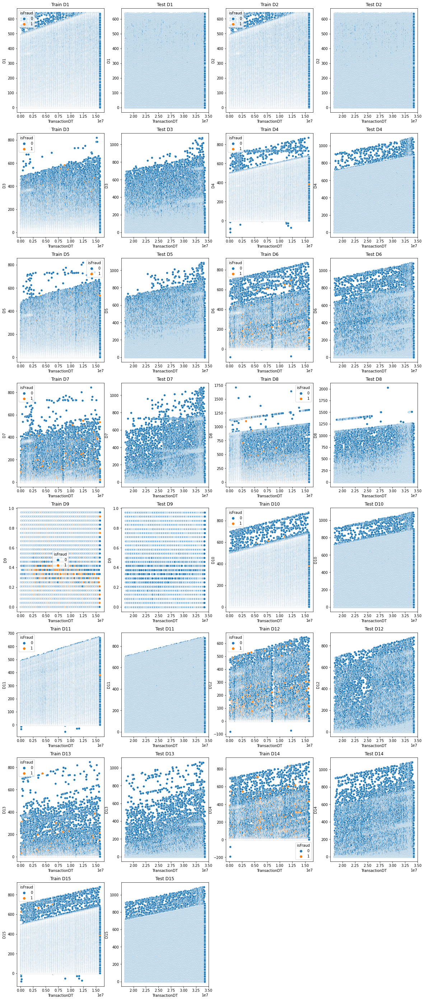

In [221]:
plt.figure(figsize=(20,50))
var = ['D' + str(i) for i in range(1,16)]
i = 1
for col in var:
    plt.subplot(8,4,i)
    sns.scatterplot(x="TransactionDT",y=col,hue="isFraud",data=train[~train[col].isnull()])
    plt.title('Train '+col)
    i += 1
    plt.subplot(8,4,i)
    sns.scatterplot(x="TransactionDT",y=col,data=test[~test[col].isnull()])
    plt.title('Test '+col)
    i += 1
plt.show()


Most of D features are Monotonically increasing with TransactionDT which make sense because they are the days between previous transaction, etc.

### M1 - M9

In [222]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 589527, 438
The shape of test is: 506691, 437


In [223]:
train.iloc[:,46:55].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 589527 entries, 0 to 590539
Data columns (total 9 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   M1      319429 non-null  object
 1   M2      319429 non-null  object
 2   M3      319429 non-null  object
 3   M4      308091 non-null  object
 4   M5      240051 non-null  object
 5   M6      421169 non-null  object
 6   M7      244266 non-null  object
 7   M8      244279 non-null  object
 8   M9      244279 non-null  object
dtypes: object(9)
memory usage: 61.1+ MB


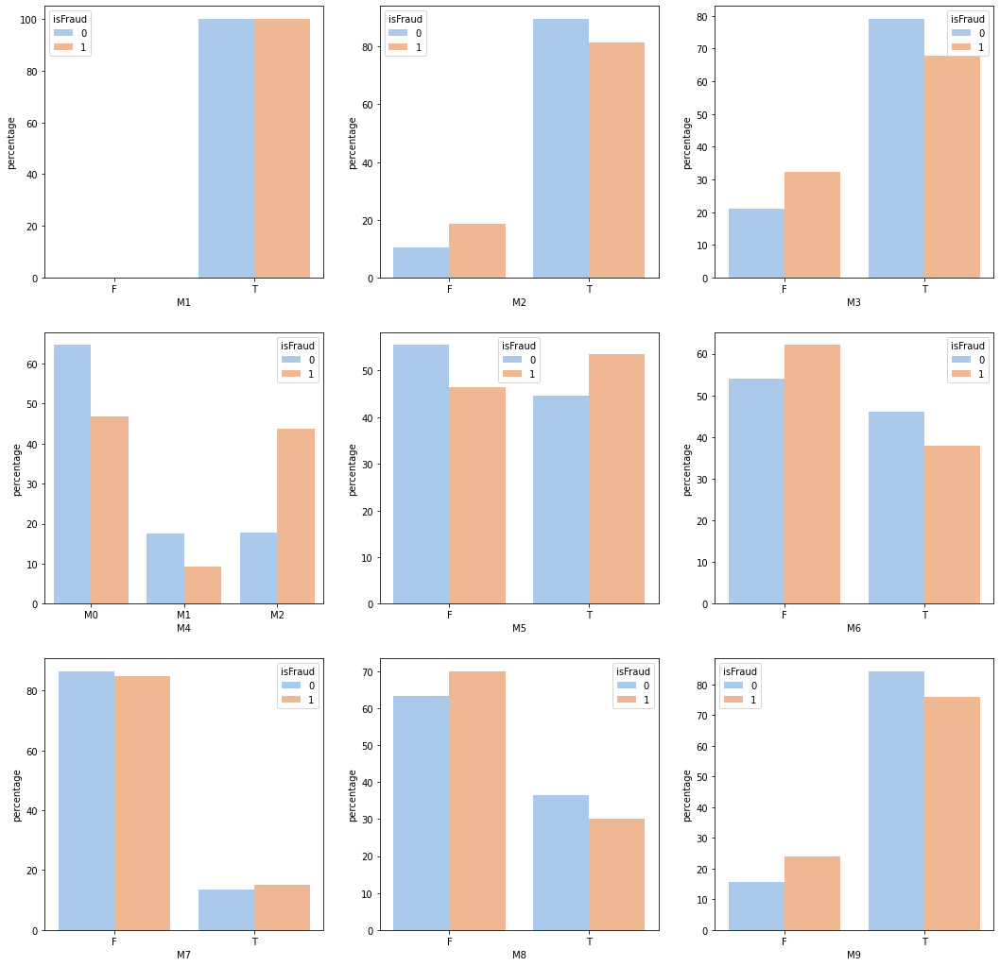

In [224]:
plt.figure(figsize=(18,18))
var = ['train_m' + str(i) for i in range(1,10)]
col = ['M' + str(i) for i in range(1,10)]
for i,j,k in zip(var,col,range(1,10)):
    i = (train.groupby(['isFraud'])[j]
                         .value_counts(normalize=True)
                         .rename('percentage')
                         .mul(100)
                         .reset_index()
                         .sort_values(j))
    plt.subplot(3,3,k)
    sns.barplot(x=j, y="percentage", hue="isFraud", data=i, palette = 'pastel')
plt.show()

### V features

In [225]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 589527, 438
The shape of test is: 506691, 437


In [226]:
train.iloc[:,55:393].info(max_cols= 400)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 589527 entries, 0 to 590539
Data columns (total 338 columns):
 #    Column  Non-Null Count   Dtype  
---   ------  --------------   -----  
 0    V1      311240 non-null  float64
 1    V2      311240 non-null  float64
 2    V3      311240 non-null  float64
 3    V4      311240 non-null  float64
 4    V5      311240 non-null  float64
 5    V6      311240 non-null  float64
 6    V7      311240 non-null  float64
 7    V8      311240 non-null  float64
 8    V9      311240 non-null  float64
 9    V10     311240 non-null  float64
 10   V11     311240 non-null  float64
 11   V12     514407 non-null  float64
 12   V13     514407 non-null  float64
 13   V14     514407 non-null  float64
 14   V15     514407 non-null  float64
 15   V16     514407 non-null  float64
 16   V17     514407 non-null  float64
 17   V18     514407 non-null  float64
 18   V19     514407 non-null  float64
 19   V20     514407 non-null  float64
 20   V21     514407 non-null 

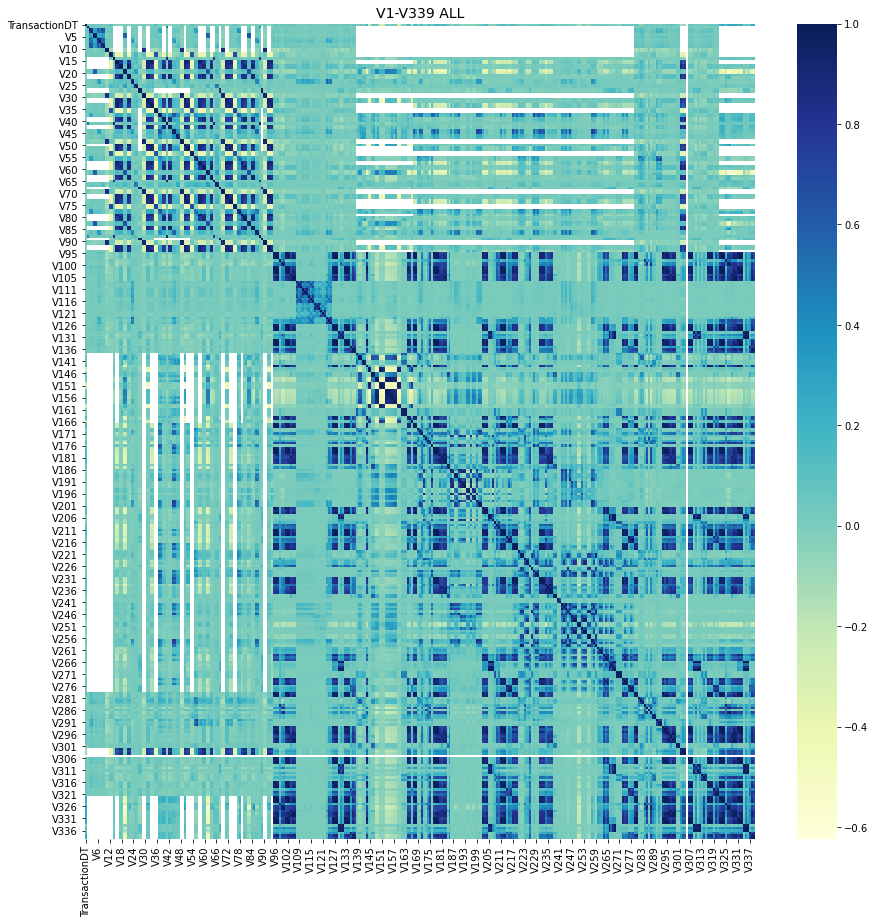

In [228]:
cols = ['TransactionDT'] + ['V'+str(x) for x in range(1,340)]
cols.remove('V107')
train2 = train[cols].sample(frac=0.2)
plt.figure(figsize=(15,15))
sns.heatmap(train2[cols].corr(), cmap='YlGnBu', annot=False)
plt.title('V1-V339 ALL',fontsize=14)
plt.show()

### id01 - id38

In [229]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 589527, 438
The shape of test is: 506691, 437


In [230]:
train.iloc[:, 393:431].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 589527 entries, 0 to 590539
Data columns (total 38 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   id_01   143323 non-null  float64
 1   id_02   139970 non-null  float64
 2   id_03   65941 non-null   float64
 3   id_04   65941 non-null   float64
 4   id_05   135977 non-null  float64
 5   id_06   135977 non-null  float64
 6   id_07   5150 non-null    float64
 7   id_08   5150 non-null    float64
 8   id_09   74520 non-null   float64
 9   id_10   74520 non-null   float64
 10  id_11   140076 non-null  float64
 11  id_12   143323 non-null  object 
 12  id_13   126536 non-null  float64
 13  id_14   80016 non-null   float64
 14  id_15   140083 non-null  object 
 15  id_16   128604 non-null  object 
 16  id_17   138470 non-null  float64
 17  id_18   44841 non-null   float64
 18  id_19   138419 non-null  float64
 19  id_20   138363 non-null  float64
 20  id_21   5154 non-null    float64
 21  id_22   51

In [231]:
# Calculating rows without any missing values in id01-id38
print(train[~train.iloc[:, 393:431].isnull().any(axis=1)].iloc[:, 393:431].shape)
train[~train.iloc[:, 393:431].isnull().any(axis=1)].iloc[:, 393:431].head()

(1328, 38)


,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38
99,-10.0,129080.0,0.0,0.0,9.0,-43.0,22.0,-34.0,0.0,0.0,100.0,Found,49.0,-300.0,Found,Found,166.0,12.0,122.0,549.0,252.0,14.0,IP_PROXY:TRANSPARENT,11.0,321.0,184.0,Found,Found,Found,iOS 11.0.3,mobile safari generic,32.0,1334x750,match_status:2,T,F,T,F
188,-5.0,15464.0,0.0,0.0,4.0,-44.0,6.0,-55.0,0.0,0.0,100.0,Found,55.0,-300.0,Found,Found,166.0,13.0,122.0,256.0,252.0,14.0,IP_PROXY:TRANSPARENT,11.0,321.0,102.0,Found,Found,Found,Android,chrome 62.0,32.0,2560x1440,match_status:2,T,F,T,T
1702,-20.0,171610.0,0.0,0.0,13.0,-34.0,2.0,-33.0,0.0,0.0,100.0,NotFound,15.0,-300.0,Found,Found,166.0,12.0,317.0,549.0,252.0,14.0,IP_PROXY:TRANSPARENT,11.0,321.0,184.0,Found,Found,Found,iOS 11.1.2,mobile safari 11.0,32.0,2208x1242,match_status:1,T,F,T,T
1706,-20.0,50100.0,0.0,0.0,12.0,-34.0,2.0,-33.0,0.0,0.0,100.0,Found,15.0,-300.0,Found,Found,166.0,12.0,317.0,549.0,252.0,14.0,IP_PROXY:TRANSPARENT,11.0,321.0,184.0,Found,Found,Found,iOS 11.1.2,mobile safari 11.0,32.0,2208x1242,match_status:1,T,F,T,T
1714,-55.0,83328.0,0.0,0.0,9.0,-100.0,17.0,-13.0,0.0,0.0,100.0,NotFound,11.0,-300.0,Found,Found,166.0,13.0,365.0,489.0,228.0,14.0,IP_PROXY:TRANSPARENT,11.0,426.0,117.0,Found,Found,Found,Windows 7,ie 11.0 for desktop,24.0,1440x900,match_status:2,T,T,T,T


obj cols: 'id_12', 'id_15', 'id_16', 'id_23', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38'

In [232]:
for i in range(1,39):
    if i < 10:
        print('Number of categories in the col %s : %d' %(i,len(train['id_0'+str(i)].value_counts().index)))
    else:
        print('Number of categories in the col %s : %d' %(i,len(train['id_'+str(i)].value_counts().index)))

Number of categories in the col 1 : 77
Number of categories in the col 2 : 115024
Number of categories in the col 3 : 24
Number of categories in the col 4 : 15
Number of categories in the col 5 : 93
Number of categories in the col 6 : 101
Number of categories in the col 7 : 84
Number of categories in the col 8 : 94
Number of categories in the col 9 : 46
Number of categories in the col 10 : 62
Number of categories in the col 11 : 365
Number of categories in the col 12 : 2
Number of categories in the col 13 : 54
Number of categories in the col 14 : 25
Number of categories in the col 15 : 3
Number of categories in the col 16 : 2
Number of categories in the col 17 : 104
Number of categories in the col 18 : 18
Number of categories in the col 19 : 522
Number of categories in the col 20 : 391
Number of categories in the col 21 : 490
Number of categories in the col 22 : 25
Number of categories in the col 23 : 3
Number of categories in the col 24 : 12
Number of categories in the col 25 : 341
Nu

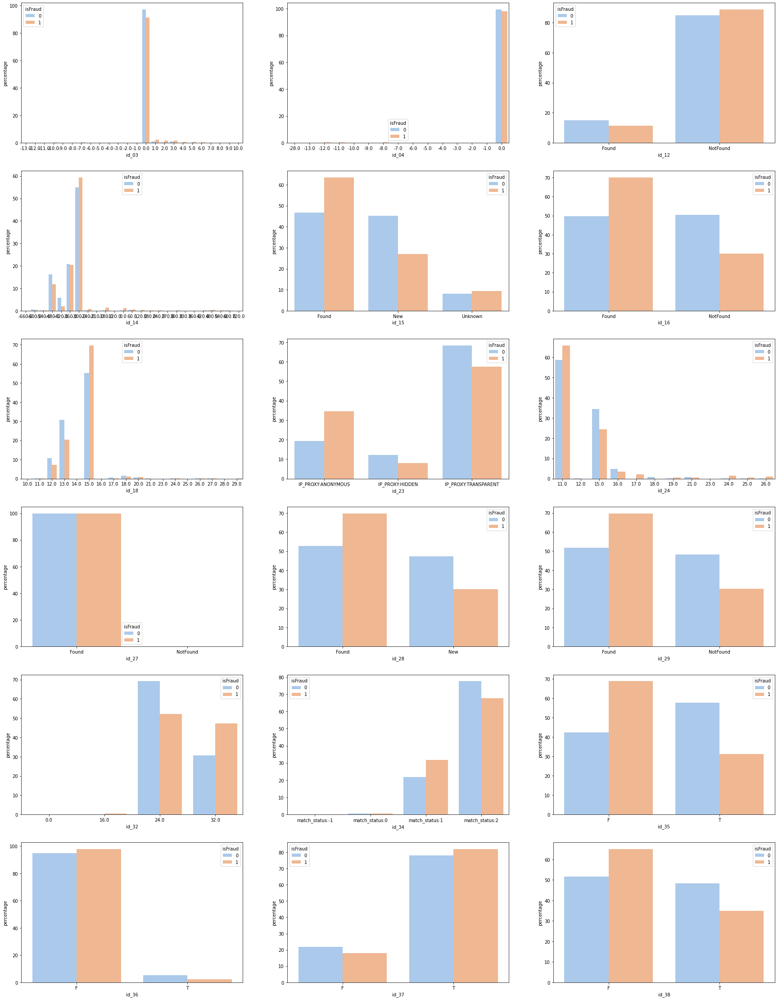

In [233]:
plt.figure(figsize=(30,40))
var = ['train_id_' + str(i) for i in range(1,19)]
col = ['id_'+str(i) for i in ['03','04',12,14,15,16,18,23,24,27,28,29,32,34,35,36,37,38]]
for i,j,k in zip(var,col,range(1,19)):
    i = (train.groupby(['isFraud'])[j]
                         .value_counts(normalize=True)
                         .rename('percentage')
                         .mul(100)
                         .reset_index()
                         .sort_values(j))
    plt.subplot(6,3,k)
    sns.barplot(x=j, y="percentage", hue="isFraud", data=i, palette = 'pastel')
plt.show()

Other than the categorical variables above, let's take a closer look to the id 30, 31, 33 as well since they are object type

In [234]:
# Device info:
train['id_30'].value_counts().head()         

Windows 10     21154
Windows 7      13110
iOS 11.2.1      3722
iOS 11.1.2      3699
Android 7.0     2871
Name: id_30, dtype: int64

In [235]:
#Splitting OS_id and OS_version to create relationship on train
train['OS_id_30'] = train['id_30'].str.split(' ', expand=True)[0]
train['version_id_30'] = train['id_30'].str.split(' ', expand=True)[1]


In [236]:
#Splitting OS_id and OS_version to create relationship on test
test['OS_id_30'] = test['id_30'].str.split(' ', expand=True)[0]
test['version_id_30'] = test['id_30'].str.split(' ', expand=True)[1]

In [237]:
# Browser info:
train['id_31'].value_counts().head() 

chrome 63.0              21861
mobile safari 11.0       13305
mobile safari generic    11458
ie 11.0 for desktop       9016
safari generic            8180
Name: id_31, dtype: int64

In [238]:
#spliting browser name and version to create relationship on train and test
train['browser_id_31'] = train['id_31'].str.split(' ', expand=True)[0].value_counts()
train['version_id_31'] = train['id_31'].str.split(' ', expand=True)[1].value_counts()
test['browser_id_31'] = test['id_31'].str.split(' ', expand=True)[0].value_counts()
test['version_id_31'] = test['id_31'].str.split(' ', expand=True)[1].value_counts()

In [239]:
# Device Resolution
train['id_33'].value_counts().head() 

1920x1080    16874
1366x768      8605
1334x750      6447
2208x1242     4900
1440x900      4384
Name: id_33, dtype: int64

In [240]:
#Splitting pixel width and hieght to create relationship on train and test
train['resol_width_id_31'] = train['id_33'].str.split('x', expand=True)[0].value_counts()
train['resol_height_id_31'] = train['id_33'].str.split('x', expand=True)[1].value_counts()

test['resol_width_id_31'] = test['id_33'].str.split('x', expand=True)[0].value_counts()
test['resol_height_id_31'] = test['id_33'].str.split('x', expand=True)[1].value_counts()

### DeviceType and DeviceInfo

In [241]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 589527, 444
The shape of test is: 506691, 443


In [242]:
train.iloc[:, 431:433].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 589527 entries, 0 to 590539
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   DeviceType  139908 non-null  object
 1   DeviceInfo  118025 non-null  object
dtypes: object(2)
memory usage: 29.6+ MB


In [243]:
# Calculating rows without any missing values in DeviceType and DeviceInfo
print(train[~train.iloc[:, 431:433].isnull().any(axis=1)].iloc[:, 431:433].shape)
train[~train.iloc[:, 431:433].isnull().any(axis=1)].iloc[:, 431:433].head()

(117980, 2)


,DeviceType,DeviceInfo
4,mobile,SAMSUNG SM-G892A Build/NRD90M
8,mobile,iOS Device
10,desktop,Windows
16,desktop,MacOS
17,desktop,Windows


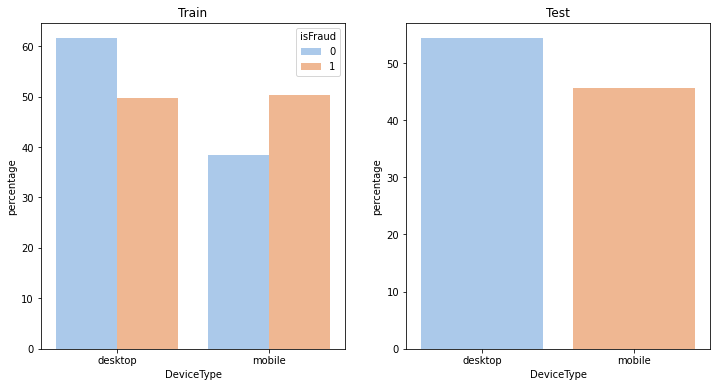

In [244]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
train_DeviceType = (train[~train['DeviceType'].isnull()].groupby(['isFraud'])['DeviceType'].\
                    value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('DeviceType'))
sns.barplot(x="DeviceType", y="percentage", hue="isFraud", data=train_DeviceType, palette = 'pastel')
plt.title('Train')
plt.subplot(1,2,2)
test_DeviceType =test[~test['DeviceType'].isnull()]['DeviceType'].value_counts(normalize=True).\
                                                                  mul(100).rename('percentage').reset_index()
sns.barplot(x="index", y="percentage", data=test_DeviceType, palette = 'pastel')
plt.xlabel('DeviceType')
plt.title('Test')
plt.show()

Both Desktop and mobile have the same percentage of fraud.

In [245]:
train['DeviceType'].value_counts()

desktop    84834
mobile     55074
Name: DeviceType, dtype: int64

In [246]:
train['DeviceInfo'].value_counts().head(10)

Windows                  47526
iOS Device               19781
MacOS                    12573
Trident/7.0               7428
rv:11.0                   1899
rv:57.0                    949
SM-J700M Build/MMB29K      530
SM-G610M Build/MMB29K      452
SM-G531H Build/LMY48B      402
rv:59.0                    362
Name: DeviceInfo, dtype: int64

Let's create a new feature by grouping the similar devices

In [247]:
# Function to perform data wragling on DeviceCorp and DeviceInfo:
def transform_DeviceInfo(df):
    df['DeviceCorp'] = df['DeviceInfo']
    df.loc[df['DeviceInfo'].str.contains('HUAWEI|HONOR', case=False, na=False, regex=True), 'DeviceCorp'] = 'HUAWEI'
    df.loc[df['DeviceInfo'].str.contains('OS', na=False, regex=False), 'DeviceCorp'] = 'APPLE'
    df.loc[df['DeviceInfo'].str.contains('Idea|TA', case=False, na=False), 'DeviceCorp'] = 'Lenovo'
    df.loc[df['DeviceInfo'].str.contains('Moto|XT|Edison', case=False, na=False), 'DeviceCorp'] = 'Moto'
    df.loc[df['DeviceInfo'].str.contains('MI|Mi|Redmi', na=False), 'DeviceCorp'] = 'Mi'
    df.loc[df['DeviceInfo'].str.contains('VS|LG|EGO', na=False), 'DeviceCorp'] = 'LG'
    df.loc[df['DeviceInfo'].str.contains('ONE TOUCH|ALCATEL', case=False, na=False, regex=False), 'DeviceCorp'] = 'ALCATEL'
    df.loc[df['DeviceInfo'].str.contains('ONE A', na=False, regex=False), 'DeviceCorp'] = 'ONEPLUS'
    df.loc[df['DeviceInfo'].str.contains('OPR6', na=False, regex=False), 'DeviceCorp'] = 'HTC'
    df.loc[df['DeviceInfo'].str.contains('Nexus|Pixel', case=False, na=False, regex=True), 'DeviceCorp'] = 'google'
    df.loc[df['DeviceInfo'].str.contains('STV', na=False, regex=False), 'DeviceCorp'] = 'blackberry'
    df.loc[df['DeviceInfo'].str.contains('ASUS', case=False, na=False, regex=False), 'DeviceCorp'] = 'ASUS'
    df.loc[df['DeviceInfo'].str.contains('BLADE', case=False, na=False, regex=False), 'DeviceCorp'] = 'ZTE'
    
    df['DeviceCorp'] = df['DeviceInfo'].astype('str').str.split(':', expand=True)[0].\
                                str.split('-', expand=True)[0].str.split(expand=True)[0]
    
    df.loc[df['DeviceInfo'].isin(['rv', 'SM', 'GT', 'SGH']), 'DeviceCorp'] = 'SAMSUNG'
    df.loc[df['DeviceInfo'].str.startswith('Z', na=False), 'DeviceCorp'] = 'ZTE'
    df.loc[df['DeviceInfo'].str.startswith('KF', na=False), 'DeviceCorp'] = 'Amazon'
    
    for i in ['D', 'E', 'F', 'G']:
        df.loc[df['DeviceInfo'].str.startswith(i, na=False), 'DeviceCorp'] = 'SONY'

    df.loc[df['DeviceCorp'].isin(df['DeviceCorp'].value_counts()\
                                 [df['DeviceCorp'].value_counts() < 100].index), 'DeviceCorp'] = 'Other'
    df['DeviceCorp'] = df['DeviceCorp'].str.upper()
    
    return df

In [248]:
train = transform_DeviceInfo(train)
test = transform_DeviceInfo(test)

In [249]:
train.DeviceCorp.sample(10)

339649    NAN
37913     NAN
164623    NAN
414233    NAN
220444    NAN
81401     NAN
581049    NAN
151102    NAN
251553     RV
5908      NAN
Name: DeviceCorp, dtype: object

Change the NAN into np.nan

In [250]:
def settingNaN(value):
    if value=='NAN':
        return np.nan
    else:
        return value
    
train['DeviceCorp'] = train['DeviceCorp'].apply(settingNaN)
test['DeviceCorp'] = test['DeviceCorp'].apply(settingNaN)

In [251]:
train.DeviceCorp.sample(10)

473481    NaN
456387    NaN
379741    IOS
586438    NaN
551769    NaN
249873    IOS
481284    NaN
477320    NaN
202631    NaN
14371     NaN
Name: DeviceCorp, dtype: object

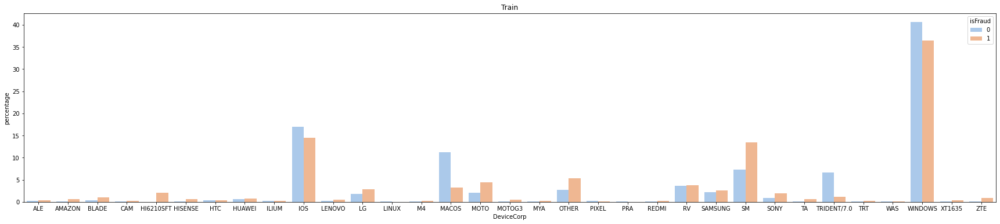

In [252]:
plt.figure(figsize=(30,6))
train_DeviceCorp = (train[~train['DeviceCorp'].isnull()].\
                    groupby(['isFraud'])['DeviceCorp'].\
                    value_counts(normalize=True).rename('percentage').\
                    mul(100).reset_index().sort_values('DeviceCorp'))
sns.barplot(x="DeviceCorp", y="percentage", hue="isFraud",\
            data=train_DeviceCorp, palette = 'pastel')
plt.title('Train')
plt.show()

In [253]:
train.sample(10)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,day,hour,hour_warning,LogTransactionAmt,new_card3,OS_id_30,version_id_30,browser_id_31,version_id_31,resol_width_id_31,resol_height_id_31,DeviceCorp
544212,3531212,0,14348318,29.633,C,9026,545.0,185.0,visa,137.0,credit,NaN,NaN,NaN,NaN,anonymous.com,anonymous.com,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN,M2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0000,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-20.0,374216.0,NaN,NaN,11.0,-1.0,NaN,NaN,NaN,NaN,

In [254]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 589527, 445
The shape of test is: 506691, 444


## Modelling


I will be building experimental models and bentchmark models

In [255]:
# Function to reduce memeory usage for optimization 
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df


In [256]:
train = reduce_mem_usage(train)
test = reduce_mem_usage(test) 

Memory usage of dataframe is 2022.11 MB
Memory usage after optimization is: 567.20 MB
Decreased by 72.0%
Memory usage of dataframe is 1720.26 MB
Memory usage after optimization is: 480.91 MB
Decreased by 72.0%


### Transaction Data Feature Engineering


Creating relationship with transaction and card1,card4 column by adding new columns consisting mean, standard deviation calculated for train and test dataset

In [257]:
#train
train['TransactionAmt_to_mean_card1'] = train['TransactionAmt'] / \
    train.groupby(['card1'])['TransactionAmt'].transform('mean')

train['TransactionAmt_to_mean_card4'] = train['TransactionAmt'] / \
    train.groupby(['card4'])['TransactionAmt'].transform('mean')

train['TransactionAmt_to_std_card1'] = train['TransactionAmt'] / \
    train.groupby(['card1'])['TransactionAmt'].transform('std')

train['TransactionAmt_to_std_card4'] = train['TransactionAmt'] / \
    train.groupby(['card4'])['TransactionAmt'].transform('std')

#test
test['TransactionAmt_to_mean_card1'] = test['TransactionAmt'] / \
    test.groupby(['card1'])['TransactionAmt'].transform('mean')

test['TransactionAmt_to_mean_card4'] = test['TransactionAmt'] / \
    test.groupby(['card4'])['TransactionAmt'].transform('mean')

test['TransactionAmt_to_std_card1'] = test['TransactionAmt'] / \
    test.groupby(['card1'])['TransactionAmt'].transform('std')

test['TransactionAmt_to_std_card4'] = test['TransactionAmt'] / \
    test.groupby(['card4'])['TransactionAmt'].transform('std')

In [258]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 589527, 449
The shape of test is: 506691, 448


In [259]:
train.info(max_cols=450)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 589527 entries, 0 to 590539
Data columns (total 449 columns):
 #    Column                        Non-Null Count   Dtype   
---   ------                        --------------   -----   
 0    TransactionID                 589527 non-null  int32   
 1    isFraud                       589527 non-null  int8    
 2    TransactionDT                 589527 non-null  int32   
 3    TransactionAmt                589527 non-null  float16 
 4    ProductCD                     589527 non-null  category
 5    card1                         589527 non-null  int16   
 6    card2                         580596 non-null  float16 
 7    card3                         587962 non-null  float16 
 8    card4                         587950 non-null  category
 9    card5                         585279 non-null  float16 
 10   card6                         587956 non-null  category
 11   addr1                         524776 non-null  float16 
 12   addr2         

In [260]:
test.info(max_cols=450)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 506691 entries, 0 to 506690
Data columns (total 448 columns):
 #    Column                        Non-Null Count   Dtype   
---   ------                        --------------   -----   
 0    TransactionID                 506691 non-null  int32   
 1    TransactionDT                 506691 non-null  int32   
 2    TransactionAmt                506691 non-null  float16 
 3    ProductCD                     506691 non-null  category
 4    card1                         506691 non-null  int16   
 5    card2                         498037 non-null  float16 
 6    card3                         503689 non-null  float16 
 7    card4                         503605 non-null  category
 8    card5                         502144 non-null  float16 
 9    card6                         503684 non-null  category
 10   addr1                         441082 non-null  float16 
 11   addr2                         441082 non-null  float16 
 12   dist1         

## Label Encoding

In [261]:
#label encoding categorical columns on both train and test data
cat_cols = ['ProductCD', 'card4', 'card6', 'P_emaildomain', 'R_emaildomain',
            'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 
            'id_12', 'id_15', 'id_16', 'id_23', 'id_27', 'id_28', 'id_29',
            'id_30', 'id_31', 'id_33', 'id_34', 'id_35', 'id_36',
            'id_37', 'id_38', 'DeviceType', 'DeviceInfo', 'hour_warning',
            'new_card3', 'DeviceCorp', 'OS_id_30', 'version_id_30',
            'browser_id_31', 'version_id_31', 'resol_width_id_31', 
            'resol_height_id_31']
for col in cat_cols:
    if col in train.columns:
        le = LabelEncoder()
        le.fit(list(train[col].astype(str).values) + list(test[col].astype(str).values))
        train[col] = le.transform(list(train[col].astype(str).values))
        test[col] = le.transform(list(test[col].astype(str).values))   

## Concatinating Train and Test data

In [262]:
# concatinating train and test along rows:
test['isFraud'] = 'test'

df = pd.concat([train, test], axis=0, sort=False)
df = df.reset_index()
df = df.drop('index', axis=1)

## Dimentionality Reduction using PCA
Since we have no interpretability with V columns.We will be passing V features through PCA .

In [263]:
def PCA_change(df, cols, n_components, prefix='PCA_', rand_seed=42):
    
    pca = PCA(n_components=n_components, random_state=rand_seed)
    principalComponents = pca.fit_transform(df[cols])
    principalDf = pd.DataFrame(principalComponents)
    df.drop(cols, axis=1, inplace=True)
    principalDf.rename(columns=lambda x: str(prefix)+str(x), inplace=True)
    df = pd.concat([df, principalDf], axis=1)
    return df

In [264]:
# getting all 'V' features
v_cols = train.columns[55:393]

In [265]:
# performing arbitary imputation with random value for fitting pca to "V" features 
for col in v_cols:
    df[col] = df[col].fillna((df[col].min() - 2))
    df[col] = (minmax_scale(df[col], feature_range=(0,1)))

In [266]:
# fitting PCA to 'V' features
pca_v = PCA(n_components=338, random_state=42)
pca_v_fit= pca_v.fit(df[v_cols])

In [267]:
#Saving trained model to pickle file:

joblib.dump(pca_v_fit, folder_path +"models/pca_v_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/pca_v_model.pkl']

In [268]:
# PCA explained varience 
pca_v_ev =pca_v_fit.explained_variance_ratio_

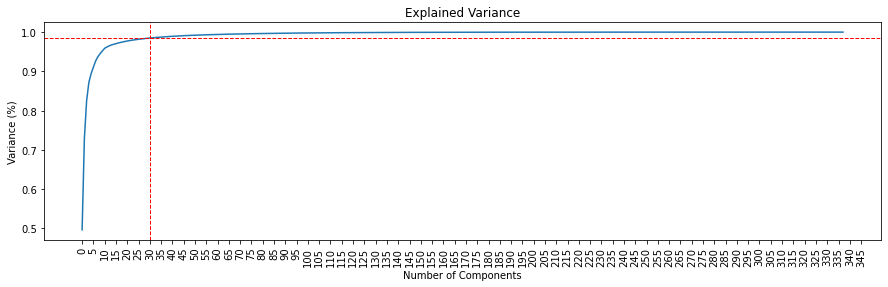

In [269]:
#Plotting the Cumulative Summation of the Explained Variance
plt.figure(figsize=(15,4))
plt.plot(np.cumsum(pca_v_ev))
plt.axvline(x=30, c="r", ls="--", lw=1)
plt.axhline(y=0.986, c="r", ls="--", lw=1)
plt.xticks(np.arange(0, 350, 5), rotation=90)
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Explained Variance')
plt.show()

30 of components can explain around 98% of variance. Let's set the n_components as 30.

In [270]:
# transforming and Concatinating PCA 'V' features with df: 
df = PCA_change(df, v_cols, prefix='PCA_V_', n_components=30)

In [271]:
# Memory Optimization
df = reduce_mem_usage(df)

Memory usage of dataframe is 464.17 MB
Memory usage after optimization is: 265.54 MB
Decreased by 42.8%


In [272]:
print("The shape of df is: %s, %s" % (df.shape[0],df.shape[1]))

The shape of df is: 1096218, 141


In [273]:
df.info(max_cols=150)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1096218 entries, 0 to 1096217
Data columns (total 141 columns):
 #    Column                        Non-Null Count    Dtype   
---   ------                        --------------    -----   
 0    TransactionID                 1096218 non-null  int32   
 1    isFraud                       1096218 non-null  category
 2    TransactionDT                 1096218 non-null  int32   
 3    TransactionAmt                1096218 non-null  float16 
 4    ProductCD                     1096218 non-null  int8    
 5    card1                         1096218 non-null  int16   
 6    card2                         1078633 non-null  float16 
 7    card3                         1091651 non-null  float16 
 8    card4                         1096218 non-null  int8    
 9    card5                         1087423 non-null  float16 
 10   card6                         1096218 non-null  int8    
 11   addr1                         965858 non-null   float16 
 12 

In [274]:
#dataframe after concatinating and PCA engineering features:
df

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,day,hour,hour_warning,LogTransactionAmt,new_card3,OS_id_30,version_id_30,browser_id_31,version_id_31,resol_width_id_31,resol_height_id_31,DeviceCorp,TransactionAmt_to_mean_card1,TransactionAmt_to_mean_card4,TransactionAmt_to_std_card1,TransactionAmt_to_std_card4,PCA_V_0,PCA_V_1,PCA_V_2,PCA_V_3,PCA_V_4,PCA_V_5,PCA_V_6,PCA_V_7,PCA_V_8,PCA_V_9,PCA_V_10,PCA_V_11,PCA_V_12,PCA_V_13,PCA_V_14,PCA_V_15,PCA_V_16,PCA_V_17,PCA_V_18,PCA_V_19,PCA_V_20,PCA_V_21,PCA_V_22,PCA_V_23,PCA_V_24,PCA_V_25,PCA_V_26,PCA_V_27,PCA_V_28,PCA_V_29
0,2987000,0,86400,68.500000,4,13926,NaN,150.0,1,142.0,0,315.0,87.0,19.0,NaN,2,2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,1,1,1,2,0,1,2,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2,2,2,86,136,NaN,461,4,2,2,2,2,2,2740,1,1,2,4.226562,0,6,48,0,0,0,0,44,0.194580,0.257812,0.184560,0.170288,-0.006145,0.895508,-0.773438,0.206909,-0.010735,0.049316,-0.162598,0.005196,0.016113,-0.023911,-0.020065,0.011826,-0.011604,0.078735,0.035522,0.012794,-0.011040,-0.008224,-0.004982,0.000117,0.015320,-0.012154,0.003899,-0.048737,-0.037140,-0.043549,-0.005394,-0.065552,-0.008392,-0.048950
1,2987001,0,86401,29.000000,4,2755,404.0,150.0,2,102.0,0,325.0,87.0,NaN,NaN,0,2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,2,2,2,0,1,1,2,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2,2,2,86,136,NaN,461,4,2,2,2,2,2,2740,1,1,2,3.367188,0,6,48,0,0,0,0,44,0.123779,0.219238,0.063004,0.124939,0.145020,-0.602051,-0.114807,-0.527344,0.008293,-0.033295,-0.112854,-0.035461,0.005112,0.105225,-0.112854,-0.044617,-0.015419,0.019547,0.004696,0.016083,-0.011353,0.005211,-0.033203,-0.002501,0.011490,-0.003065,-0.001894,0.017578,0.033905,0.038177,0.021271,-0.034454,0.004158,0.004051
2,2987002,0,86469,59.000000,4,4663,490.0,150.0,4,166.0,1,330.0,87.0,287.0,NaN,1,2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,1,1,1,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2,2,2,86,136,NaN,461,4,2,2,2,2,2,2740,1,1,2,4.078125,0,6,48,0,0,0,0,44,0.608398,0.442871,0.589226,0.258301,-0.604004,0.214233,0.216797,0.014114,-0.020767,0.109375,-0.151611,0.047638,0.004581,-0.029083,-0.003580,0.009399,-0.042358,0.020233,-0.009834,0.000280,-0.016815,0.000500,-0.008858,-0.005245,-0.004684,-0.002079,-0.006634,-0.001801,-0.000979,-0.000455,-0.007195,0.000585,-0.014809,0.003078
3,2987003,0,86499,50.000000,4,18132,567.0,150.0,2,117.0,1,476.0,87.0,NaN,NaN,4,2,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,2,2,2,0,1,0,2,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2,2,2,86,136,NaN,461,4,2,2,2,2,2,2740,1,1,2,3.912109,0,6,48,0,0,0,0,44,0.405029,0.378174,0.259460,0.215454,0.013382,-0.616699,-0.099182,-0.563477,0.029739,0.033661,-0.204712,0.151733,0.034393,-0.060944,0.137085,-0.045319,-0.016068,-0.019745,-0.027466,0.026321,0.137573,-0.051147,0.065613,-0.023285,0.015411,0.026398,-0.002920,0.033966,0.056549,0.033081,0.009094,-0.015373,0.051575,-0.013512
4,2987004,0,86506,50.000000,1,4497,514.0,150.0,2,102.0,0,420.0,87.0,NaN,NaN,0,2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0

In [275]:
#splitting train and test for modelling :
train, test = df[df['isFraud'] != 'test'], df[df['isFraud'] == 'test'].
              drop('isFraud', axis=1)

In [276]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
print("The shape of test is: %s, %s" % (test.shape[0],test.shape[1]))

The shape of train is: 589527, 141
The shape of test is: 506691, 140


###  Splitting X( Independant Variables) and Y( Target Variables)

In [ ]:
#sorting values as per TransactionDT and setting X,y,test:
X = train.sort_values('TransactionDT').drop(['isFraud', 'TransactionDT',
                                             'TransactionID'], axis=1)
y = train.sort_values('TransactionDT')['isFraud'].astype(bool)

test = test.sort_values('TransactionDT').drop(['TransactionDT',
                                               'TransactionID'], axis=1)

In [278]:
X.sample(10)

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,day,hour,hour_warning,LogTransactionAmt,new_card3,OS_id_30,version_id_30,browser_id_31,version_id_31,resol_width_id_31,resol_height_id_31,DeviceCorp,TransactionAmt_to_mean_card1,TransactionAmt_to_mean_card4,TransactionAmt_to_std_card1,TransactionAmt_to_std_card4,PCA_V_0,PCA_V_1,PCA_V_2,PCA_V_3,PCA_V_4,PCA_V_5,PCA_V_6,PCA_V_7,PCA_V_8,PCA_V_9,PCA_V_10,PCA_V_11,PCA_V_12,PCA_V_13,PCA_V_14,PCA_V_15,PCA_V_16,PCA_V_17,PCA_V_18,PCA_V_19,PCA_V_20,PCA_V_21,PCA_V_22,PCA_V_23,PCA_V_24,PCA_V_25,PCA_V_26,PCA_V_27,PCA_V_28,PCA_V_29
188411,59.0000,4,13108,215.0,150.0,4,226.0,1,191.0,87.0,NaN,NaN,0,2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,7.0,1.0,50.0,50.0,4.0,50.0,4.0,NaN,NaN,NaN,NaN,50.0,NaN,NaN,NaN,NaN,50.0,2,2,2,0,0,1,2,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2,2,2,86,136,NaN,461,4,2,2,2,2,2,2740,6,23,2,4.078125,0,6,48,0,0,0,0,44,0.512695,0.442871,0.295274,0.258301,0.013832,-0.618164,-0.096680,-0.562500,0.029602,0.018311,-0.205444,0.136353,0.023758,-0.109070,0.086426,-0.003094,-0.042725,0.008171,-0.010811,0.013428,0.029358,-0.014214,0.025192,-0.011070,-0.002913,0.015732,-0.001381,0.027527,0.033630,0.040802,0.024231,-0.023224,0.015114,-0.005230
70197,97.0000,4,16751,111.0,150.0,4,226.0,1,231.0,87.0,1.0,NaN,13,2,4.0,5.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,2.0,0.0,8.0,3.0,21.0,21.0,6.0,447.0,6.0,NaN,NaN,NaN,NaN,0.0,447.0,NaN,NaN,NaN,447.0,1,1,1,0,0,1,0,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2,2,2,86,136,NaN,461,4,2,2,2,2,2,2740,4,15,1,4.574219,0,6,48,0,0,0,0,44,0.519531,0.728027,0.174084,0.424805,-0.605469,0.214966,0.214966,0.012917,-0.023911,0.120361,-0.160645,0.052795,0.012024,-0.026245,0.042328,-0.018967,0.157227,-0.065369,0.001747,-0.012405,-0.048737,-0.011650,-0.052704,-0.005428,-0.008209,-0.016678,0.013481,0.026840,-0.003531,-0.006165,0.017532,0.016159,-0.010452,-0.013443
554226,59.0000,4,13844,583.0,150.0,4,226.0,1,441.0,87.0,NaN,NaN,5,2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,1,1,0,0,1,0,1,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2,2,2,86,136,NaN,461,4,2,2,2,2,2,2740,1,21,2,4.078125,0,6,48,0,0,0,0,44,0.235840,0.442871,0.142745,0.258301,-0.604004,0.214233,0.216919,0.014114,-0.020782,0.109314,-0.151733,0.047668,0.004501,-0.029037,-0.003576,0.009392,-0.042358,0.020233,-0.009804,0.000283,-0.016830,0.000488,-0.008820,-0.005253,-0.004745,-0.002096,-0.006618,-0.001801,-0.000970,-0.000461,-0.007236,0.000574,-0.014824,0.003025
495448,117.0000,4,9112,250.0,150.0,4,226.0,1,441.0,87.0,NaN,NaN,2,2,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,1,1,1,1,1,0,1,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2,2,2,86,136,NaN,461,4,2,2,2,2,2,2740,3,12,3,4.761719,0,6,48,0,0,0,0,44,1.199219,0.877930,0.764311,0.512207,0.032715,0.892090,-0.778809,0.196045,-0.011780,0.016769,-0.166626,0.009819,-0.009903,-0.023071,-0.002943,0.023438,-0.065918,-0.035400,0.068054,0.021317,-0.016632,0.002724,-0.015091,-0.000299,0.019073,-0.015053,-0.004238,-0.022873,-0.046570,-0.003468,-0.001872,-0.021713,0.011711,0.001095
537091,59.0000,4,13143,170.0,150.0,2,102.0,0,184.0,87.0,5.0,NaN,1,2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,495.0,495.0,NaN,NaN,NaN,495.0,1,1,1,0,0,1,0,

In [279]:
y.sample(10)

419828    False
56515     False
226085    False
108037    False
466165    False
379482    False
307776    False
28143     False
506740    False
60401     False
Name: isFraud, dtype: bool

In [280]:
test.sample(10)

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,day,hour,hour_warning,LogTransactionAmt,new_card3,OS_id_30,version_id_30,browser_id_31,version_id_31,resol_width_id_31,resol_height_id_31,DeviceCorp,TransactionAmt_to_mean_card1,TransactionAmt_to_mean_card4,TransactionAmt_to_std_card1,TransactionAmt_to_std_card4,PCA_V_0,PCA_V_1,PCA_V_2,PCA_V_3,PCA_V_4,PCA_V_5,PCA_V_6,PCA_V_7,PCA_V_8,PCA_V_9,PCA_V_10,PCA_V_11,PCA_V_12,PCA_V_13,PCA_V_14,PCA_V_15,PCA_V_16,PCA_V_17,PCA_V_18,PCA_V_19,PCA_V_20,PCA_V_21,PCA_V_22,PCA_V_23,PCA_V_24,PCA_V_25,PCA_V_26,PCA_V_27,PCA_V_28,PCA_V_29
1074944,100.00000,2,9727,399.0,150.0,0,133.0,0,512.0,87.0,NaN,NaN,10,4,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,0.0,0.0,0.0,2,2,2,3,2,2,2,2,2,-5.0,92237.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,100.0,1,27.0,-480.0,1,1,166.0,NaN,277.0,177.0,NaN,NaN,3,NaN,NaN,NaN,2,1,1,11,74,24.0,68,3,1,0,1,0,1,2332,5,1,2,4.605469,0,0,42,0,0,0,0,35,0.666504,0.507324,1.414214,0.419434,0.442139,-1.016602,-0.005421,0.358154,0.025314,0.010391,0.125366,0.319824,0.137817,0.019287,-0.205566,0.045929,-0.193970,0.066711,0.002768,0.001672,0.075562,-0.048828,0.065613,-0.002813,0.012177,-0.018387,0.013924,0.105164,-0.021912,-0.063477,0.033691,0.010239,-0.032562,-0.028458
674840,160.00000,4,10112,360.0,150.0,4,166.0,1,272.0,87.0,0.0,NaN,4,2,1.0,1.0,0.0,0.0,2.0,1.0,0.0,0.0,2.0,0.0,1.0,0.0,8.0,1.0,99.0,99.0,14.0,99.0,14.0,NaN,NaN,NaN,NaN,99.0,99.0,NaN,NaN,NaN,99.0,1,1,1,3,2,0,1,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2,2,2,86,136,NaN,461,4,2,2,2,2,2,2740,1,14,1,5.074219,0,6,48,0,0,0,0,44,1.467773,1.188477,0.838630,0.650391,-0.856445,0.210083,0.243652,-0.036804,0.050201,-0.032715,0.059052,0.196655,0.015427,-0.292725,0.252197,0.074890,-0.062744,0.020828,-0.019623,-0.021713,0.004272,-0.015022,0.061646,-0.007801,-0.014427,0.022949,-0.000053,0.007244,-0.014595,0.014717,0.008133,-0.004921,0.005791,-0.002522
924236,100.00000,1,3385,352.0,117.0,4,226.0,1,296.0,32.0,NaN,NaN,4,0,15.0,15.0,0.0,4.0,0.0,13.0,0.0,14.0,0.0,13.0,13.0,0.0,11.0,10.0,NaN,NaN,NaN,0.0,NaN,150.0,22.0,364.75,0.75,0.0,NaN,NaN,0.0,0.0,0.0,2,2,2,3,2,2,2,2,2,0.0,94294.0,0.0,0.0,3.0,-100.0,NaN,NaN,0.0,0.0,100.0,1,NaN,60.0,0,0,121.0,15.0,410.0,436.0,NaN,NaN,3,NaN,NaN,NaN,2,0,0,10,166,32.0,216,3,1,0,1,1,1,1589,2,19,2,4.605469,0,0,40,0,0,0,0,33,2.667969,0.742676,3.627733,0.406250,0.431641,-1.016602,-0.012054,0.349121,0.061859,0.019730,0.111816,0.259277,0.107300,0.007053,-0.176758,0.025345,-0.198853,0.070190,-0.010193,0.029282,0.083679,-0.058258,0.037170,0.008865,0.015747,0.022766,0.019180,0.103882,-0.041199,-0.037842,0.031982,0.006779,-0.057404,-0.026276
904658,59.00000,4,10112,360.0,150.0,4,166.0,1,512.0,87.0,3.0,NaN,2,2,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,2.0,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,NaN,NaN,NaN,2.0,1,1,1,0,1,0,2,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2,2,2,86,136,NaN,461,4,2,2,2,2,2,2740,2,3,2,4.078125,0,6,48,0,0,0,0,44,0.541504,0.438232,0.309245,0.239746,0.031830,0.892578,-0.780273,0.195435,-0.013260,0.022919,-0.171265,0.013481,-0.005569,-0.019073,0.021820,0.006741,0.032837,-0.079529,0.071777,0.016953,-0.021347,-0.005295,-0.032013,-0.000049,0.018860,-0.021790,0.006138,-0.009323,-0.046051,-0.006130,0.009903,-0.012939,0.016205,-0.007343
646196,12.00000,4,17602,555.0,150.0,4,226.0,1,123.0,87.0,4.0,NaN,4,2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,7.0,1.0,28.0,28.0,0.0,28.0,0.0,NaN,NaN,NaN,NaN,28.0,28

In [281]:
print('train shape: %d, %d' %(train.shape[0],train.shape[1]))
print('test shape: %d, %d' %(test.shape[0],test.shape[1]))
print('X shape: %d, %d' %(X.shape[0],X.shape[1]))
print('y shape: %d, 1' %(y.shape[0]))

train shape: 589527, 141
test shape: 506691, 138
X shape: 589527, 138
y shape: 589527, 1


## Imputing Missing Value

We can't use the traditional Mean/Mode imputation as the values in our dataset is not missing in random.This will cause our dataset become biased to a particular class thereby making our model prediction wrong/misclassify.

Therfore,I am going for Arbitary value imputing method where we just flag the missing value with a random value(-999).We use this method as our main aim is to attain a result with least misprediction(FP) in our case.Thereby, this imputation method is suitable for our situation.

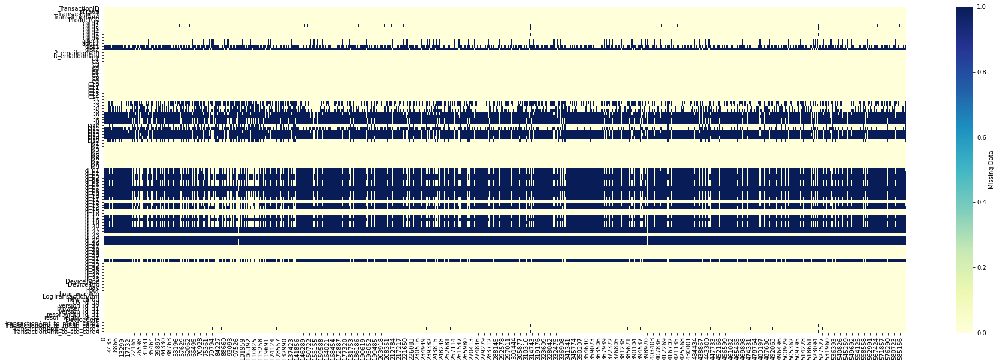

In [282]:
#checking missing value patterns across train data
plt.figure(figsize=(30,10))
sns.heatmap(train.iloc[:,:].isna(),
            xticklabels=True,
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.savefig("visualizing_missing_data_train.png", dpi=1080)


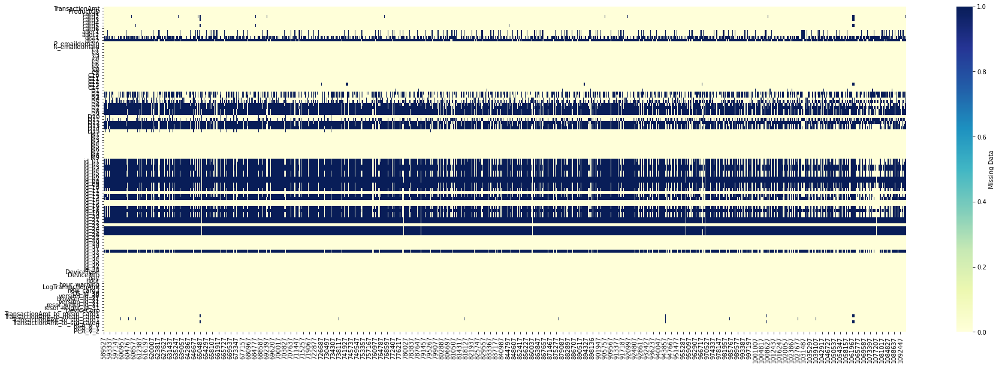

In [285]:
#checking missing value patterns across test data
plt.figure(figsize=(30,10))
sns.heatmap(test.iloc[:,:].isna(),
            xticklabels=True,
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.savefig("visualizing_missing_data_test.png", dpi=1080)


In [286]:
# Function to impute missing vallues with NaN: 
def fillna(df):
    df.fillna(-999, inplace = True)

#filling missing values with arbitary value(-999):   
fillna(X)
fillna(test)

In [287]:
# Function to replace +ve and -ve infinity values:
def clean_inf_nan(df):
    return df.replace([np.inf, -np.inf], np.nan)   

# Cleaning infinite values to NaN
X = clean_inf_nan(X)
test = clean_inf_nan(test)

In [288]:
#rechecking missing values:

print(X.isnull().sum()> 0)


TransactionAmt                  False
ProductCD                       False
card1                           False
card2                           False
card3                           False
card4                           False
card5                           False
card6                           False
addr1                           False
addr2                           False
dist1                           False
dist2                           False
P_emaildomain                   False
R_emaildomain                   False
C1                              False
C2                              False
C3                              False
C4                              False
C5                              False
C6                              False
C7                              False
C8                              False
C9                              False
C10                             False
C11                             False
C12                             False
C13         

In [289]:
print(test.isnull().sum()>0)

TransactionAmt                  False
ProductCD                       False
card1                           False
card2                           False
card3                           False
card4                           False
card5                           False
card6                           False
addr1                           False
addr2                           False
dist1                           False
dist2                           False
P_emaildomain                   False
R_emaildomain                   False
C1                              False
C2                              False
C3                              False
C4                              False
C5                              False
C6                              False
C7                              False
C8                              False
C9                              False
C10                             False
C11                             False
C12                             False
C13         

In [290]:
# refilling missing values in 'TransactionAmt_to_std_card1' with NaN
fillna(X)
fillna(test)

## Modelling with Un-sampled data
  


In [291]:
#Training and Validation set on unsampled data
X_train_, X_test_, y_train_, y_test_ = train_test_split(X, y,
                                                    test_size=0.30,
                                                    random_state=42)

In [292]:
# Saving train_test_split to csv:
X_train_.to_csv(folder_path +'train-test-split/X_train_for_modeling_unsampled.csv', 
               index=False)
X_test_.to_csv(folder_path +'train-test-split/X_test_for_modeling_unsampled.csv', 
              index=False)
y_train_.to_csv(folder_path +'train-test-split/y_train_for_modeling_unsampled.csv', 
               index=False)
y_test_.to_csv(folder_path + 'train-test-split/y_test_for_modeling_unsampled.csv',     
              index=False)

### Un-Sampled Logistic Regression 

In [297]:
#Fitting the model

us_logistic = LogisticRegression(random_state=42, class_weight = 'balanced',n_jobs= 5)
us_logistic_fit =us_logistic.fit(X_train_,y_train_)

# Predictiing train and test data

us_logistic_train_predict = us_logistic_fit.predict(X_train_)
us_logistic_test_predict = us_logistic_fit.predict(X_test_)

#probability predict
lr_probas = us_logistic_fit.predict_proba(X_test_)

<Figure size 360x360 with 0 Axes>

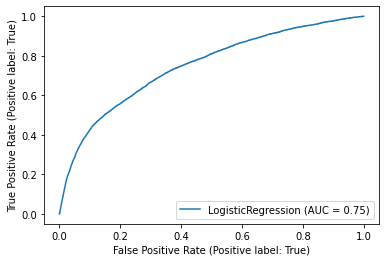

In [298]:
#plot roc_auc curve for Unsampled logistic model
plt.figure(figsize= (5,5))
plot_roc_curve(us_logistic_fit, X_test_, y_test_)
plt.show()

<Figure size 360x360 with 0 Axes>

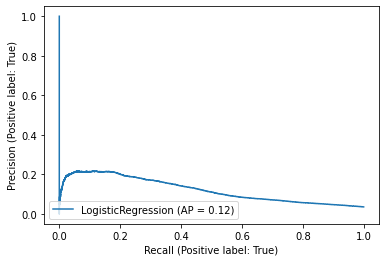

In [299]:
# plot precision_recall curve for unsampled  logistic model
plt.figure(figsize= (5,5))
plot_precision_recall_curve(us_logistic_fit, X_test_, y_test_) 
plt.show()

In [300]:
print('Train metrics for us_logistic Regression :\n')
print('ROC_AUC:', roc_auc_score(y_train_, us_logistic_train_predict))
print('Accuracy score:',accuracy_score(y_train_,us_logistic_train_predict))
print('Precision score:',precision_score(y_train_, us_logistic_train_predict))
print('Recall score:', recall_score(y_train_, us_logistic_train_predict))
print('F1 score:',f1_score(y_train_, us_logistic_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train_, us_logistic_train_predict))
print('Classification Report: \n', classification_report(y_train_, us_logistic_train_predict))

Train metrics for us_logistic Regression :

ROC_AUC: 0.6867252559887072
Accuracy score: 0.7627560169434024
Precision score: 0.08556902310185231
Recall score: 0.6050455501051156
F1 score: 0.14993357702893959
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[306131  92267]
 [  5636   8634]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.98      0.77      0.86    398398
        True       0.09      0.61      0.15     14270

    accuracy                           0.76    412668
   macro avg       0.53      0.69      0.51    412668
weighted avg       0.95      0.76      0.84    412668



In [302]:
print('Test metrics for us_logistic Regression : \n')
print('ROC_AUC:', roc_auc_score(y_test_, us_logistic_test_predict))
print('Accuracy score:',accuracy_score(y_test_, us_logistic_test_predict))
print('Precision score:',precision_score(y_test_,  us_logistic_test_predict))
print('Recall score:', recall_score(y_test_,  us_logistic_test_predict))
print('F1 score:',f1_score(y_test_, us_logistic_test_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_test_, us_logistic_test_predict))
print('Classification Report: \n', classification_report(y_test_, us_logistic_test_predict))

Test metrics for us_logistic Regression : 

ROC_AUC: 0.6796768224760935
Accuracy score: 0.763286007497498
Precision score: 0.08611104649810425
Recall score: 0.5896782414781777
F1 score: 0.1502770504779882
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[131292  39289]
 [  2576   3702]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.98      0.77      0.86    170581
        True       0.09      0.59      0.15      6278

    accuracy                           0.76    176859
   macro avg       0.53      0.68      0.51    176859
weighted avg       0.95      0.76      0.84    176859



In [557]:
# avg_expected_loss, avg_bias, avg_var
avg_expected_loss_lr_us, avg_bias_lr_us, avg_var_lr_us = bias_variance_decomp(
                                        us_logistic_fit, X_train_.values, y_train_.values, 
                                        X_test_.values.astype(int), y_test_.values.astype(int), 
                                        loss='0-1_loss',
                                        random_seed=42)

print('Average expected loss: %.3f' % avg_expected_loss_lr_us)
print('Average bias: %.3f' % avg_bias_lr_us)
print('Average variance: %.3f' % avg_var_lr_us)

Average expected loss: 0.235
Average bias: 0.235
Average variance: 0.024


([0.2365627877671691,
  0.23514230671367817,
  0.23537964458804522,
  0.22745915295001423,
  0.22756307734062248,
  0.23668416801292408,
  0.24364153745495332,
  0.2332810313387897,
  0.2446223892773579,
  0.23724398305659755],
 [0.23609202811279043,
  0.2343844531519459,
  0.23566230726171697,
  0.22660989828055117,
  0.2267003658281456,
  0.23531174551478862,
  0.2423003635664569,
  0.23297089772078322,
  0.24319938482067635,
  0.236713992502502])

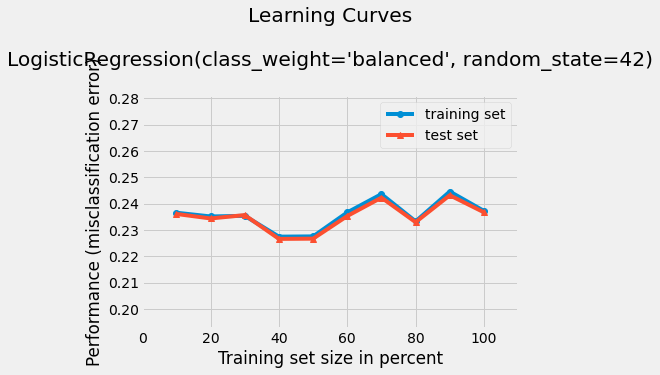

In [566]:
#plotting learning curve
plot_learning_curves(X_train_, y_train_, X_test_, y_test_, us_logistic_fit)

<AxesSubplot:title={'center':'Cumulative Gains Curve'}, xlabel='Percentage of sample', ylabel='Gain'>

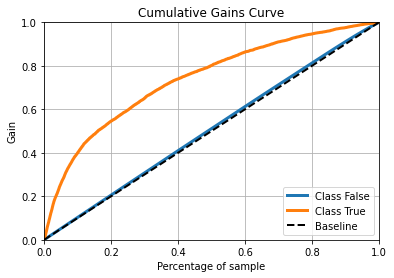

In [555]:
#calculating the cumulative gain
plot_cumulative_gain(y_test_, lr_probas)

2.4258543441554985


<AxesSubplot:title={'center':'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

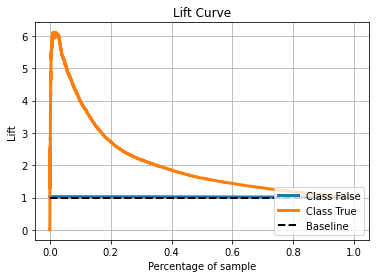

In [546]:
#calculating lift score
print(lift_score(y_test_.to_numpy().astype(int), us_logistic_test_predict))
plot_lift_curve(y_test_, lr_probas)

<AxesSubplot:title={'center':'KS Statistic Plot'}, xlabel='Threshold', ylabel='Percentage below threshold'>

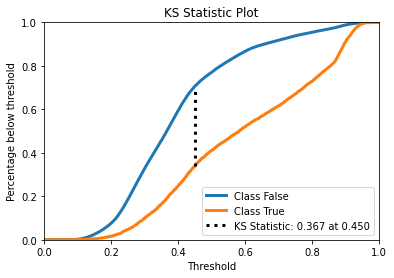

In [518]:
#plotting ks_statistics curve
plot_ks_statistic(y_test_, lr_probas)

In [304]:
joblib.dump(us_logistic_fit, folder_path +"models/us_logistic_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/us_logistic_model.pkl']

### Un-Sampled RandomForest

In [305]:
#Fitting the model

us_best_rfc = RandomForestClassifier( bootstrap = True,
                                      ccp_alpha = 0,
                                      class_weight = None,
                                      criterion =  'entropy' ,
                                      max_depth = 40,
                                      max_features =  'auto' ,
                                      max_leaf_nodes = 150,
                                      max_samples = None,
                                      min_impurity_decrease = 0.0,
                                      min_impurity_split = None,
                                      min_samples_leaf = 10,
                                      min_samples_split = 50,
                                      min_weight_fraction_leaf = 0.0,
                                      n_estimators = 200,
                                      n_jobs = 5,
                                      oob_score = False,
                                      random_state = 42,
                                      verbose = 0,
                                      warm_start = False)
us_best_rfc_fit= us_best_rfc.fit(X_train_, y_train_)

# Predictiing train and test data

us_best_rfc_train_predict = us_best_rfc_fit.predict(X_train_)
us_best_rfc_test_predict = us_best_rfc_fit.predict(X_test_)

#probability predict
rf_probas = us_best_rfc_fit.predict_proba(X_test_)

<Figure size 360x360 with 0 Axes>

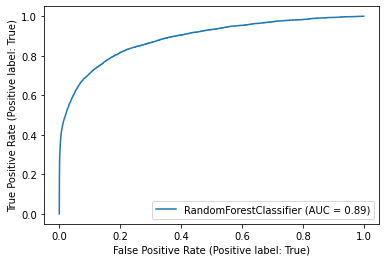

In [306]:
#plot roc_auc curve for unsampled rfc model
plt.figure(figsize= (5,5))
plot_roc_curve(us_best_rfc_fit, X_test_, y_test_) 
plt.show()

<Figure size 360x360 with 0 Axes>

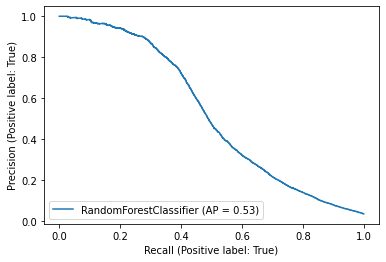

In [307]:
# plot precision_recall curve for unsampled rfc model
plt.figure(figsize= (5,5))
plot_precision_recall_curve(us_best_rfc_fit,X_test_, y_test_)
plt.show()

In [308]:
print('Train metrics for Random Forest:\n')
print('ROC_AUC:', roc_auc_score(y_train_, us_best_rfc_train_predict))
print('Accuracy score:',accuracy_score(y_train_,us_best_rfc_train_predict))
print('Precision score:',precision_score(y_train_, us_best_rfc_train_predict))
print('Recall score:', recall_score(y_train_, us_best_rfc_train_predict))
print('F1 score:',f1_score(y_train_, us_best_rfc_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train_, us_best_rfc_train_predict))
print('Classification Report: \n', classification_report(y_train_, us_best_rfc_train_predict))

Train metrics for Random Forest:

ROC_AUC: 0.6317162868683612
Accuracy score: 0.9738239941066427
Precision score: 0.9258349705304518
Recall score: 0.2641906096706377
F1 score: 0.411078399302148
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[398096    302]
 [ 10500   3770]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.97      1.00      0.99    398398
        True       0.93      0.26      0.41     14270

    accuracy                           0.97    412668
   macro avg       0.95      0.63      0.70    412668
weighted avg       0.97      0.97      0.97    412668



In [309]:
print('Test metrics for Random Forest : \n')
print('ROC_AUC:', roc_auc_score(y_test_, us_best_rfc_test_predict))
print('Accuracy score:',accuracy_score(y_test_, us_best_rfc_test_predict))
print('Precision score:',precision_score(y_test_,  us_best_rfc_test_predict))
print('Recall score:', recall_score(y_test_,  us_best_rfc_test_predict))
print('F1 score:',f1_score(y_test_, us_best_rfc_test_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_test_, us_best_rfc_test_predict))
print('Classification Report: \n', classification_report(y_test_, us_best_rfc_test_predict))

Test metrics for Random Forest : 

ROC_AUC: 0.6243377689127401
Accuracy score: 0.9724695944226757
Precision score: 0.9084057971014493
Recall score: 0.24960178400764574
F1 score: 0.3916031488191928
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[170423    158]
 [  4711   1567]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.97      1.00      0.99    170581
        True       0.91      0.25      0.39      6278

    accuracy                           0.97    176859
   macro avg       0.94      0.62      0.69    176859
weighted avg       0.97      0.97      0.96    176859



In [ ]:
# avg_expected_loss, avg_bias, avg_var 
avg_expected_loss_rfc_us, avg_bias_rfc_us, avg_var_rfc_us = bias_variance_decomp(
                                        us_best_rfc_fit, X_train_.values, y_train_.values, 
                                        X_test_.values.astype(int),
                                        y_test_.values.astype(int), 
                                        loss='0-1_loss',
                                        random_seed=42)

print('Average expected loss: %.3f' % avg_expected_loss_rfc_us)
print('Average bias: %.3f' % avg_bias_rfc_us)
print('Average variance: %.3f' % avg_var_rfc_us)

([0.027601415208646344,
  0.02704372796336011,
  0.027116316639741518,
  0.02669219165550958,
  0.026544340729109113,
  0.026332794830371566,
  0.02626122056171179,
  0.026274179575566284,
  0.026198098551161682,
  0.026176005893357373],
 [0.02952069162440136,
  0.02874606324812421,
  0.028452043718442375,
  0.028067556641166128,
  0.027988397537021016,
  0.027875313102528002,
  0.02777919133320894,
  0.027592602016295466,
  0.027666106898715927,
  0.02753040557732431])

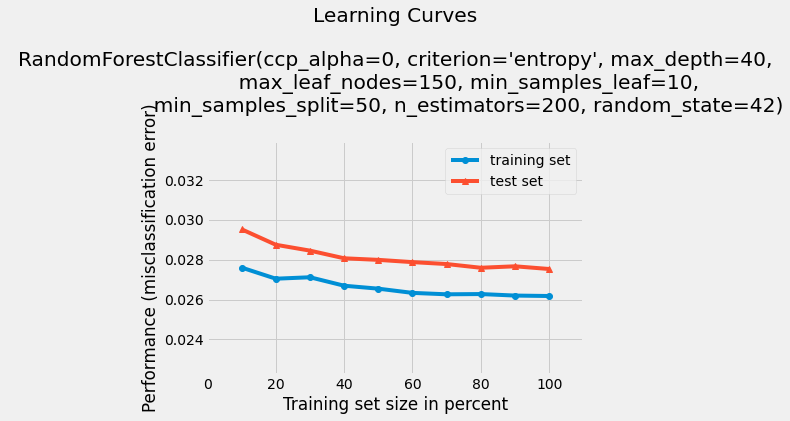

In [567]:
#plotting learning curve
plot_learning_curves(X_train_, y_train_, X_test_, y_test_, us_best_rfc_fit)

<AxesSubplot:title={'center':'Cumulative Gains Curve'}, xlabel='Percentage of sample', ylabel='Gain'>

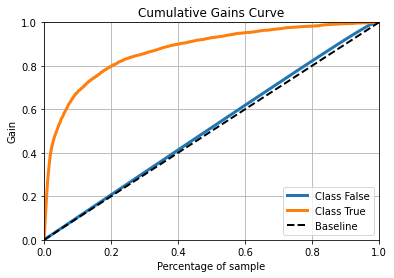

In [554]:
#calculating the cumulative gain
plot_cumulative_gain(y_test_, rf_probas)

25.59091125670042


<AxesSubplot:title={'center':'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

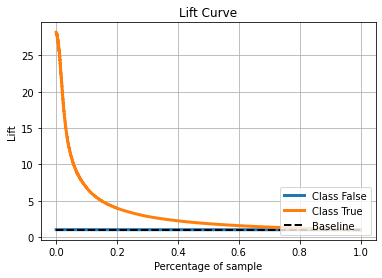

In [545]:
#calculating lift score
print(lift_score(y_test_.to_numpy().astype(int), us_best_rfc_test_predict))
plot_lift_curve(y_test_, rf_probas)

<AxesSubplot:title={'center':'KS Statistic Plot'}, xlabel='Threshold', ylabel='Percentage below threshold'>

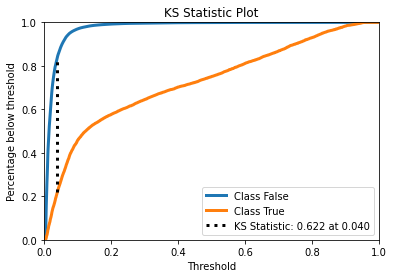

In [520]:
#plotting ks_statistics curve
plot_ks_statistic(y_test_, rf_probas)

In [310]:
joblib.dump(us_best_rfc_fit, folder_path +"models/us_best_rfc_final_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/us_best_rfc_final_model.pkl']

### Un-Sampled XGBoost

In [311]:
#Tuned best random Hyperparameters model fit_predict :

us_best_xgb = XGBClassifier(objective =  'binary:logistic' , 
                      use_label_encoder = False,
                      base_score = 0.7,
                      booster =  'gbtree' ,
                      colsample_bylevel = 1,
                      colsample_bynode = 1,
                      colsample_bytree = 0.5,
                      gamma = 0,
                      gpu_id = 0,
                      importance_type =  'gain' ,
                      learning_rate = 0.1,
                      max_delta_step = 0,
                      max_depth = 11,
                      min_child_weight = 3,
                      missing = -999,
                      n_estimators = 1000,
                      n_jobs = 5,
                      num_parallel_tree = 1,
                      random_state = 42,
                      reg_alpha = 0,
                      reg_lambda = 1,
                      scale_pos_weight = 1,
                      subsample = 0.1,
                      tree_method =  'gpu_hist' ,
                      validate_parameters = 1,
                      verbosity = None,
                      predictor =  'gpu_predictor' ,
                      sampling_method =  'gradient_based' ,
                      grow_policy =  'lossguide' ,
                      eval_metric =  'auc' )

# fit and predict best xgb model
us_best_xgb_fit= us_best_xgb.fit(X_train_,y_train_)
us_best_xgb_train_predict = us_best_xgb_fit.predict(X_train_)
us_best_xgb_test_predict = us_best_xgb_fit.predict(X_test_)

#probability predict
xgb_probas = us_best_xgb_fit.predict_proba(X_test_)

<Figure size 360x360 with 0 Axes>

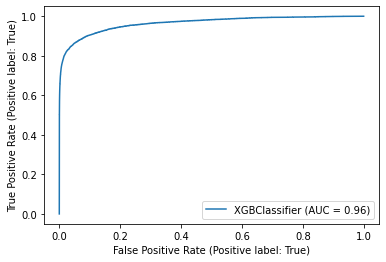

In [312]:
#plot roc_auc curve for unsampled xgb model
plt.figure(figsize= (5,5))
plot_roc_curve(us_best_xgb_fit, X_test_, y_test_) 
plt.show()

<Figure size 360x360 with 0 Axes>

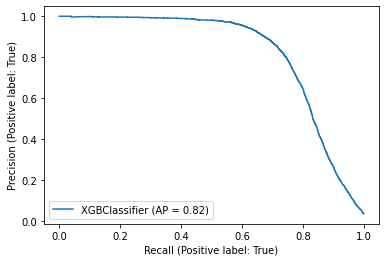

In [316]:
# plot precision_recall curve for unsampled xgb model
plt.figure(figsize= (5,5))
plot_precision_recall_curve(us_best_xgb_fit, X_test_, y_test_)
plt.show()

In [317]:
print('Train metrics for best XGB Unsampled :\n')
print('ROC_AUC:', roc_auc_score(y_train_, us_best_xgb_train_predict))
print('Accuracy score:',accuracy_score(y_train_, us_best_xgb_train_predict))
print('Precision score:',precision_score(y_train_,  us_best_xgb_train_predict))
print('Recall score:', recall_score(y_train_,  us_best_xgb_train_predict))
print('F1 score:',f1_score(y_train_, us_best_xgb_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train_, us_best_xgb_train_predict))
print('Classification Report: \n', classification_report(y_train_, us_best_xgb_train_predict))

Train metrics for best XGB Unsampled :

ROC_AUC: 0.9888577435178696
Accuracy score: 0.9992294047515193
Precision score: 1.0
Recall score: 0.9777154870357393
F1 score: 0.9887321947416909
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[398398      0]
 [   318  13952]]
Classification Report: 
               precision    recall  f1-score   support

       False       1.00      1.00      1.00    398398
        True       1.00      0.98      0.99     14270

    accuracy                           1.00    412668
   macro avg       1.00      0.99      0.99    412668
weighted avg       1.00      1.00      1.00    412668



In [318]:
print('Test metrics for best XGB Unsampled : \n')
print('ROC_AUC:', roc_auc_score(y_test_, us_best_xgb_test_predict))
print('Accuracy score:',accuracy_score(y_test_, us_best_xgb_test_predict))
print('Precision score:',precision_score(y_test_,  us_best_xgb_test_predict))
print('Recall score:', recall_score(y_test_,  us_best_xgb_test_predict))
print('F1 score:',f1_score(y_test_, us_best_xgb_test_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_test_, us_best_xgb_test_predict))
print('Classification Report: \n', classification_report(y_test_, us_best_xgb_test_predict))

Test metrics for best XGB Unsampled : 

ROC_AUC: 0.8027273107629822
Accuracy score: 0.9849654244341538
Precision score: 0.9527145359019265
Recall score: 0.606562599553998
F1 score: 0.7412165450121655
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[170392    189]
 [  2470   3808]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.99      1.00      0.99    170581
        True       0.95      0.61      0.74      6278

    accuracy                           0.98    176859
   macro avg       0.97      0.80      0.87    176859
weighted avg       0.98      0.98      0.98    176859



In [560]:
# avg_expected_loss, avg_bias, avg_var 
avg_expected_loss_xgb_us, avg_bias_xgb_us, avg_var_xgb_us = bias_variance_decomp(
                                        us_best_xgb_fit, X_train_.values, y_train_.values,
                                        X_test_.values.astype(int), y_test_.values.astype(int), 
                                        loss='0-1_loss',
                                        random_seed=42)

print('Average expected loss: %.3f' % avg_expected_loss_xgb_us)
print('Average bias: %.3f' % avg_bias_xgb_us)
print('Average variance: %.3f' % avg_var_xgb_us)

Average expected loss: 0.027
Average bias: 0.027
Average variance: 0.002


([0.0,
  0.0,
  8.077544426494346e-06,
  5.452331477521249e-05,
  0.0001405488189052701,
  0.000210016155088853,
  0.0003150238691162369,
  0.0004997970521061145,
  0.0006004291857049388,
  0.0007003208390279837],
 [0.024103947212185978,
  0.021836604300601043,
  0.019919823135944453,
  0.019077344098971497,
  0.018127434849230177,
  0.016979627839126085,
  0.016566869653226582,
  0.015905325711442448,
  0.015322940873803426,
  0.014734901814439752])

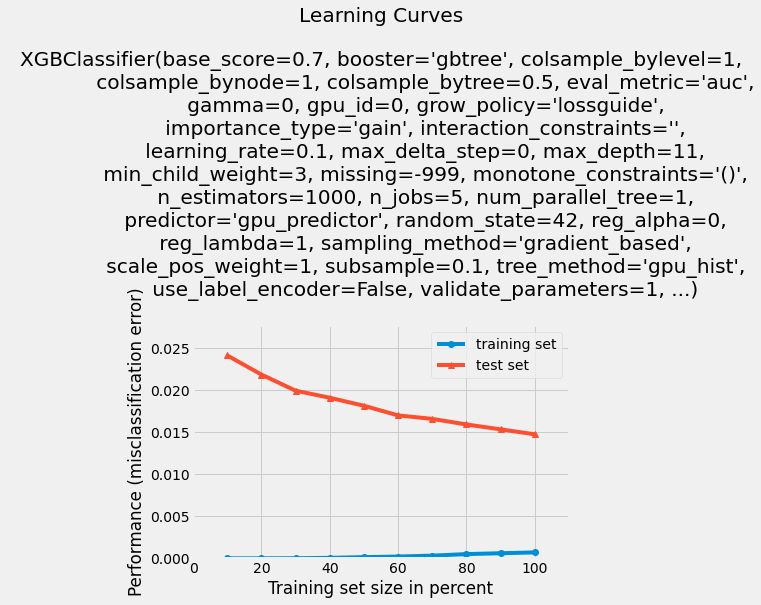

In [568]:
#plotting learning curve
plot_learning_curves(X_train_, y_train_, X_test_, y_test_, us_best_xgb_fit)

<AxesSubplot:title={'center':'Cumulative Gains Curve'}, xlabel='Percentage of sample', ylabel='Gain'>

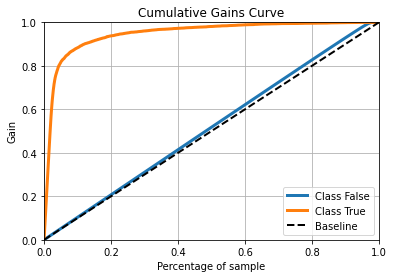

In [553]:
#calculating the cumulative gain
plot_cumulative_gain(y_test_, xgb_probas)

26.839143055922076


<AxesSubplot:title={'center':'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

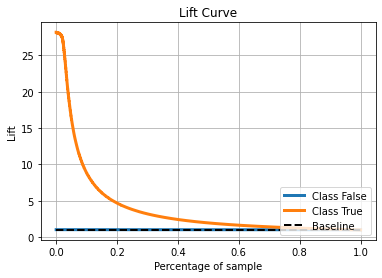

In [543]:
#calculating lift score
print(lift_score(y_test_.to_numpy().astype(int), us_best_xgb_test_predict))
plot_lift_curve(y_test_, xgb_probas)

<AxesSubplot:title={'center':'KS Statistic Plot'}, xlabel='Threshold', ylabel='Percentage below threshold'>

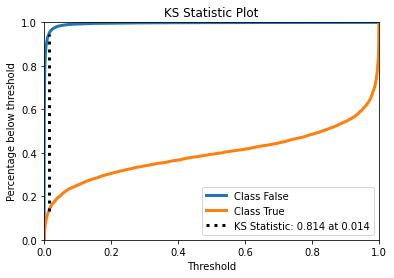

In [522]:
# plotting ks_statistics curve
plot_ks_statistic(y_test_, xgb_probas)

In [319]:
joblib.dump(us_best_xgb_fit, folder_path +"models/us_XGB_best_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/us_XGB_best_model.pkl']

### Un-Sampled LGBM

In [320]:
#Tuned best random Hyperparameters

# best lgbm model with gpu enabled parameters
us_best_lgbm = LGBMClassifier(boosting_type = 'gbdt' ,
                          class_weight = 'balanced' ,
                          colsample_bytree = 0.9,
                          importance_type = 'split' ,
                          learning_rate = 0.3,
                          max_depth = 11,
                          min_child_samples = 50,
                          min_child_weight = 0.001,
                          min_split_gain = 0.0,
                          n_estimators = 300,
                          n_jobs = 5,
                          num_leaves = 120,
                          objective = 'binary' ,
                          random_state = 42,
                          reg_alpha = 0.0,
                          reg_lambda = 0.0,
                          silent = True,
                          subsample = 1.0,
                          subsample_for_bin = 200000,
                          subsample_freq = 0,
                          device = 'gpu' ,
                          gpu_use_dp = True)

# fit andpredict best lgbm model
us_best_lgbm_fit= us_best_lgbm.fit(X_train_, y_train_)
us_best_lgbm_train_predict = us_best_lgbm_fit.predict(X_train_)
us_best_lgbm_test_predict = us_best_lgbm_fit.predict(X_test_)

#probability predict
lgbm_probas = us_best_lgbm_fit.predict_proba(X_test_)

<Figure size 360x360 with 0 Axes>

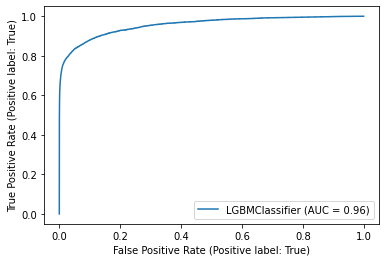

In [321]:
#plot roc_auc curve for unsampled lgbm model
plt.figure(figsize= (5,5))
plot_roc_curve(us_best_lgbm_fit, X_test_, y_test_) 
plt.show()

<Figure size 360x360 with 0 Axes>

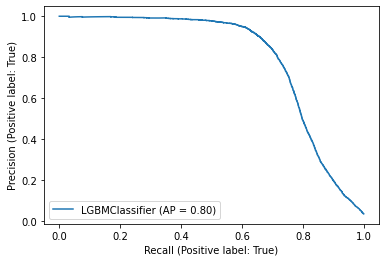

In [322]:
# plot precision_recall curve for unsampled lgbm model
plt.figure(figsize= (5,5))
plot_precision_recall_curve(us_best_lgbm_fit,X_test_, y_test_)
plt.show()

In [323]:
print('Train metrics for best LGBM Unsampled:\n')
print('ROC_AUC:', roc_auc_score(y_train_, us_best_lgbm_train_predict))
print('Accuracy score:',accuracy_score(y_train_, us_best_lgbm_train_predict))
print('Precision score:',precision_score(y_train_, us_best_lgbm_train_predict))
print('Recall score:', recall_score(y_train_, us_best_lgbm_train_predict))
print('F1 score:',f1_score(y_train_, us_best_lgbm_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train_, us_best_lgbm_train_predict))
print('Classification Report: \n', classification_report(y_train_, us_best_lgbm_train_predict))

Train metrics for best LGBM Unsampled:

ROC_AUC: 0.9993024097248795
Accuracy score: 0.9987835257398199
Precision score: 0.9661430119176598
Recall score: 0.9998598458304134
F1 score: 0.9827123080101935
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[397898    500]
 [     2  14268]]
Classification Report: 
               precision    recall  f1-score   support

       False       1.00      1.00      1.00    398398
        True       0.97      1.00      0.98     14270

    accuracy                           1.00    412668
   macro avg       0.98      1.00      0.99    412668
weighted avg       1.00      1.00      1.00    412668



In [324]:
print('Test metrics for best LGBM : \n')
print('ROC_AUC:', roc_auc_score(y_test_, us_best_lgbm_test_predict))
print('Accuracy score:',accuracy_score(y_test_, us_best_lgbm_test_predict))
print('Precision score:',precision_score(y_test_, us_best_lgbm_test_predict))
print('Recall score:', recall_score(y_test_, us_best_lgbm_test_predict))
print('F1 score:',f1_score(y_test_, us_best_lgbm_test_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_test_, us_best_lgbm_test_predict))
print('Classification Report: \n', classification_report(y_test_, us_best_lgbm_test_predict))

Test metrics for best LGBM : 

ROC_AUC: 0.8550079008783278
Accuracy score: 0.9837101872112813
Precision score: 0.8033577424540096
Recall score: 0.7164702134437719
F1 score: 0.7574303275237854
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[169480   1101]
 [  1780   4498]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.99      0.99      0.99    170581
        True       0.80      0.72      0.76      6278

    accuracy                           0.98    176859
   macro avg       0.90      0.86      0.87    176859
weighted avg       0.98      0.98      0.98    176859



In [561]:
# avg_expected_loss, avg_bias, avg_var 
avg_expected_loss_lgbm_us, avg_bias_lgbm_us, avg_var_lgbm_us = bias_variance_decomp(
                                        us_best_lgbm_fit, X_train_.values, y_train_.values,
                                        X_test_.values.astype(int), y_test_.values.astype(int), 
                                        loss='0-1_loss',
                                        random_seed=42)

print('Average expected loss: %.3f' % avg_expected_loss_lgbm_us)
print('Average bias: %.3f' % avg_bias_lgbm_us)
print('Average variance: %.3f' % avg_var_lgbm_us)

Average expected loss: 0.026
Average bias: 0.025
Average variance: 0.005


([0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  2.0193861066235866e-05,
  5.885061291182447e-05,
  0.0003301689616943423,
  0.0006300467688563036,
  0.0012164742601800964],
 [0.023351935722807433,
  0.021293799015034576,
  0.019297858746232875,
  0.018410145935462714,
  0.01751112468124325,
  0.01728495581225722,
  0.0163350465625159,
  0.01654990698805263,
  0.016510327435980073,
  0.016289812788718695])

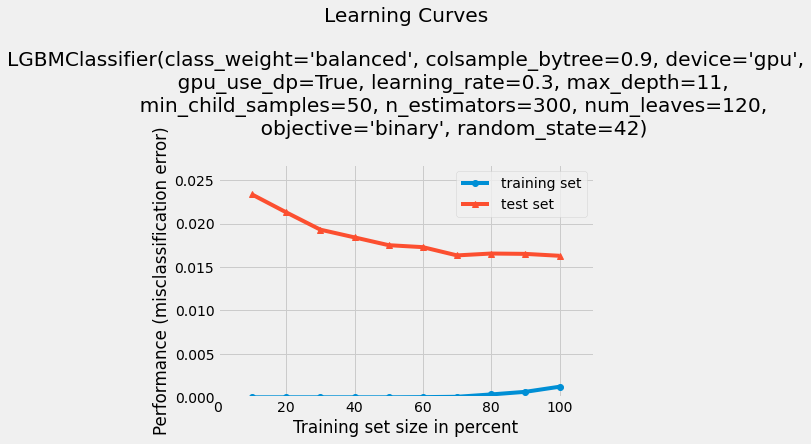

In [569]:
#plotting learning curve
plot_learning_curves(X_train_, y_train_, X_test_, y_test_, us_best_lgbm_fit)

<AxesSubplot:title={'center':'Cumulative Gains Curve'}, xlabel='Percentage of sample', ylabel='Gain'>

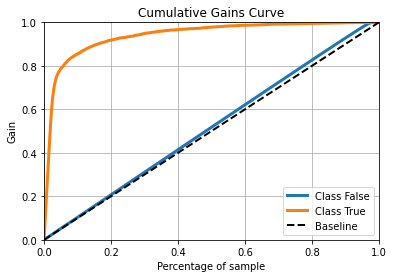

In [552]:
#calculating the cumulative gain
plot_cumulative_gain(y_test_, lgbm_probas)

22.631578045981797


<AxesSubplot:title={'center':'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

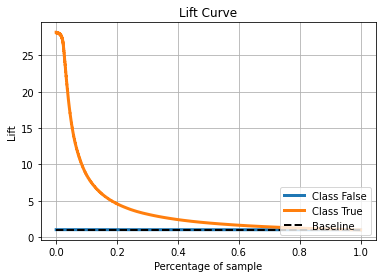

In [542]:
#calculating lift score
print(lift_score(y_test_.to_numpy().astype(int), us_best_lgbm_test_predict))
plot_lift_curve(y_test_, lgbm_probas)

<AxesSubplot:title={'center':'KS Statistic Plot'}, xlabel='Threshold', ylabel='Percentage below threshold'>

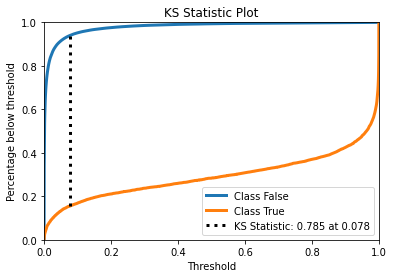

In [524]:
#plotting ks_statistics curve
plot_ks_statistic(y_test_, lgbm_probas)

In [325]:
joblib.dump(us_best_lgbm_fit, folder_path +"models/us_lgbm_best_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/us_lgbm_best_model.pkl']

Comparing Calibration Curve for above unsampled models:

<AxesSubplot:title={'center':'Calibration plots (Reliability Curves)'}, xlabel='Mean predicted value', ylabel='Fraction of positives'>

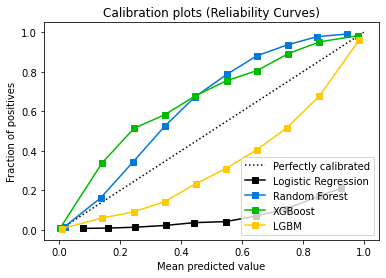

In [514]:
#list of predicted probability
probas_list = [lr_probas, rf_probas, xgb_probas, lgbm_probas]

#plotting curve for each classifier
clf_names = ['Logistic Regression','Random Forest','XGBoost', 'LGBM']
plot_calibration_curve(y_test_, probas_list, clf_names)

### Modelling with Over-Sampled data

In [326]:
# Oversmapling with SMOTE:
print('before SMOTE:',Counter(y))
oversampler = SMOTE(sampling_strategy='minority')

X_2, y_2 = oversampler.fit_resample(X, y)
print('After SMOTE:',Counter(y_2))

before SMOTE: Counter({False: 568979, True: 20548})
After SMOTE: Counter({False: 568979, True: 568979})


### Train-test Split

In [327]:
#Training and Validation set on oversampled data
X_train, X_test, y_train, y_test = train_test_split(X_2, y_2,
                                                    test_size=0.30,
                                                    random_state=42)

In [328]:
# Saving train_test_split to csv:
X_train.to_csv(folder_path +'train-test-split/X_train_for_modeling_oversampled.csv', \
               index=False)
X_test.to_csv(folder_path +'train-test-split/X_test_for_modeling_oversampled.csv', \
              index=False)
y_train.to_csv(folder_path +'train-test-split/y_train_for_modeling_oversampled.csv', \
               index=False)
y_test.to_csv(folder_path + 'train-test-split/y_test_for_modeling_oversampled.csv', \
              index=False)

### Over-Sampled Logistic Regression

In [329]:
#Fitting the model

logistic = LogisticRegression(random_state=42, class_weight = 'balanced', n_jobs= 5)
logistic_fit =logistic.fit(X_train,y_train)

# Predictiing train and test data

logistic_train_predict = logistic_fit.predict(X_train)
logistic_test_predict = logistic_fit.predict(X_test)

# probability predict
os_lr_probas = logistic_fit.predict_proba(X_test)

In [330]:
print('Parameters currently in use:\n')
print(logistic_fit.get_params())

Parameters currently in use:

{'C': 1.0, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 42, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


<Figure size 360x360 with 0 Axes>

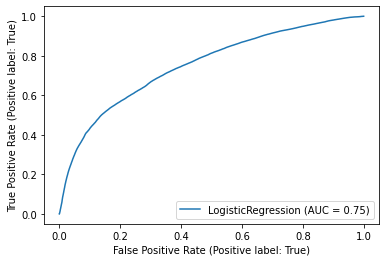

In [331]:
#plot roc_auc curve for base logistic model
plt.figure(figsize= (5,5))
plot_roc_curve(logistic_fit, X_test, y_test)
plt.show()

<Figure size 360x360 with 0 Axes>

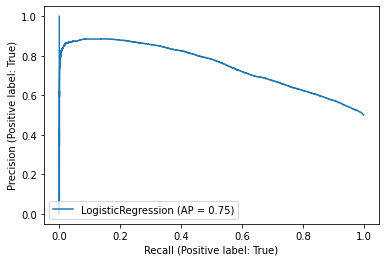

In [332]:
# plot precision_recall curve for logistic model
plt.figure(figsize= (5,5))
plot_precision_recall_curve(logistic_fit, X_test, y_test) 
plt.show()

In [333]:
print('Train metrics for Logistic Regression :\n')
print('ROC_AUC:', roc_auc_score(y_train, logistic_train_predict))
print('Accuracy score:',accuracy_score(y_train,logistic_train_predict))
print('Precision score:',precision_score(y_train, logistic_train_predict))
print('Recall score:', recall_score(y_train, logistic_train_predict))
print('F1 score:',f1_score(y_train, logistic_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train, logistic_train_predict))
print('Classification Report: \n', classification_report(y_train, logistic_train_predict))

Train metrics for Logistic Regression :

ROC_AUC: 0.6846572866876595
Accuracy score: 0.6846554602859761
Precision score: 0.7257109713770151
Recall score: 0.5937287373867982
F1 score: 0.6531188289718981
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[308898  89379]
 [161815 236478]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.66      0.78      0.71    398277
        True       0.73      0.59      0.65    398293

    accuracy                           0.68    796570
   macro avg       0.69      0.68      0.68    796570
weighted avg       0.69      0.68      0.68    796570



In [334]:
print('Test metrics for Logistic Regression : \n')
print('ROC_AUC:', roc_auc_score(y_test, logistic_test_predict))
print('Accuracy score:',accuracy_score(y_test, logistic_test_predict))
print('Precision score:',precision_score(y_test,  logistic_test_predict))
print('Recall score:', recall_score(y_test,  logistic_test_predict))
print('F1 score:',f1_score(y_test, logistic_test_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_test, logistic_test_predict))
print('Classification Report: \n', classification_report(y_test, logistic_test_predict))

Test metrics for Logistic Regression : 

ROC_AUC: 0.6838451718533695
Accuracy score: 0.6838494616096641
Precision score: 0.7250222311465535
Recall score: 0.5923157142354968
F1 score: 0.6519846515977172
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[132358  38344]
 [ 69586 101100]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.66      0.78      0.71    170702
        True       0.73      0.59      0.65    170686

    accuracy                           0.68    341388
   macro avg       0.69      0.68      0.68    341388
weighted avg       0.69      0.68      0.68    341388



In [ ]:
# avg_expected_loss, avg_bias, avg_var 
avg_expected_loss_lg_os, avg_bias_lg_os, avg_var_lg_os = bias_variance_decomp(
                                        logistic_fit, X_train.values, y_train.values,
                                        X_test.values.astype(int), y_test.values.astype(int), 
                                        loss='0-1_loss',
                                        random_seed=42)

print('Average expected loss: %.3f' % avg_expected_loss_lg_os)
print('Average bias: %.3f' % avg_bias_lg_os)
print('Average variance: %.3f' % avg_var_lg_os)

([0.3113976172841056,
  0.31260906135054045,
  0.3182771131225128,
  0.3157067175515021,
  0.31856082955672443,
  0.31632917801741633,
  0.31779110077313627,
  0.31863803557753867,
  0.3183259335512119,
  0.3153445397140239],
 [0.31082229018008833,
  0.31201741127397564,
  0.31971246792505886,
  0.31647275241074674,
  0.3195777238801598,
  0.3166719392597279,
  0.3181160439148418,
  0.3193404571924028,
  0.3190153139536246,
  0.3161505383903359])

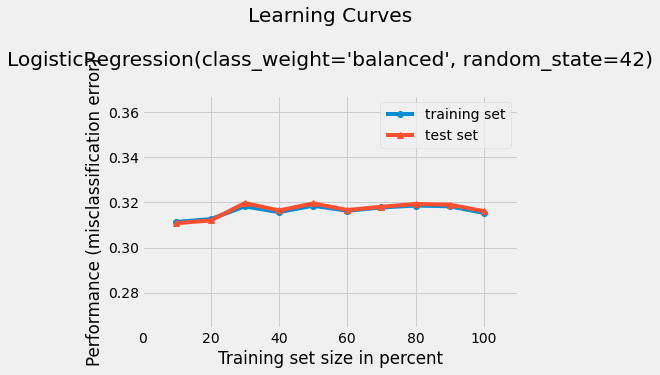

In [570]:
#plotting learning curve
plot_learning_curves(X_train, y_train, X_test, y_test, logistic_fit)

<AxesSubplot:title={'center':'Cumulative Gains Curve'}, xlabel='Percentage of sample', ylabel='Gain'>

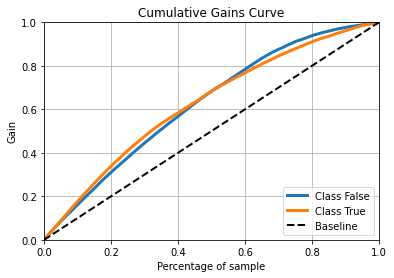

In [551]:
#calculating the cumulative gain
plot_cumulative_gain(y_test, os_lr_probas)

1.450112425428328


<AxesSubplot:title={'center':'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

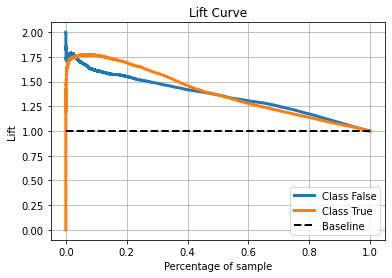

In [540]:
#calculate lift score
print(lift_score(y_test.to_numpy().astype(int), logistic_test_predict))
plot_lift_curve(y_test, os_lr_probas)

<AxesSubplot:title={'center':'KS Statistic Plot'}, xlabel='Threshold', ylabel='Percentage below threshold'>

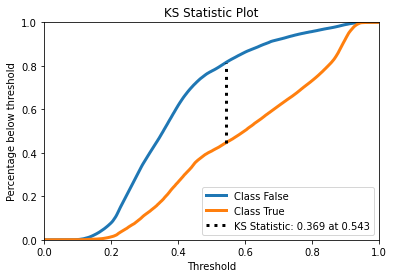

In [526]:
#plotting ks_statistics curve
plot_ks_statistic(y_test, os_lr_probas)

In [335]:
joblib.dump(logistic_fit, folder_path +"models/logistic_base_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/logistic_base_model.pkl']

Due to poor performance we will proceed with other models.

### Over-Sampled Random Forest

In [434]:
#Fitting the model

base_rfc = RandomForestClassifier(bootstrap=True, max_features='auto',
                                   random_state=42, n_jobs= 5)
base_rfc_fit= base_rfc.fit(X_train, y_train)

# Predictiing train and test data

base_rfc_train_predict = base_rfc_fit.predict(X_train)
base_rfc_test_predict = base_rfc_fit.predict(X_test)

In [435]:
print('Parameters currently in use:\n')
print(base_rfc_fit.get_params())

Parameters currently in use:

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': 5, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}


<Figure size 360x360 with 0 Axes>

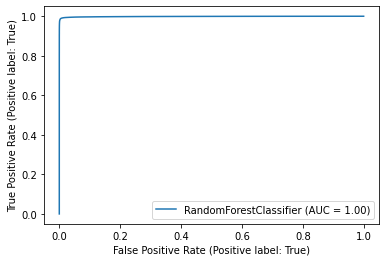

In [338]:
#plot roc_auc curve for base rfc model
plt.figure(figsize= (5,5))
plot_roc_curve(base_rfc_fit, X_test, y_test) 
plt.show()

<Figure size 360x360 with 0 Axes>

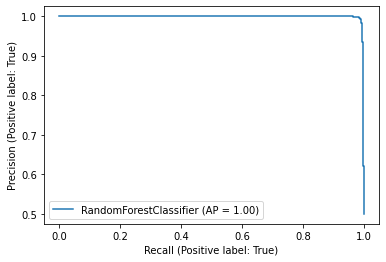

In [339]:
# plot precision_recall curve for base rfc model
plt.figure(figsize= (5,5))
plot_precision_recall_curve(base_rfc_fit,X_test, y_test)
plt.show()

In [340]:
print('Train metrics for Random Forest:\n')
print('ROC_AUC:', roc_auc_score(y_train, base_rfc_train_predict))
print('Accuracy score:',accuracy_score(y_train,base_rfc_train_predict))
print('Precision score:',precision_score(y_train, base_rfc_train_predict))
print('Recall score:', recall_score(y_train, base_rfc_train_predict))
print('F1 score:',f1_score(y_train, base_rfc_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train, base_rfc_train_predict))
print('Classification Report: \n', classification_report(y_train, base_rfc_train_predict))

Train metrics for Random Forest:

ROC_AUC: 0.999997489285526
Accuracy score: 0.9999974892350955
Precision score: 1.0
Recall score: 0.999994978571052
F1 score: 0.9999974892792223
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[398277      0]
 [     2 398291]]
Classification Report: 
               precision    recall  f1-score   support

       False       1.00      1.00      1.00    398277
        True       1.00      1.00      1.00    398293

    accuracy                           1.00    796570
   macro avg       1.00      1.00      1.00    796570
weighted avg       1.00      1.00      1.00    796570



In [341]:
print('Test metrics for Random Forest : \n')
print('ROC_AUC:', roc_auc_score(y_test, base_rfc_test_predict))
print('Accuracy score:',accuracy_score(y_test, base_rfc_test_predict))
print('Precision score:',precision_score(y_test,  base_rfc_test_predict))
print('Recall score:', recall_score(y_test,  base_rfc_test_predict))
print('F1 score:',f1_score(y_test, base_rfc_test_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_test, base_rfc_test_predict))
print('Classification Report: \n', classification_report(y_test, base_rfc_test_predict))

Test metrics for Random Forest : 

ROC_AUC: 0.9916720203323256
Accuracy score: 0.9916722321815646
Precision score: 0.9961570978402889
Recall score: 0.9871518460799362
F1 score: 0.9916340277021678
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[170052    650]
 [  2193 168493]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.99      1.00      0.99    170702
        True       1.00      0.99      0.99    170686

    accuracy                           0.99    341388
   macro avg       0.99      0.99      0.99    341388
weighted avg       0.99      0.99      0.99    341388



([0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  1.7934035032344032e-06,
  1.5692280653301027e-06,
  2.7897387828090715e-06,
  2.5107649045281643e-06],
 [0.03396721618803238,
  0.022833257173655783,
  0.01780378923688003,
  0.01476911900828383,
  0.012891490034799113,
  0.011300924461316742,
  0.010454380353146567,
  0.00964005764701747,
  0.009092293812319121,
  0.008327767818435328])

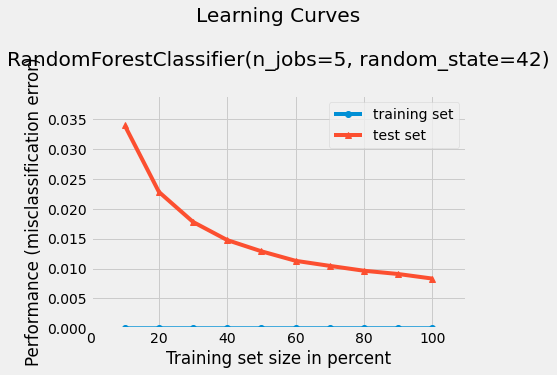

In [571]:
#plotting learning curve
plot_learning_curves(X_train, y_train, X_test, y_test, base_rfc_fit)

In [436]:
joblib.dump(base_rfc_fit, folder_path +"models/rfc_base_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/rfc_base_model.pkl']

Random Froest model is  purely overfitting.Let us proceed with Hyperparameter tuning the model to generalize the predictions

### Over-Sampled Random Forest Hyperparameter Tuning(Dev Only)[DONT RUN]

In [437]:
#random grid for random forest clasiifier
random_grid_rfc ={'n_estimators': [100,200,300,400,500,600],
                  'criterion': ['gini','entropy'],
                  'max_depth': [20,30,40,50,60],               
                  'min_samples_split': [50,60,70,80,90,100],
                  'min_samples_leaf': [10,20,30],
                  'max_features': ['auto','log2'],
                  'max_leaf_nodes': [50,100,150,200],
                  'ccp_alpha': [0,0.1,0.01],
                  'bootstrap': [True]
              }

In [438]:
# Using random grid to search for best hyperparameters

# Random search of parameters with auc_roc scoring, using 5 fold stratified cross validation,
skf_rfc = StratifiedKFold(n_splits=5, random_state=42, shuffle =True)

# Cross vaidaation scores for each folds
fold_scores = cross_val_score(base_rfc, X, y, cv = skf_rfc)
   
print('Outcomes by CV folds:')
for i, x in enumerate(fold_scores):
    print('Fold ', (i+1, x))
print("\n")
print('Mean performance metric = ', np.mean(fold_scores))
print('STD of the metric       = ', np.std(fold_scores))

# search across 50 different combinations, and use all available cores
rfc_random = RandomizedSearchCV(estimator = base_rfc,
                                param_distributions = random_grid_rfc, 
                                n_iter =10, cv = skf_rfc, 
                                scoring = 'roc_auc', return_train_score=True,
                                verbose=100, n_jobs = 5, random_state=42)

# Fit the random search model
rfc_model_fit =rfc_random.fit(X_train, y_train)

Outcomes by CV folds:
Fold  (1, 0.9809678896748257)
Fold  (2, 0.9809254830118909)
Fold  (3, 0.9814681311225139)
Fold  (4, 0.9811119121326491)
Fold  (5, 0.9806369534794962)


Mean performance metric =  0.9810220738842752
STD of the metric       =  0.00027115361772057055
Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [439]:
# predict using random grid rfc model
best_random_rfc_train_predict = rfc_model_fit.predict(X_train)
best_random_rfc_test_predict = rfc_model_fit.predict(X_test)


<Figure size 360x360 with 0 Axes>

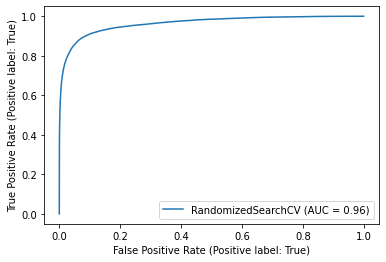

In [385]:
# plot roc_auc curve for random grid rfc model
plt.figure(figsize= (5,5))
plot_roc_curve(rfc_model_fit, X_test, y_test) 
plt.show()

<Figure size 360x360 with 0 Axes>

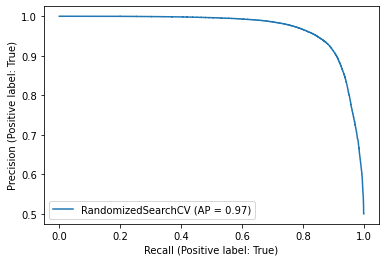

In [386]:
# plot precision_recall curve for random grid rfc model
plt.figure(figsize= (5,5))
plot_precision_recall_curve(rfc_model_fit,X_test, y_test)
plt.show()

In [440]:
print('Tuned best random Hyperparameters:\n')
print(rfc_model_fit.best_estimator_.get_params())

Tuned best random Hyperparameters:

{'bootstrap': True, 'ccp_alpha': 0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 40, 'max_features': 'auto', 'max_leaf_nodes': 150, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 10, 'min_samples_split': 50, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 200, 'n_jobs': 5, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}


In [441]:
print('Train metrics for Random Grid RFC  :\n')
print('ROC_AUC:', roc_auc_score(y_train, best_random_rfc_train_predict))
print('Accuracy score:',accuracy_score(y_train, best_random_rfc_train_predict))
print('Precision score:',precision_score(y_train,  best_random_rfc_train_predict))
print('Recall score:', recall_score(y_train,  best_random_rfc_train_predict))
print('F1 score:',f1_score(y_train, best_random_rfc_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train, best_random_rfc_train_predict))
print('Classification Report: \n', classification_report(y_train, best_random_rfc_train_predict))

Train metrics for Random Grid RFC  :

ROC_AUC: 0.9089624620940566
Accuracy score: 0.9089621753267133
Precision score: 0.9209860461750392
Recall score: 0.8946855706728464
F1 score: 0.9076453238106396
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[367705  30572]
 [ 41946 356347]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.90      0.92      0.91    398277
        True       0.92      0.89      0.91    398293

    accuracy                           0.91    796570
   macro avg       0.91      0.91      0.91    796570
weighted avg       0.91      0.91      0.91    796570



In [442]:
print('Test metrics for Random Grid RFC : \n')
print('ROC_AUC:', roc_auc_score(y_test, best_random_rfc_test_predict))
print('Accuracy score:',accuracy_score(y_test, best_random_rfc_test_predict))
print('Precision score:',precision_score(y_test,  best_random_rfc_test_predict))
print('Recall score:', recall_score(y_test,  best_random_rfc_test_predict))
print('F1 score:',f1_score(y_test, best_random_rfc_test_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_test, best_random_rfc_test_predict))
print('Classification Report: \n', classification_report(y_test, best_random_rfc_test_predict))

Test metrics for Random Grid RFC : 

ROC_AUC: 0.9076527910468751
Accuracy score: 0.9076534617502665
Precision score: 0.919657181457401
Recall score: 0.8933421604583855
F1 score: 0.9063086945151091
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[157381  13321]
 [ 18205 152481]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.90      0.92      0.91    170702
        True       0.92      0.89      0.91    170686

    accuracy                           0.91    341388
   macro avg       0.91      0.91      0.91    341388
weighted avg       0.91      0.91      0.91    341388



In [443]:
joblib.dump(rfc_model_fit, folder_path +"models/rfc_final_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/rfc_final_model.pkl']

### Over-Sampled Fine Tuned RFC Model

In [343]:
#Fitting the model

best_rfc = RandomForestClassifier( bootstrap = True,
                                      ccp_alpha = 0,
                                      class_weight = None,
                                      criterion =  'entropy' ,
                                      max_depth = 40,
                                      max_features =  'auto' ,
                                      max_leaf_nodes = 150,
                                      max_samples = None,
                                      min_impurity_decrease = 0.0,
                                      min_impurity_split = None,
                                      min_samples_leaf = 10,
                                      min_samples_split = 50,
                                      min_weight_fraction_leaf = 0.0,
                                      n_estimators = 200,
                                      n_jobs = 5,
                                      oob_score = False,
                                      random_state = 42,
                                      verbose = 0,
                                      warm_start = False)
best_rfc_fit= best_rfc.fit(X_train, y_train)

# Predictiing train and test data

best_rfc_train_predict = best_rfc_fit.predict(X_train)
best_rfc_test_predict = best_rfc_fit.predict(X_test)

# probability predict
os_rf_probas = best_rfc_fit.predict_proba(X_test)

<Figure size 360x360 with 0 Axes>

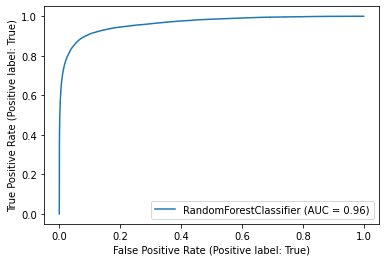

In [344]:
#plot roc_auc curve for best rfc model
plt.figure(figsize= (5,5))
plot_roc_curve(best_rfc_fit, X_test, y_test) 
plt.show()

<Figure size 360x360 with 0 Axes>

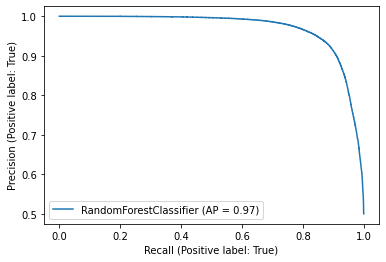

In [345]:
# plot precision_recall curve for best rfc model
plt.figure(figsize= (5,5))
plot_precision_recall_curve(best_rfc_fit,X_test, y_test)
plt.show()

In [346]:
print('Train metrics for best Random Forest:\n')
print('ROC_AUC:', roc_auc_score(y_train, best_rfc_train_predict))
print('Accuracy score:',accuracy_score(y_train,best_rfc_train_predict))
print('Precision score:',precision_score(y_train, best_rfc_train_predict))
print('Recall score:', recall_score(y_train, best_rfc_train_predict))
print('F1 score:',f1_score(y_train, best_rfc_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train, best_rfc_train_predict))
print('Classification Report: \n', classification_report(y_train, best_rfc_train_predict))

Train metrics for best Random Forest:

ROC_AUC: 0.9089624620940566
Accuracy score: 0.9089621753267133
Precision score: 0.9209860461750392
Recall score: 0.8946855706728464
F1 score: 0.9076453238106396
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[367705  30572]
 [ 41946 356347]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.90      0.92      0.91    398277
        True       0.92      0.89      0.91    398293

    accuracy                           0.91    796570
   macro avg       0.91      0.91      0.91    796570
weighted avg       0.91      0.91      0.91    796570



In [347]:
print('Test metrics for best Random Forest : \n')
print('ROC_AUC:', roc_auc_score(y_test, best_rfc_test_predict))
print('Accuracy score:',accuracy_score(y_test, best_rfc_test_predict))
print('Precision score:',precision_score(y_test,  best_rfc_test_predict))
print('Recall score:', recall_score(y_test,  best_rfc_test_predict))
print('F1 score:',f1_score(y_test, best_rfc_test_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_test, best_rfc_test_predict))
print('Classification Report: \n', classification_report(y_test, best_rfc_test_predict))

Test metrics for best Random Forest : 

ROC_AUC: 0.9076527910468751
Accuracy score: 0.9076534617502665
Precision score: 0.919657181457401
Recall score: 0.8933421604583855
F1 score: 0.9063086945151091
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[157381  13321]
 [ 18205 152481]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.90      0.92      0.91    170702
        True       0.92      0.89      0.91    170686

    accuracy                           0.91    341388
   macro avg       0.91      0.91      0.91    341388
weighted avg       0.91      0.91      0.91    341388



In [348]:
# Unseen test data prediction(RFC Fine Tuned Model)
test_preds_rfc = best_rfc_fit.predict(test)
test_preds_rfc

array([False, False, False, ..., False, False, False])

([0.08768846429064614,
  0.09050052098371769,
  0.09140439634934783,
  0.09096187403492474,
  0.09115331985889501,
  0.0913353503144733,
  0.09109951775379797,
  0.09071707445673324,
  0.09092316640931326,
  0.09103782467328672],
 [0.09295581567014657,
  0.09360903136607028,
  0.09331025109259845,
  0.09250764525993883,
  0.09237290121503978,
  0.09244320245585667,
  0.0924314855823872,
  0.0919188723680973,
  0.09203311188442476,
  0.09234653824973345])

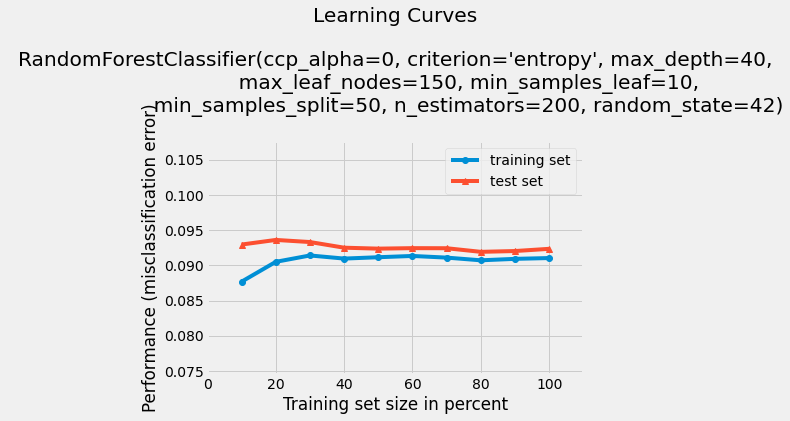

In [572]:
#plotting learning curve
plot_learning_curves(X_train, y_train, X_test, y_test, best_rfc_fit)

<AxesSubplot:title={'center':'Cumulative Gains Curve'}, xlabel='Percentage of sample', ylabel='Gain'>

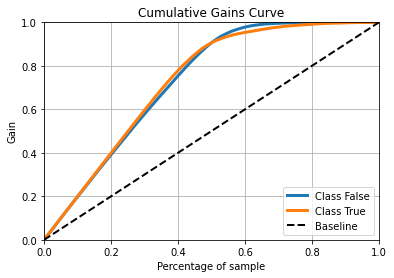

In [549]:
#calculating the cumulative gain
plot_cumulative_gain(y_test, os_rf_probas)

1.8394005710098027


<AxesSubplot:title={'center':'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

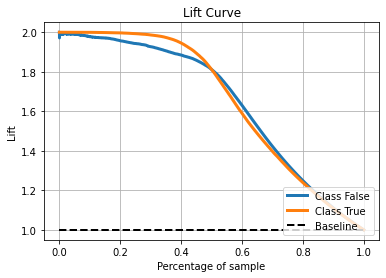

In [550]:
#calculating lift score
print(lift_score(y_test.to_numpy().astype(int), best_rfc_test_predict))
plot_lift_curve(y_test, os_rf_probas)

<AxesSubplot:title={'center':'KS Statistic Plot'}, xlabel='Threshold', ylabel='Percentage below threshold'>

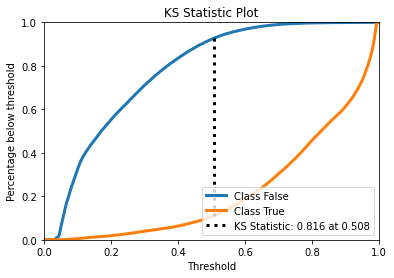

In [529]:
#plotting ks_statistics curve
plot_ks_statistic(y_test, os_rf_probas)


In [349]:
# Final best rfc model prediction Submission:

sample_submission['isFraud'] = test_preds_rfc
sample_submission.to_csv(folder_path +'best_final_rfc_model_prediction.csv',index=False)

In [350]:
joblib.dump(best_rfc_fit, folder_path +"models/best_rfc_final_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/best_rfc_final_model.pkl']


I will be buliding benchmark models with **XGBoost** and **LightGBM** as it has an added advantage of ***GPU*** usability for ***x6 faster*** results thereby solving our problem of **misclassification** by maximizing the Precision/ Recall rate and **time complexity** by reducing computational cost.


### Over-Sampled XGBoost 


Main metric taken for evaluation is 'ROC_AUC' score to monitor the models performance and stability.Further we will be focusing on reducing the FP and FN as higher FP rate will lead to loss on companies revenue and higher FN rate makes the customers unhappy for making wrong acquisitions thereby affecting the customer churn rate.

In [351]:
# Base xgb model with gpu enabled parameters
base_xgb = XGBClassifier(tree_method = 'gpu_hist', booster='gbtree', 
                         predictor= "gpu_predictor", random_state=42,
                         n_jobs = 5,
                         sampling_method='gradient_based',
                         grow_policy ='lossguide',eval_metric='auc',
                         missing=-999, use_label_encoder=False)

# fit and predict base xgb model
base_xgb_fit= base_xgb.fit(X_train,y_train)
base_xgb_train_predict = base_xgb.predict(X_train)
base_xgb_test_predict = base_xgb.predict(X_test)

In [352]:
print('Parameters currently in use:\n')
print(base_xgb_fit.get_params())

Parameters currently in use:

{'objective': 'binary:logistic', 'use_label_encoder': False, 'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'gpu_id': 0, 'importance_type': 'gain', 'interaction_constraints': '', 'learning_rate': 0.300000012, 'max_delta_step': 0, 'max_depth': 6, 'min_child_weight': 1, 'missing': -999, 'monotone_constraints': '()', 'n_estimators': 100, 'n_jobs': 4, 'num_parallel_tree': 1, 'random_state': 42, 'reg_alpha': 0, 'reg_lambda': 1, 'scale_pos_weight': 1, 'subsample': 1, 'tree_method': 'gpu_hist', 'validate_parameters': 1, 'verbosity': None, 'predictor': 'gpu_predictor', 'sampling_method': 'gradient_based', 'grow_policy': 'lossguide', 'eval_metric': 'auc'}


<Figure size 360x360 with 0 Axes>

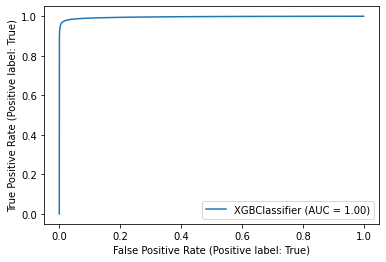

In [353]:
#plot roc_auc curve for base xgb model
plt.figure(figsize= (5,5))
plot_roc_curve(base_xgb_fit, X_test, y_test) 
plt.show()

<Figure size 360x360 with 0 Axes>

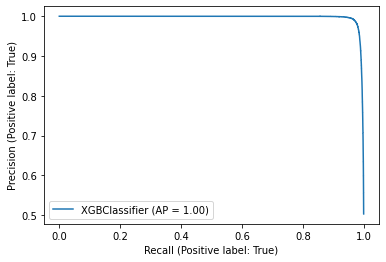

In [354]:
#plot precision_recall curve for base xgb model
plt.figure(figsize= (5,5))
plot_precision_recall_curve(base_xgb_fit, X_test, y_test) 
plt.show()

In [358]:
print('Train metrics for Base XGB :\n')
print('ROC_AUC:', roc_auc_score(y_train, base_xgb_train_predict))
print('Accuracy score:',accuracy_score(y_train, base_xgb_train_predict))
print('Precision score:',precision_score(y_train,  base_xgb_train_predict))
print('Recall score:', recall_score(y_train,  base_xgb_train_predict))
print('F1 score:',f1_score(y_train, base_xgb_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train, base_xgb_train_predict))
print('Classification Report: \n', classification_report(y_train, base_xgb_train_predict))

Train metrics for Base XGB :

ROC_AUC: 0.9810514919157587
Accuracy score: 0.9810512572655259
Precision score: 0.9925601626789584
Recall score: 0.9693692834169819
F1 score: 0.9808276597906718
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[395383   2894]
 [ 12200 386093]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.97      0.99      0.98    398277
        True       0.99      0.97      0.98    398293

    accuracy                           0.98    796570
   macro avg       0.98      0.98      0.98    796570
weighted avg       0.98      0.98      0.98    796570



In [359]:
print('Test metrics for Base XGB : \n')
print('ROC_AUC:', roc_auc_score(y_test, base_xgb_test_predict))
print('Accuracy score:',accuracy_score(y_test, base_xgb_test_predict))
print('Precision score:',precision_score(y_test,  base_xgb_test_predict))
print('Recall score:', recall_score(y_test,  base_xgb_test_predict))
print('F1 score:',f1_score(y_test, base_xgb_test_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_test, base_xgb_test_predict))
print('Classification Report: \n', classification_report(y_test, base_xgb_test_predict))

Test metrics for Base XGB : 

ROC_AUC: 0.9795388411612723
Accuracy score: 0.9795394097039146
Precision score: 0.9914617670899757
Recall score: 0.967407988938753
F1 score: 0.9792871948308429
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[169280   1422]
 [  5563 165123]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.97      0.99      0.98    170702
        True       0.99      0.97      0.98    170686

    accuracy                           0.98    341388
   macro avg       0.98      0.98      0.98    341388
weighted avg       0.98      0.98      0.98    341388



([0.014474559674604868,
  0.016263479669081187,
  0.018809813743090167,
  0.018680090889689544,
  0.019669332262073642,
  0.018533629603592068,
  0.01932571615085393,
  0.01829406078561834,
  0.01876796766134803,
  0.01894874273447406],
 [0.02458492975734355,
  0.021846110583851806,
  0.0226604332899809,
  0.02158833936752317,
  0.022153678512425744,
  0.02055432528384126,
  0.02055432528384126,
  0.020018278322612396,
  0.02027019110220629,
  0.020460590296085393])

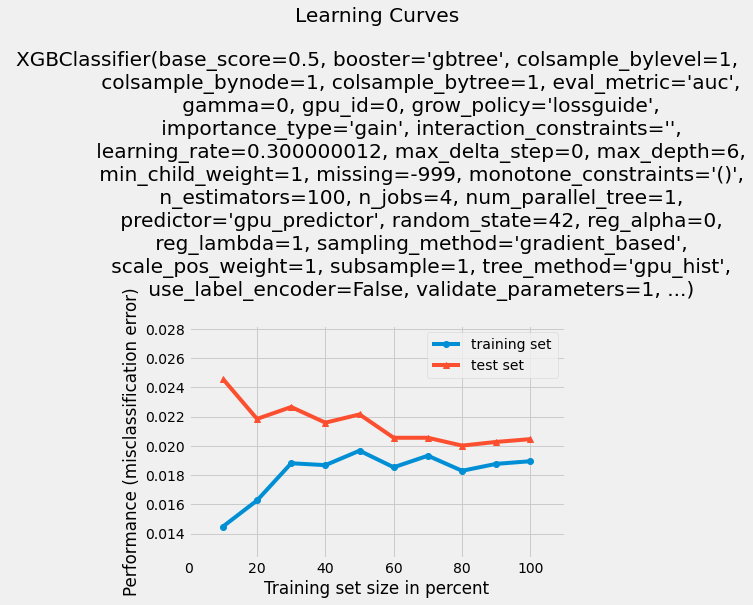

In [573]:
#plotting learning curve
plot_learning_curves(X_train, y_train, X_test, y_test, base_xgb)

In [360]:
joblib.dump(base_xgb_fit, folder_path +"models/xgb_base_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/xgb_base_model.pkl']

### Over-Sampled XGBoost Hyperparameter Tuning(Dev Only)[DONT RUN]


In [408]:
# Random grid for xgboost
random_grid_xgb = [{'n_estimators' : [100, 200, 1000],
                'max_depth'        : [9, 11, 13],
                'learning_rate'    : [0.01, 0.05, 0.1, 0.3],
                'min_child_weight' : [1, 3, 5],
                'gamma'            : [0, 0.1,0.3, 0.5],
                'colsample_bytree' : [0.3, 0.5, 0.7, 0.9], 
                'subsample'        : [0.1, 0.3, 0.5]
                       
              }]

         
print(random_grid_xgb)

[{'n_estimators': [100, 200, 1000], 'max_depth': [9, 11, 13], 'learning_rate': [0.01, 0.05, 0.1, 0.3], 'min_child_weight': [1, 3, 5], 'gamma': [0, 0.1, 0.3, 0.5], 'colsample_bytree': [0.3, 0.5, 0.7, 0.9], 'subsample': [0.1, 0.3, 0.5]}]


In [409]:
# Using random grid to search for best hyperparameters

# Random search of parameters with auc_roc scoring, using 5 fold stratified cross validation,
skf_xgb = StratifiedKFold(n_splits=5, random_state=42, shuffle =True)

# Cross validation scores for each folds
fold_scores = cross_val_score(base_xgb, X, y, cv = skf_xgb)
   
print('Outcomes by CV folds:')
for i, x in enumerate(fold_scores):
    print('Fold ', (i+1, x))
print("\n")
print('Mean performance metric = ', np.mean(fold_scores))
print('STD of the metric       = ', np.std(fold_scores))

# search across 50 different combinations, and use all available cores
xgb_random = RandomizedSearchCV(estimator = base_xgb,
                                param_distributions = random_grid_xgb, 
                                n_iter =10, cv = skf_xgb, 
                                scoring = 'roc_auc', return_train_score=True,
                                verbose=100, n_jobs = 5, random_state=42)

# Fit the random search model
xgb_model_fit =xgb_random.fit(X_train, y_train)

Outcomes by CV folds:
Fold  (1, 0.9806880056994555)
Fold  (2, 0.9808067443556732)
Fold  (3, 0.9803231415122344)
Fold  (4, 0.9806708790975786)
Fold  (5, 0.9801280692082609)


Mean performance metric =  0.9805233679746406
SDT of the metric       =  0.0002551544771697129
Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [410]:
# predict using random grid xgb model
best_random_xgb_train_predict = xgb_model_fit.predict(X_train)
best_random_xgb_test_predict = xgb_model_fit.predict(X_test)


In [411]:
print('Tuned best random Hyperparameters:\n')
print(xgb_model_fit.best_estimator_.get_params())

Tuned best random Hyperparameters:

{'objective': 'binary:logistic', 'use_label_encoder': False, 'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 0.3, 'gamma': 0.1, 'gpu_id': 0, 'importance_type': 'gain', 'interaction_constraints': '', 'learning_rate': 0.05, 'max_delta_step': 0, 'max_depth': 13, 'min_child_weight': 1, 'missing': -999, 'monotone_constraints': '()', 'n_estimators': 1000, 'n_jobs': 4, 'num_parallel_tree': 1, 'random_state': 42, 'reg_alpha': 0, 'reg_lambda': 1, 'scale_pos_weight': 1, 'subsample': 0.3, 'tree_method': 'gpu_hist', 'validate_parameters': 1, 'verbosity': None, 'predictor': 'gpu_predictor', 'sampling_method': 'gradient_based', 'grow_policy': 'lossguide', 'eval_metric': 'auc'}


<Figure size 360x360 with 0 Axes>

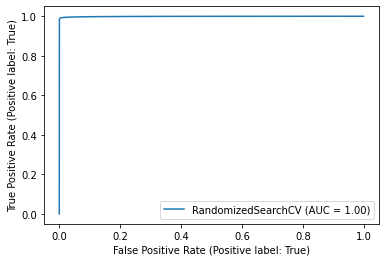

In [412]:
# plot roc_auc curve for random grid xgb model
plt.figure(figsize=(5,5))
plot_roc_curve(xgb_model_fit, X_test, y_test) 
plt.show()

<Figure size 360x360 with 0 Axes>

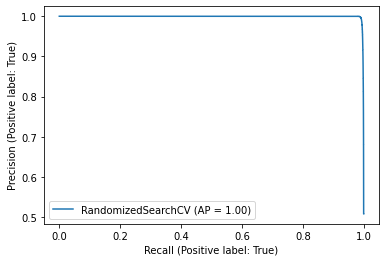

In [413]:
# plot roc_auc curve for random grid xgb model
plt.figure(figsize=(5,5))
plot_precision_recall_curve(xgb_model_fit, X_test, y_test) 
plt.show()

In [414]:
print('Train metrics for Random Grid XGB :\n')
print('ROC_AUC:', roc_auc_score(y_train, best_random_xgb_train_predict))
print('Accuracy score:',accuracy_score(y_train,best_random_xgb_train_predict))
print('Precision score:',precision_score(y_train, best_random_xgb_train_predict))
print('Recall score:', recall_score(y_train, best_random_xgb_train_predict))
print('F1 score:',f1_score(y_train,best_random_xgb_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train,best_random_xgb_train_predict))
print('Classification Report: \n', classification_report(y_train, best_random_xgb_train_predict))

Train metrics for Random Grid XGB :

ROC_AUC: 0.9995078998622293
Accuracy score: 0.9995078900787124
Precision score: 0.9999949736746209
Recall score: 0.999020821355133
F1 score: 0.9995076601548861
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[398275      2]
 [   390 397903]]
Classification Report: 
               precision    recall  f1-score   support

       False       1.00      1.00      1.00    398277
        True       1.00      1.00      1.00    398293

    accuracy                           1.00    796570
   macro avg       1.00      1.00      1.00    796570
weighted avg       1.00      1.00      1.00    796570



In [415]:
print('Test metrics for Rabdom Grid XGB : \n')
print('ROC_AUC:', roc_auc_score(y_test, best_random_xgb_test_predict))
print('Accuracy score:',accuracy_score(y_test,best_random_xgb_test_predict))
print('Precision score:',precision_score(y_test, best_random_xgb_test_predict))
print('Recall score:', recall_score(y_test, best_random_xgb_test_predict))
print('F1 score:',f1_score(y_test,best_random_xgb_test_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_test,best_random_xgb_test_predict))
print('Classification Report: \n', classification_report(y_test, best_random_xgb_test_predict))

Test metrics for Rabdom Grid XGB : 

ROC_AUC: 0.9933357691425643
Accuracy score: 0.9933360282142313
Precision score: 0.9988507040918488
Recall score: 0.9878080217475365
F1 score: 0.9932986729899701
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[170508    194]
 [  2081 168605]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.99      1.00      0.99    170702
        True       1.00      0.99      0.99    170686

    accuracy                           0.99    341388
   macro avg       0.99      0.99      0.99    341388
weighted avg       0.99      0.99      0.99    341388



In [416]:
#Saving trained model to pickle file:

joblib.dump(xgb_model_fit, folder_path +"models/xgb_final_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/xgb_final_model.pkl']

### Over- Sampled Best Fine Tuned Model(XGBoost)

In [361]:
#Tuned best random Hyperparameters model fit_predict :

best_xgb = XGBClassifier(objective =  'binary:logistic' , 
                      use_label_encoder = False,
                      base_score = 0.7,
                      booster =  'gbtree' ,
                      colsample_bylevel = 1,
                      colsample_bynode = 1,
                      colsample_bytree = 0.3,
                      gamma = 0.1,
                      gpu_id = 0,
                      importance_type =  'gain' ,
                      learning_rate = 0.05,
                      max_delta_step = 0,
                      max_depth = 13,
                      min_child_weight = 1,
                      missing = -999,
                      n_estimators = 1000,
                      n_jobs = 5,
                      num_parallel_tree = 1,
                      random_state = 42,
                      reg_alpha = 0,
                      reg_lambda = 1,
                      scale_pos_weight = 1,
                      subsample = 0.3,
                      tree_method =  'gpu_hist' ,
                      validate_parameters = 1,
                      verbosity = None,
                      predictor =  'gpu_predictor' ,
                      sampling_method =  'gradient_based' ,
                      grow_policy =  'lossguide' ,
                      eval_metric =  'auc' )

# fit and predict best xgb model
best_xgb_fit= best_xgb.fit(X_train,y_train)
best_xgb_train_predict = best_xgb_fit.predict(X_train)
best_xgb_test_predict = best_xgb_fit.predict(X_test)

#probability predict
os_xgb_probas = best_xgb_fit.predict_proba(X_test)

In [362]:
print('Train metrics for best XGB :\n')
print('ROC_AUC:', roc_auc_score(y_train, best_xgb_train_predict))
print('Accuracy score:',accuracy_score(y_train, best_xgb_train_predict))
print('Precision score:',precision_score(y_train,  best_xgb_train_predict))
print('Recall score:', recall_score(y_train,  best_xgb_train_predict))
print('F1 score:',f1_score(y_train, best_xgb_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train, best_xgb_train_predict))
print('Classification Report: \n', classification_report(y_train, best_xgb_train_predict))

Train metrics for best XGB :

ROC_AUC: 0.9994865586883372
Accuracy score: 0.999486548577024
Precision score: 0.9999899470207996
Recall score: 0.9989831606380227
F1 score: 0.9994863002945296
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[398273      4]
 [   405 397888]]
Classification Report: 
               precision    recall  f1-score   support

       False       1.00      1.00      1.00    398277
        True       1.00      1.00      1.00    398293

    accuracy                           1.00    796570
   macro avg       1.00      1.00      1.00    796570
weighted avg       1.00      1.00      1.00    796570



In [363]:
print('Test metrics for best XGB : \n')
print('ROC_AUC:', roc_auc_score(y_test, best_xgb_test_predict))
print('Accuracy score:',accuracy_score(y_test, best_xgb_test_predict))
print('Precision score:',precision_score(y_test,  best_xgb_test_predict))
print('Recall score:', recall_score(y_test,  best_xgb_test_predict))
print('F1 score:',f1_score(y_test, best_xgb_test_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_test, best_xgb_test_predict))
print('Classification Report: \n', classification_report(y_test, best_xgb_test_predict))

Test metrics for best XGB : 

ROC_AUC: 0.993397298241633
Accuracy score: 0.9933975417999461
Precision score: 0.9985791418016482
Recall score: 0.988200555405833
F1 score: 0.9933627406521829
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[170462    240]
 [  2014 168672]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.99      1.00      0.99    170702
        True       1.00      0.99      0.99    170686

    accuracy                           0.99    341388
   macro avg       0.99      0.99      0.99    341388
weighted avg       0.99      0.99      0.99    341388



In [364]:
# Unseen test data prediction(XGB Fine Tuned Model)
test_preds_xgb = best_xgb_fit.predict(test)
test_preds_xgb

array([0, 0, 0, ..., 0, 0, 0])

In [563]:
# avg_expected_loss, avg_bias, avg_var 
avg_expected_loss_xgb_os, avg_bias_xgb_os, avg_var_xgb_os = bias_variance_decomp(
                                        best_xgb_fit, X_train.values, y_train.values, 
                                        X_test.values.astype(int), y_test.values.astype(int), 
                                        loss='0-1_loss',
                                        random_seed=42)

print('Average expected loss: %.3f' % avg_expected_loss_xgb_os)
print('Average bias: %.3f' % avg_bias_xgb_os)
print('Average variance: %.3f' % avg_var_xgb_os)

Average expected loss: 0.076
Average bias: 0.071
Average variance: 0.030


([0.0,
  6.276912261320411e-06,
  2.5107649045281643e-05,
  0.00010043059618112657,
  0.00011800595051282373,
  0.00023224575366885523,
  0.0002761841394980981,
  0.00036876859535257416,
  0.00043101464194400155,
  0.0005272606299509146],
 [0.01470760542256904,
  0.01047195566335079,
  0.009060072410278041,
  0.0083306970368027,
  0.0077009150878179665,
  0.007492940583734636,
  0.007211735620467035,
  0.007009619553118446,
  0.006751848336789811,
  0.006634679602094977])

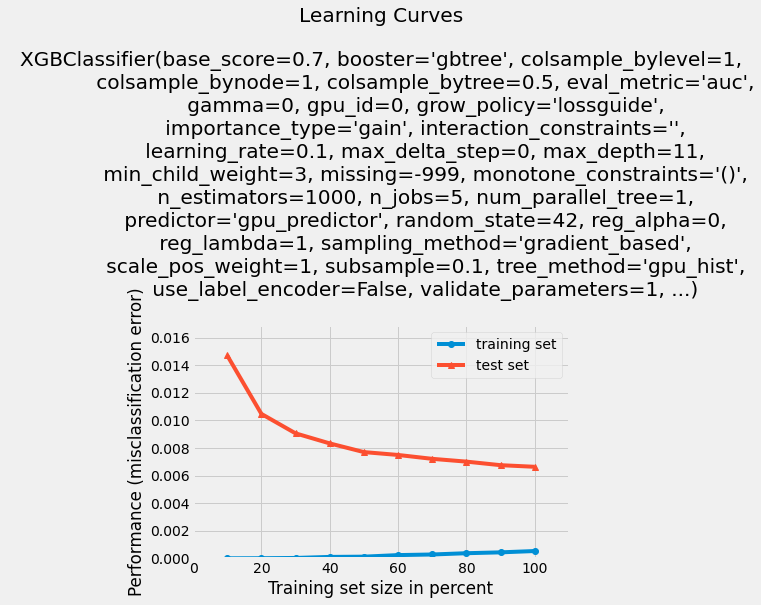

In [574]:
#plotting learning curve
plot_learning_curves(X_train, y_train, X_test, y_test, best_xgb_fit)

<AxesSubplot:title={'center':'Cumulative Gains Curve'}, xlabel='Percentage of sample', ylabel='Gain'>

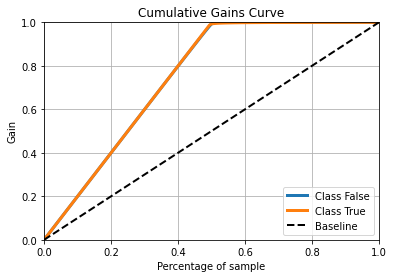

In [547]:
#calculating the cumulative gain
plot_cumulative_gain(y_test, os_xgb_probas)

1.997251889794014


<AxesSubplot:title={'center':'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

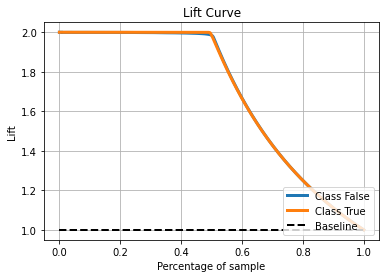

In [537]:
#calculating lift score
print(lift_score(y_test.to_numpy().astype(int), best_xgb_test_predict))
plot_lift_curve(y_test, os_xgb_probas)

<AxesSubplot:title={'center':'KS Statistic Plot'}, xlabel='Threshold', ylabel='Percentage below threshold'>

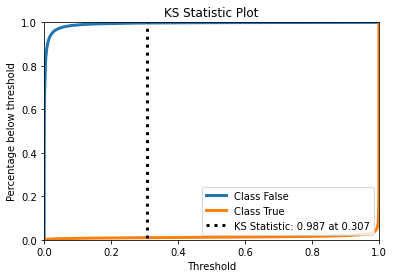

In [531]:
#plotting ks_statistics curve
plot_ks_statistic(y_test, os_xgb_probas)

In [365]:
# Final best xgb model prediction Submission:

sample_submission['isFraud'] = test_preds_xgb
sample_submission.to_csv(folder_path +'best_final_xgb_model_prediction.csv',index=False)

Doing feature selection by removing low importantce features for LGBM

<AxesSubplot:>

<Figure size 2160x432 with 0 Axes>

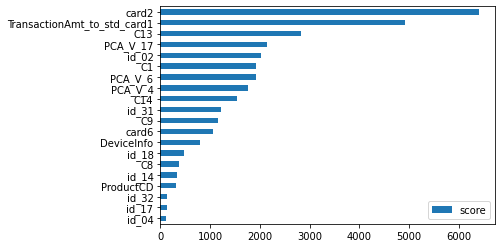

In [366]:
# visualize features importance

feature_importantance = best_xgb_fit.get_booster().get_score(importance_type='weight')
keys = list(feature_importantance.keys())
values = list(feature_importantance.values())

plt.figure(figsize= (30,6))
data_xgb = pd.DataFrame(data=values[:20], index=keys[:20], columns=["score"]).sort_values(by = "score", ascending=True)
data_xgb.plot(kind='barh')


In [367]:
#Saving trained model to pickle file:

joblib.dump(best_xgb_fit, folder_path +"models/best_xgb_final_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/best_xgb_final_model.pkl']

### Over-Sampled LightGBM

In [368]:
# base lgbm model with gpu enabled parameters
base_lgbm = LGBMClassifier(class_weight='balanced', boosting_type='gbdt', 
                           device= 'gpu',random_state = 42,gpu_use_dp=True,
                           objective = 'binary',n_jobs= 5)

# fit andpredict base lgbm model
base_lgbm_fit= base_lgbm.fit(X_train, y_train)
base_lgbm_train_predict = base_lgbm.predict(X_train)
base_lgbm_test_predict = base_lgbm.predict(X_test)

In [369]:
print('Parameters currently in use:\n')
print(base_lgbm_fit.get_params())

Parameters currently in use:

{'boosting_type': 'gbdt', 'class_weight': 'balanced', 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.1, 'max_depth': -1, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 100, 'n_jobs': -1, 'num_leaves': 31, 'objective': 'binary', 'random_state': 42, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'silent': True, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0, 'device': 'gpu', 'gpu_use_dp': True}


<Figure size 360x360 with 0 Axes>

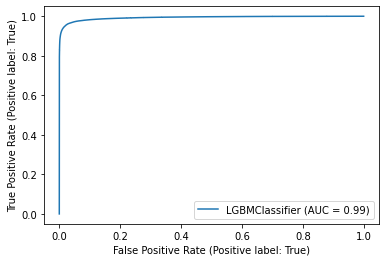

In [370]:
# plot roc_auc curve for base lgbm
plt.figure(figsize=(5,5))
plot_roc_curve(base_lgbm_fit, X_test, y_test)
plt.show() 

<Figure size 360x360 with 0 Axes>

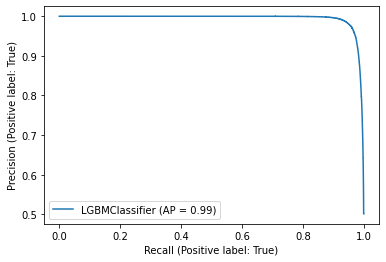

In [371]:
#plot precision_recall curve for base lgbm model
plt.figure(figsize= (5,5))
plot_precision_recall_curve(base_lgbm_fit, X_test, y_test) 
plt.show()

In [372]:
print('Train metrics for Base LGBM :\n')
print('ROC_AUC:', roc_auc_score(y_train, base_lgbm_train_predict))
print('Accuracy score:',accuracy_score(y_train, base_lgbm_train_predict))
print('Precision score:',precision_score(y_train, base_lgbm_train_predict))
print('Recall score:', recall_score(y_train, base_lgbm_train_predict))
print('F1 score:',f1_score(y_train, base_lgbm_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train, base_lgbm_train_predict))
print('Classification Report: \n', classification_report(y_train, base_lgbm_train_predict))

Train metrics for Base LGBM :

ROC_AUC: 0.9660673936143589
Accuracy score: 0.9660670123153019
Precision score: 0.9844612457623358
Recall score: 0.9470841817455994
F1 score: 0.965411074598446
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[392323   5954]
 [ 21076 377217]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.95      0.99      0.97    398277
        True       0.98      0.95      0.97    398293

    accuracy                           0.97    796570
   macro avg       0.97      0.97      0.97    796570
weighted avg       0.97      0.97      0.97    796570



In [373]:
print('Test metrics for Base LGBM : \n')
print('ROC_AUC:', roc_auc_score(y_test, base_lgbm_test_predict))
print('Accuracy score:',accuracy_score(y_test, base_lgbm_test_predict))
print('Precision score:',precision_score(y_test, base_lgbm_test_predict))
print('Recall score:', recall_score(y_test, base_lgbm_test_predict))
print('F1 score:',f1_score(y_test, base_lgbm_test_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_test, base_lgbm_test_predict))
print('Classification Report: \n', classification_report(y_test, base_lgbm_test_predict))

Test metrics for Base LGBM : 

ROC_AUC: 0.9652175730692554
Accuracy score: 0.9652184611058385
Precision score: 0.9835401722101109
Recall score: 0.9462697585039195
F1 score: 0.9645450636600339
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[167999   2703]
 [  9171 161515]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.95      0.98      0.97    170702
        True       0.98      0.95      0.96    170686

    accuracy                           0.97    341388
   macro avg       0.97      0.97      0.97    341388
weighted avg       0.97      0.97      0.97    341388



([0.030844746852128502,
  0.033907880035652864,
  0.032660866799737204,
  0.03407107975444719,
  0.03381498173418532,
  0.03329901954630478,
  0.03375006052736823,
  0.034584217331810135,
  0.034203592346630625,
  0.03393298768469814],
 [0.03538788709620725,
  0.035956155459477196,
  0.0346087150104866,
  0.03482840638803941,
  0.034866486226815235,
  0.034260138024769474,
  0.03446518331048543,
  0.035094965259470166,
  0.0350510269839596,
  0.03478153889416148])

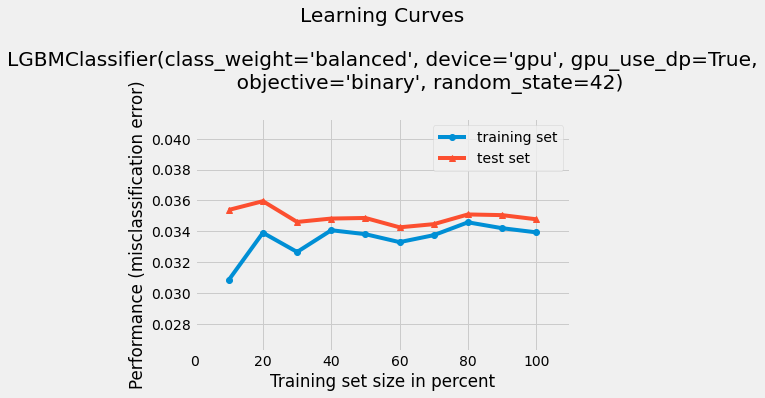

In [575]:
#plotting learning curve
plot_learning_curves(X_train, y_train, X_test, y_test, base_lgbm)

In [374]:
joblib.dump(base_lgbm_fit, folder_path +"models/lgbm_base_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/lgbm_base_model.pkl']

###  Over-Sampled LightGBM Hyperparameter Tuning(Dev Only)[DONT RUN]


In [417]:
# random grid for lgbm model
random_grid_lgbm = [{
            'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3, 0.4],
            'n_estimators': [200, 250, 300],
            'max_depth':   [11, 13],
            'colsample_bytree': [0.1, 0.2, 0.5, 0.7, 0.9, 1] ,
            'num_leaves': [ 100, 110, 120, 150],
            'min_child_samples': [20, 30, 50]
            
            }]

print(random_grid_lgbm)

[{'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3, 0.4], 'n_estimators': [200, 250, 300], 'max_depth': [11, 13], 'colsample_bytree': [0.1, 0.2, 0.5, 0.7, 0.9, 1], 'num_leaves': [100, 110, 120, 150], 'min_child_samples': [20, 30, 50]}]


In [418]:
# Using random grid to search for best hyperparameters

# Random search of parameters using 5 fold stratified cross validation,
skf_lgbm = StratifiedKFold(n_splits=5, shuffle=True,random_state =42)

# Cross vaidaation scores for each folds
fold_scores = cross_val_score(base_lgbm, X, y, cv = skf_lgbm)
   
print('Outcomes by CV folds:')
for i, x in enumerate(fold_scores):
    print('Fold ', (i+1, x))
print("\n")
print('Mean performance metric = ', np.mean(fold_scores))
print('STD of the metric       = ', np.std(fold_scores))

# search across 50 different combinations, and use all available cores
lgbm_random = RandomizedSearchCV(base_lgbm, 
                                 param_distributions=random_grid_lgbm, 
                                 n_iter=10, scoring='roc_auc',
                                 cv=skf_lgbm, n_jobs=5,verbose= 100, 
                                 random_state= 42)

# fit random search model
lgbm_model_fit= lgbm_random.fit(X_train, y_train)

Outcomes by CV folds:
Fold  (1, 0.8851033874442352)
Fold  (2, 0.8847726154733432)
Fold  (3, 0.8864000678512362)
Fold  (4, 0.8851024129595861)
Fold  (5, 0.8850091175098597)


Mean performance metric =  0.885277520247652
STD of the metric       =  0.0005741196353803525
Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [419]:
# predict using random grid 
best_random_lgbm_train_predict = lgbm_model_fit.predict(X_train)
best_random_lgbm_test_predict = lgbm_model_fit.predict(X_test)

In [420]:
print('Tuned best random Hyperparameters:\n')
print(lgbm_model_fit.best_estimator_.get_params())

Tuned best random Hyperparameters:

{'boosting_type': 'gbdt', 'class_weight': 'balanced', 'colsample_bytree': 0.5, 'importance_type': 'split', 'learning_rate': 0.2, 'max_depth': 11, 'min_child_samples': 30, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 200, 'n_jobs': -1, 'num_leaves': 150, 'objective': 'binary', 'random_state': 42, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'silent': True, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0, 'device': 'gpu', 'gpu_use_dp': True}


<Figure size 360x360 with 0 Axes>

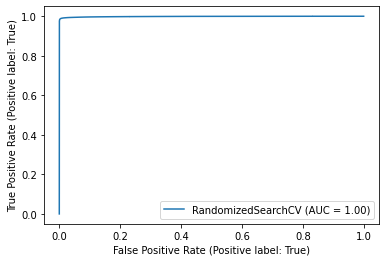

In [421]:
#plot roc_auc curve for random grid lgbm model
plt.figure(figsize= (5,5))
plot_roc_curve(lgbm_model_fit, X_test, y_test) 
plt.show()

<Figure size 360x360 with 0 Axes>

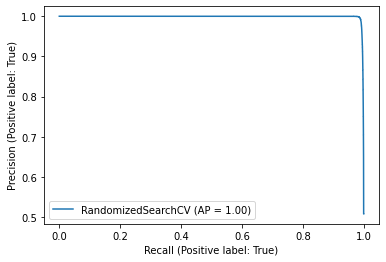

In [422]:
#plot precision_recall curve for Random grid lgbm  model
plt.figure(figsize= (5,5))
plot_precision_recall_curve(lgbm_model_fit, X_test, y_test) 
plt.show()

In [423]:
print('Train metrics for Random Grid LGBM :\n')
print('ROC_AUC:', roc_auc_score(y_train, best_random_lgbm_train_predict))
print('Accuracy score:',accuracy_score(y_train, best_random_lgbm_train_predict))
print('Precision score:',precision_score(y_train, best_random_lgbm_train_predict))
print('Recall score:', recall_score(y_train, best_random_lgbm_train_predict))
print('F1 score:',f1_score(y_train, best_random_lgbm_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train, best_random_lgbm_train_predict))
print('Classification Report: \n', classification_report(y_train, best_random_lgbm_train_predict))

Train metrics for Random Grid LGBM :

ROC_AUC: 0.9962590274655326
Accuracy score: 0.996258960292253
Precision score: 0.9996006359493363
Recall score: 0.9929147637543215
F1 score: 0.9962464826519482
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[398119    158]
 [  2822 395471]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.99      1.00      1.00    398277
        True       1.00      0.99      1.00    398293

    accuracy                           1.00    796570
   macro avg       1.00      1.00      1.00    796570
weighted avg       1.00      1.00      1.00    796570



In [424]:
print('Test metrics for Random Grid LGBM : \n')
print('ROC_AUC:', roc_auc_score(y_test, best_random_lgbm_test_predict))
print('Accuracy score:',accuracy_score(y_test, best_random_lgbm_test_predict))
print('Precision score:',precision_score(y_test, best_random_lgbm_test_predict))
print('Recall score:', recall_score(y_test, best_random_lgbm_test_predict))
print('F1 score:',f1_score(y_test, best_random_lgbm_test_predict))
print('TN \t FP \nFN \t TP') 
print('Confusion Matrix: \n',confusion_matrix(y_test, best_random_lgbm_test_predict))
print('Classification Report: \n', classification_report(y_test, best_random_lgbm_test_predict))

Test metrics for Random Grid LGBM : 

ROC_AUC: 0.9916865976443475
Accuracy score: 0.9916868782734015
Precision score: 0.9976459007839091
Recall score: 0.9856988856731074
F1 score: 0.9916364107883817
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[170305    397]
 [  2441 168245]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.99      1.00      0.99    170702
        True       1.00      0.99      0.99    170686

    accuracy                           0.99    341388
   macro avg       0.99      0.99      0.99    341388
weighted avg       0.99      0.99      0.99    341388



In [425]:
joblib.dump(lgbm_model_fit, folder_path +"models/lgbm_final_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/lgbm_final_model.pkl']

### Over-Sampled Best Fine tuned model(LGBM)

In [426]:
#Tuned best random Hyperparameters

# best lgbm model with gpu enabled parameters
best_lgbm = LGBMClassifier(boosting_type = 'gbdt' ,
                          class_weight = 'balanced' ,
                          colsample_bytree = 0.5,
                          importance_type = 'split' ,
                          learning_rate = 0.2,
                          max_depth = 11,
                          min_child_samples = 30,
                          min_child_weight = 0.001,
                          min_split_gain = 0.0,
                          n_estimators = 200,
                          n_jobs = 5,
                          num_leaves = 150,
                          objective = 'binary' ,
                          random_state = 42,
                          reg_alpha = 0.0,
                          reg_lambda = 0.0,
                          silent = True,
                          subsample = 1.0,
                          subsample_for_bin = 200000,
                          subsample_freq = 0,
                          device = 'gpu' ,
                          gpu_use_dp = True)

# fit and predict best lgbm model
best_lgbm_fit= best_lgbm.fit(X_train, y_train)
best_lgbm_train_predict = best_lgbm_fit.predict(X_train)
best_lgbm_test_predict = best_lgbm_fit.predict(X_test)

#probability predict 
os_lgbm_probas = best_lgbm_fit.predict_proba(X_test)

In [427]:
print('Train metrics for best LGBM :\n')
print('ROC_AUC:', roc_auc_score(y_train, best_lgbm_train_predict))
print('Accuracy score:',accuracy_score(y_train, best_lgbm_train_predict))
print('Precision score:',precision_score(y_train, best_lgbm_train_predict))
print('Recall score:', recall_score(y_train, best_lgbm_train_predict))
print('F1 score:',f1_score(y_train, best_lgbm_train_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_train, best_lgbm_train_predict))
print('Classification Report: \n', classification_report(y_train, best_lgbm_train_predict))

Train metrics for best LGBM :

ROC_AUC: 0.9962590274655326
Accuracy score: 0.996258960292253
Precision score: 0.9996006359493363
Recall score: 0.9929147637543215
F1 score: 0.9962464826519482
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[398119    158]
 [  2822 395471]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.99      1.00      1.00    398277
        True       1.00      0.99      1.00    398293

    accuracy                           1.00    796570
   macro avg       1.00      1.00      1.00    796570
weighted avg       1.00      1.00      1.00    796570



In [428]:
print('Test metrics for best LGBM : \n')
print('ROC_AUC:', roc_auc_score(y_test, best_lgbm_test_predict))
print('Accuracy score:',accuracy_score(y_test, best_lgbm_test_predict))
print('Precision score:',precision_score(y_test, best_lgbm_test_predict))
print('Recall score:', recall_score(y_test, best_lgbm_test_predict))
print('F1 score:',f1_score(y_test, best_lgbm_test_predict))
print('TN \t FP \nFN \t TP')
print('Confusion Matrix: \n',confusion_matrix(y_test, best_lgbm_test_predict))
print('Classification Report: \n', classification_report(y_test, best_lgbm_test_predict))

Test metrics for best LGBM : 

ROC_AUC: 0.9916865976443475
Accuracy score: 0.9916868782734015
Precision score: 0.9976459007839091
Recall score: 0.9856988856731074
F1 score: 0.9916364107883817
TN 	 FP 
FN 	 TP
Confusion Matrix: 
 [[170305    397]
 [  2441 168245]]
Classification Report: 
               precision    recall  f1-score   support

       False       0.99      1.00      0.99    170702
        True       1.00      0.99      0.99    170686

    accuracy                           0.99    341388
   macro avg       0.99      0.99      0.99    341388
weighted avg       0.99      0.99      0.99    341388



In [562]:
# avg_expected_loss, avg_bias, avg_var 
avg_expected_loss_lgbm_os, avg_bias_lgbm_os, avg_var_lgbm_os = bias_variance_decomp(
                                        best_lgbm_fit, X_train.values, y_train.values, 
                                        X_test.values.astype(int), y_test.values.astype(int), 
                                        loss='0-1_loss',
                                        random_seed=42)

print('Average expected loss: %.3f' % avg_expected_loss_lgbm_os)
print('Average bias: %.3f' % avg_bias_lgbm_os)
print('Average variance: %.3f' % avg_var_lgbm_os)

Average expected loss: 0.075
Average bias: 0.068
Average variance: 0.033


([0.0,
  0.00020713810462357358,
  0.0007908909449263718,
  0.0013338438555305875,
  0.0020211657481451722,
  0.0025316879453992323,
  0.00283895774562006,
  0.0031808252884241183,
  0.0034425376579863944,
  0.003741039707746965],
 [0.014133478622564356,
  0.011151534324580829,
  0.010067723528653615,
  0.009268046914361372,
  0.008983912732726399,
  0.008784725883745181,
  0.008664627930682976,
  0.008459582644967018,
  0.008251608140883687,
  0.008313121726598474])

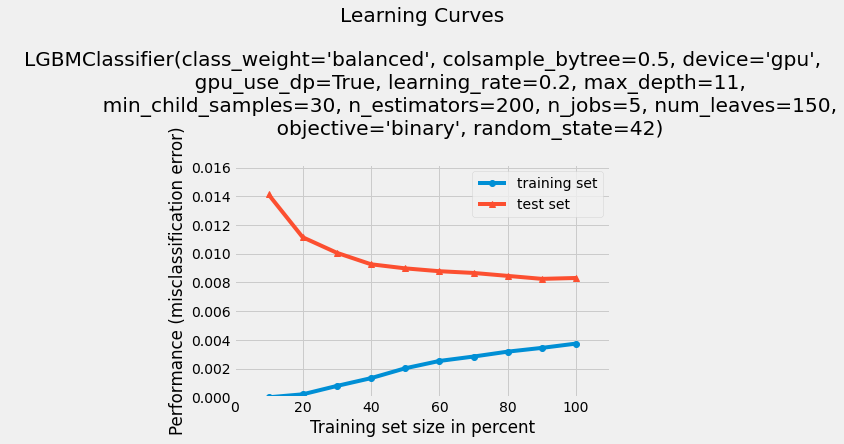

In [576]:
#plotting learning curve
plot_learning_curves(X_train, y_train, X_test, y_test, best_lgbm_fit)

<AxesSubplot:title={'center':'Cumulative Gains Curve'}, xlabel='Percentage of sample', ylabel='Gain'>

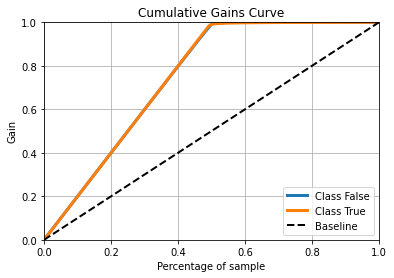

In [548]:
#calculating the cumulative gain
plot_cumulative_gain(y_test, os_lgbm_probas)

1.9953853202771004


<AxesSubplot:title={'center':'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

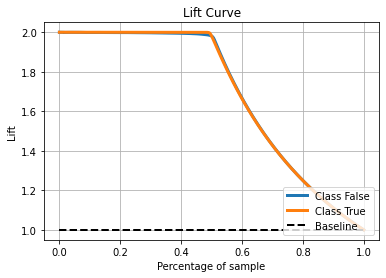

In [534]:
#calculating lift score
print(lift_score(y_test.to_numpy().astype(int), best_lgbm_test_predict))
plot_lift_curve(y_test, os_lgbm_probas)

<AxesSubplot:title={'center':'KS Statistic Plot'}, xlabel='Threshold', ylabel='Percentage below threshold'>

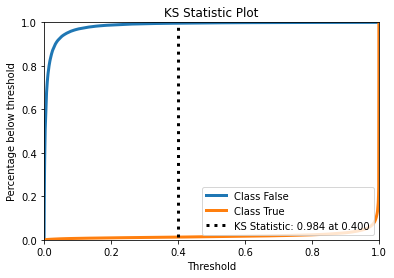

In [533]:
#plotting ks_statistics plot
plot_ks_statistic(y_test, os_lgbm_probas)

So we can see that the largest difference is at a cutoff point of 0.4 of top predictions. After that threshold, it decreases at a moderate rate as we increase the percentage of top predictions. Around 0.98 it is really getting worse really fast. So even though the best separation is at 0.4 we could potentially push it a bit higher to get more positively classified observations.

In [429]:
# The Second Submission(LGBM Fine Tuned Model)
test_preds_lgbm = best_lgbm_fit.predict(test)
test_preds_lgbm

array([False, False, False, ..., False, False, False])

In [430]:
# Final best lgbm model prediction Submission:

sample_submission['isFraud'] = test_preds_lgbm
sample_submission.to_csv(folder_path+'best_final_lgbm_prediction.csv',index=False)

Doing feature selection by removing low importantce features for LGBM

<AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

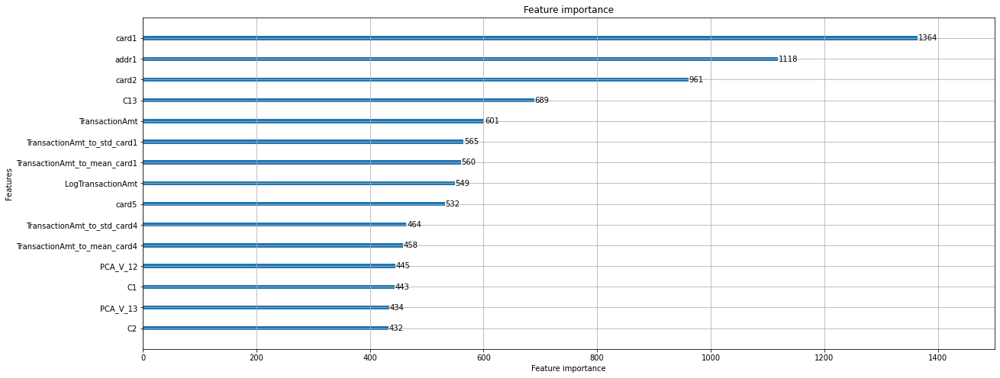

In [431]:
# visualize features with importantce score > 0

plot_importance(best_lgbm_fit,title='Feature importance', xlabel='Feature importance', ylabel='Features',
                max_num_features =15, figsize= (20,8),ignore_zero = True)

In [432]:
joblib.dump(best_lgbm_fit, folder_path +"models/best_lgbm_final_model.pkl")

['C:/Users/dines/Downloads/Imarticus/Capstone Project 1/Dataset/models/best_lgbm_final_model.pkl']

Comparing Calibration Curve for above over-sampled models:

<AxesSubplot:title={'center':'Calibration plots (Reliability Curves)'}, xlabel='Mean predicted value', ylabel='Fraction of positives'>

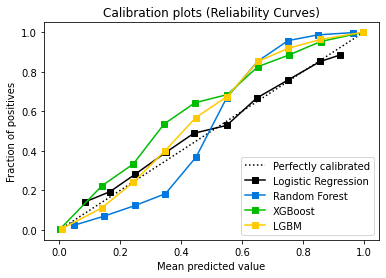

In [515]:
#list of predicted probability
os_probas_list = [os_lr_probas, os_rf_probas, os_xgb_probas, os_lgbm_probas]
#plotting curve for each classifier
os_clf_names = ['Logistic Regression','Random Forest','XGBoost', 'LGBM']
plot_calibration_curve(y_test, os_probas_list, os_clf_names)

In future, 

- I will automate the pipeline for almost one click executions and recode for deployment purposes.
- Further,I will be building wrapper models to increase the precision and recall rates and integrating it with the automated       pipeline.


## Thank You